<a href="https://colab.research.google.com/github/Shakin2/Analytics/blob/main/job_search_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# SUMMARY STATISTICS

import pandas as pd
from scipy import stats
import numpy as np

# Load dataset
data_path = '/content/Job Search data.csv'  # Update this to your dataset's path
data = pd.read_csv(data_path)

# Calculate summary statistics for the dataset
summary_statistics = data.describe()

# Check for any missing values in the dataset
missing_values = data.isnull().sum()

summary_statistics, missing_values

(       time until reemployment          Age  Daily wage (euro)         Male  \
 count              2173.000000  2173.000000        2173.000000  2173.000000   
 mean                148.326277    34.726464          10.341904     0.148642   
 std                 130.796842    10.668491           4.005872     0.355818   
 min                   4.000000    20.288030           3.043750     0.000000   
 25%                  48.000000    25.120470           7.675000     0.000000   
 50%                  98.000000    31.675060           9.851250     0.000000   
 75%                 195.000000    43.834190          12.410000     0.000000   
 max                 621.000000    59.842840          22.128750     1.000000   
 
        older than 50    low skill     training  total duration of UI benefits  
 count    2173.000000  2173.000000  2173.000000                    2173.000000  
 mean        0.122411     0.076852     0.161528                     489.056144  
 std         0.327836     0.266418 

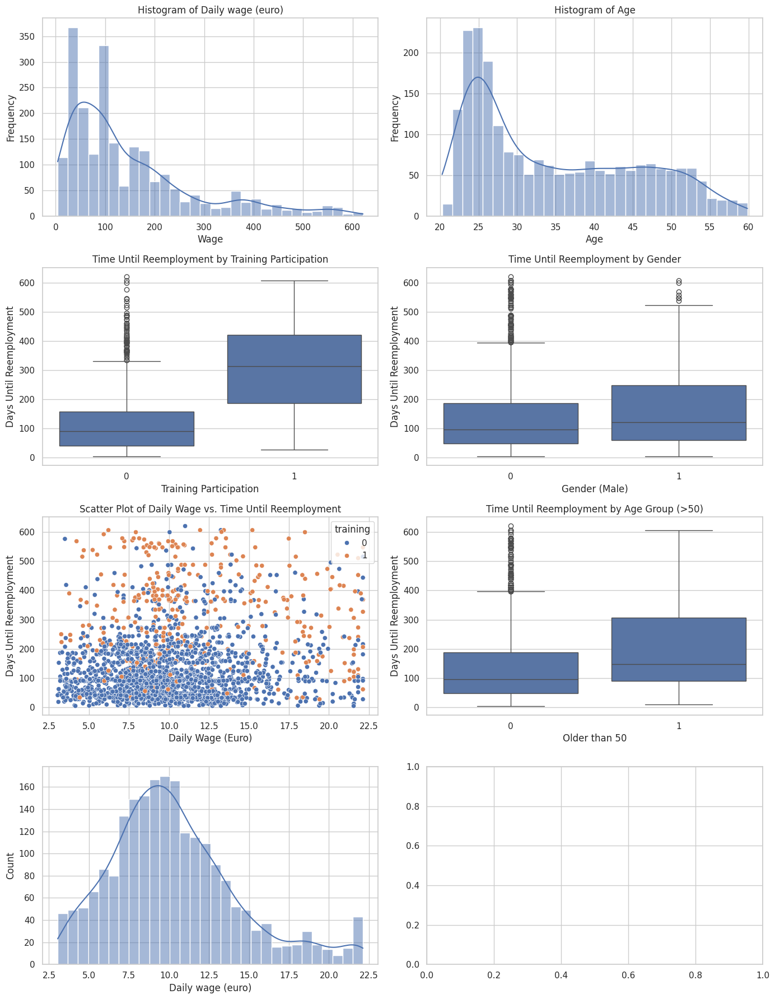

In [ ]:
# VISULISATIONS

import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Creating a figure to host the plots
fig, axes = plt.subplots(4, 2, figsize=(14, 18))

# Plotting histograms and boxplots for key variables
sns.histplot(data['time until reemployment'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Histogram of Time Until Reemployment')
axes[0, 0].set_xlabel('Days')
axes[0, 0].set_ylabel('Frequency')

sns.histplot(data['Daily wage (euro)'], bins=30, kde=True, ax=axes[3, 0])
axes[0, 0].set_title('Histogram of Daily wage (euro)')
axes[0, 0].set_xlabel('Wage')
axes[0, 0].set_ylabel('Frequency')

sns.histplot(data['Age'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Histogram of Age')
axes[0, 1].set_xlabel('Age')
axes[0, 1].set_ylabel('Frequency')

sns.boxplot(x='training', y='time until reemployment', data=data, ax=axes[1, 0])
axes[1, 0].set_title('Time Until Reemployment by Training Participation')
axes[1, 0].set_xlabel('Training Participation')
axes[1, 0].set_ylabel('Days Until Reemployment')

sns.boxplot(x='Male', y='time until reemployment', data=data, ax=axes[1, 1])
axes[1, 1].set_title('Time Until Reemployment by Gender')
axes[1, 1].set_xlabel('Gender (Male)')
axes[1, 1].set_ylabel('Days Until Reemployment')

sns.scatterplot(x='Daily wage (euro)', y='time until reemployment', hue='training', data=data, ax=axes[2, 0])
axes[2, 0].set_title('Scatter Plot of Daily Wage vs. Time Until Reemployment')
axes[2, 0].set_xlabel('Daily Wage (Euro)')
axes[2, 0].set_ylabel('Days Until Reemployment')

sns.boxplot(x='older than 50', y='time until reemployment', data=data, ax=axes[2, 1])
axes[2, 1].set_title('Time Until Reemployment by Age Group (>50)')
axes[2, 1].set_xlabel('Older than 50')
axes[2, 1].set_ylabel('Days Until Reemployment')

plt.tight_layout()
plt.show()


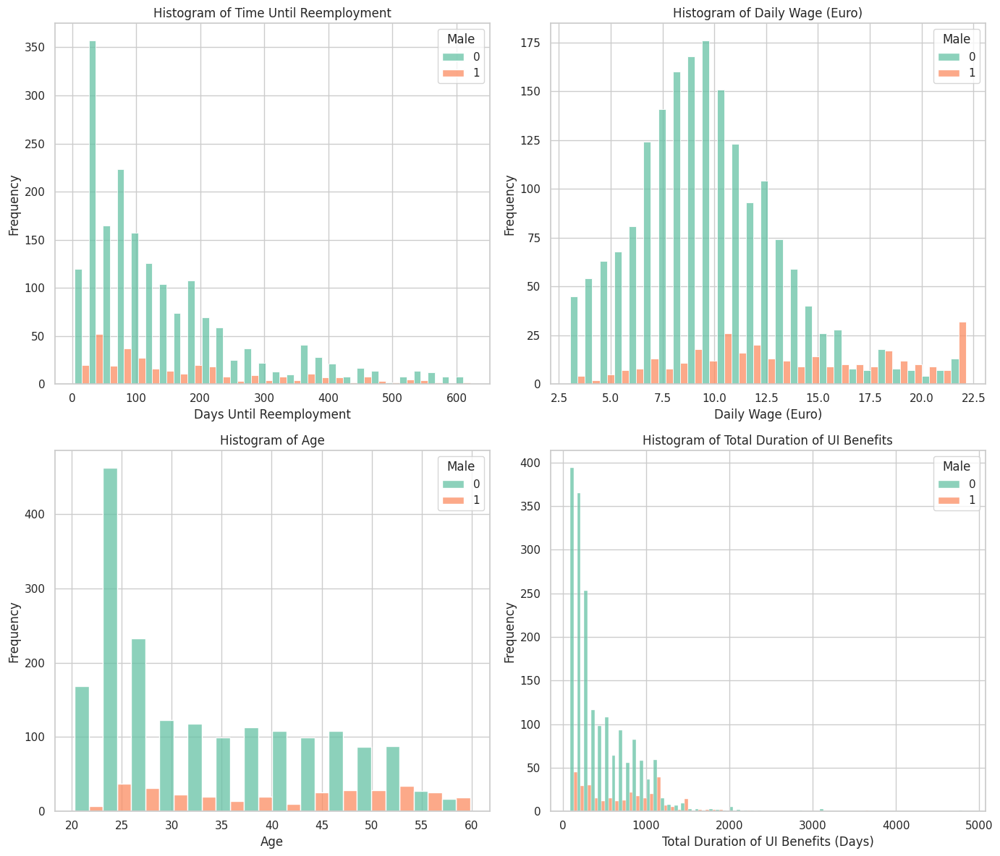

In [ ]:
# MALE FEMALE HISTOGRAM OF VARIABLES

# Creating histograms for the requested variables with different color bars for male and female placed side by side

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Histogram for Time Until Reemployment
sns.histplot(data=data, x='time until reemployment', hue='Male', multiple='dodge', palette='Set2', ax=axes[0, 0])
axes[0, 0].set_title('Histogram of Time Until Reemployment')
axes[0, 0].set_xlabel('Days Until Reemployment')
axes[0, 0].set_ylabel('Frequency')

# Histogram for Daily Wage (Euro)
sns.histplot(data=data, x='Daily wage (euro)', hue='Male', multiple='dodge', palette='Set2', ax=axes[0, 1])
axes[0, 1].set_title('Histogram of Daily Wage (Euro)')
axes[0, 1].set_xlabel('Daily Wage (Euro)')
axes[0, 1].set_ylabel('Frequency')

# Histogram for Age
sns.histplot(data=data, x='Age', hue='Male', multiple='dodge', palette='Set2', ax=axes[1, 0])
axes[1, 0].set_title('Histogram of Age')
axes[1, 0].set_xlabel('Age')
axes[1, 0].set_ylabel('Frequency')

# Histogram for Total Duration of UI Benefits
sns.histplot(data=data, x='total duration of UI benefits', hue='Male', multiple='dodge', palette='Set2', ax=axes[1, 1])
axes[1, 1].set_title('Histogram of Total Duration of UI Benefits')
axes[1, 1].set_xlabel('Total Duration of UI Benefits (Days)')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


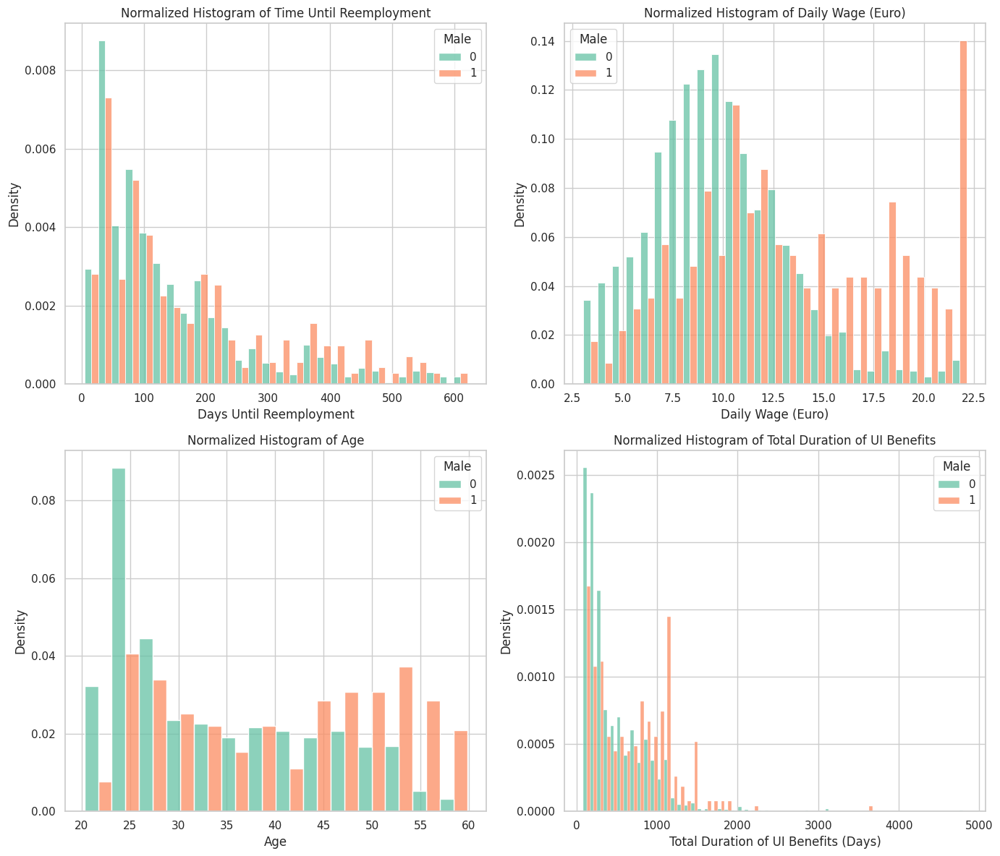

In [ ]:
# NORMALISED HISTOGRAM - MALE/FEMALE

# Creating normalized histograms for the requested variables with different color bars for male and female

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Normalized Histogram for Time Until Reemployment
sns.histplot(data=data, x='time until reemployment', hue='Male', multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 0])
axes[0, 0].set_title('Normalized Histogram of Time Until Reemployment')
axes[0, 0].set_xlabel('Days Until Reemployment')
axes[0, 0].set_ylabel('Density')

# Normalized Histogram for Daily Wage (Euro)
sns.histplot(data=data, x='Daily wage (euro)', hue='Male', multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 1])
axes[0, 1].set_title('Normalized Histogram of Daily Wage (Euro)')
axes[0, 1].set_xlabel('Daily Wage (Euro)')
axes[0, 1].set_ylabel('Density')

# Normalized Histogram for Age
sns.histplot(data=data, x='Age', hue='Male', multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 0])
axes[1, 0].set_title('Normalized Histogram of Age')
axes[1, 0].set_xlabel('Age')
axes[1, 0].set_ylabel('Density')

# Normalized Histogram for Total Duration of UI Benefits
sns.histplot(data=data, x='total duration of UI benefits', hue='Male', multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 1])
axes[1, 1].set_title('Normalized Histogram of Total Duration of UI Benefits')
axes[1, 1].set_xlabel('Total Duration of UI Benefits (Days)')
axes[1, 1].set_ylabel('Density')

plt.tight_layout()
plt.show()


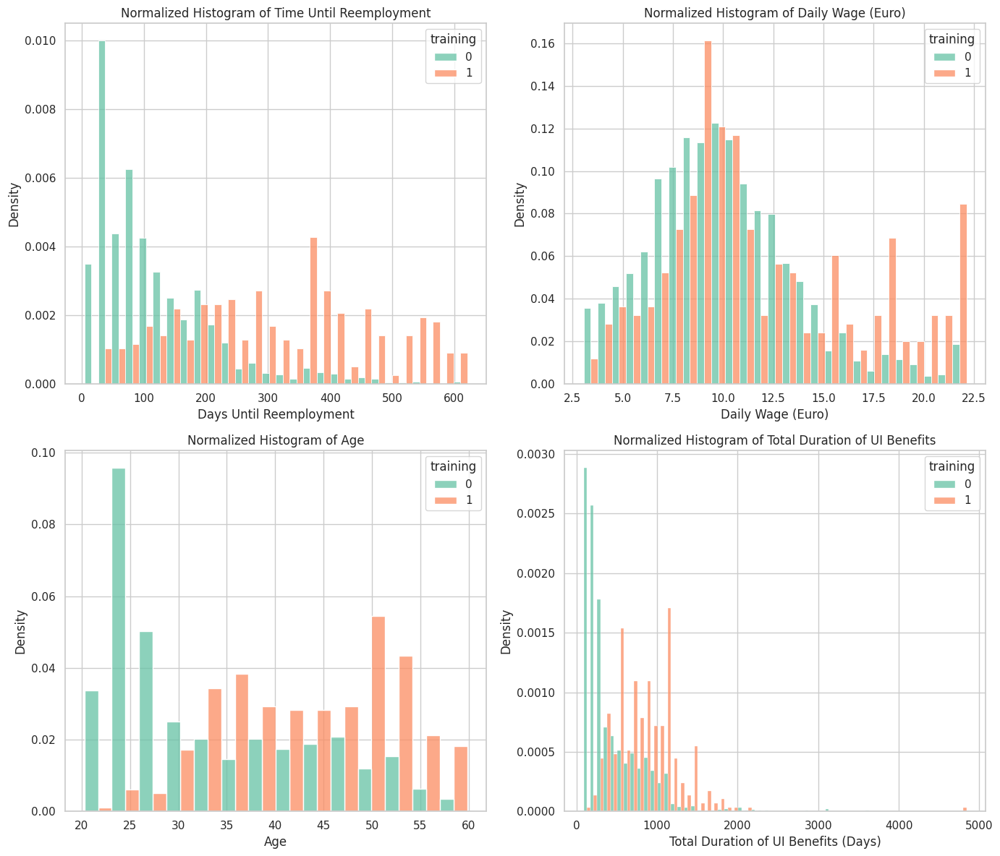

In [ ]:
# NORMALISED HISTOGRAM - TRAIN/NO TRAIN

# Creating normalized histograms for the requested variables with different color bars for male and female

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
sorthue = 'training'

# Normalized Histogram for Time Until Reemployment
sns.histplot(data=data, x='time until reemployment', hue= sorthue , multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 0])
axes[0, 0].set_title('Normalized Histogram of Time Until Reemployment')
axes[0, 0].set_xlabel('Days Until Reemployment')
axes[0, 0].set_ylabel('Density')

# Normalized Histogram for Daily Wage (Euro)
sns.histplot(data=data, x='Daily wage (euro)', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 1])
axes[0, 1].set_title('Normalized Histogram of Daily Wage (Euro)')
axes[0, 1].set_xlabel('Daily Wage (Euro)')
axes[0, 1].set_ylabel('Density')

# Normalized Histogram for Age
sns.histplot(data=data, x='Age', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 0])
axes[1, 0].set_title('Normalized Histogram of Age')
axes[1, 0].set_xlabel('Age')
axes[1, 0].set_ylabel('Density')

# Normalized Histogram for Total Duration of UI Benefits
sns.histplot(data=data, x='total duration of UI benefits', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 1])
axes[1, 1].set_title('Normalized Histogram of Total Duration of UI Benefits')
axes[1, 1].set_xlabel('Total Duration of UI Benefits (Days)')
axes[1, 1].set_ylabel('Density')

plt.tight_layout()
plt.show()

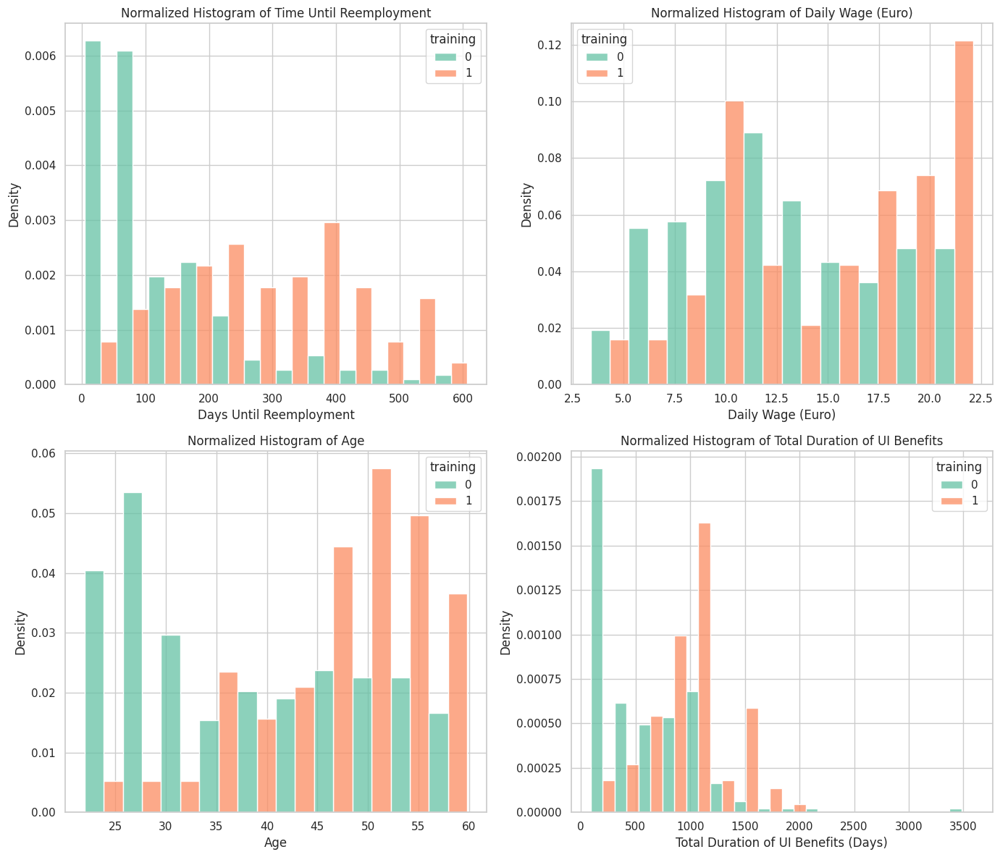

In [ ]:
# NORMALISED HISTOGRAM - TRAIN/NO TRAIN For Male

# Filter to include only males
gender_data = data[data['Male'] == 1]

# Creating normalized histograms for the requested variables with different color bars for male and female

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
sorthue = 'training'

# Normalized Histogram for Time Until Reemployment
sns.histplot(data=gender_data, x='time until reemployment', hue= sorthue , multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 0])
axes[0, 0].set_title('Normalized Histogram of Time Until Reemployment')
axes[0, 0].set_xlabel('Days Until Reemployment')
axes[0, 0].set_ylabel('Density')

# Normalized Histogram for Daily Wage (Euro)
sns.histplot(data=gender_data, x='Daily wage (euro)', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 1])
axes[0, 1].set_title('Normalized Histogram of Daily Wage (Euro)')
axes[0, 1].set_xlabel('Daily Wage (Euro)')
axes[0, 1].set_ylabel('Density')

# Normalized Histogram for Age
sns.histplot(data=gender_data, x='Age', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 0])
axes[1, 0].set_title('Normalized Histogram of Age')
axes[1, 0].set_xlabel('Age')
axes[1, 0].set_ylabel('Density')

# Normalized Histogram for Total Duration of UI Benefits
sns.histplot(data=gender_data, x='total duration of UI benefits', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 1])
axes[1, 1].set_title('Normalized Histogram of Total Duration of UI Benefits')
axes[1, 1].set_xlabel('Total Duration of UI Benefits (Days)')
axes[1, 1].set_ylabel('Density')

plt.tight_layout()
plt.show()

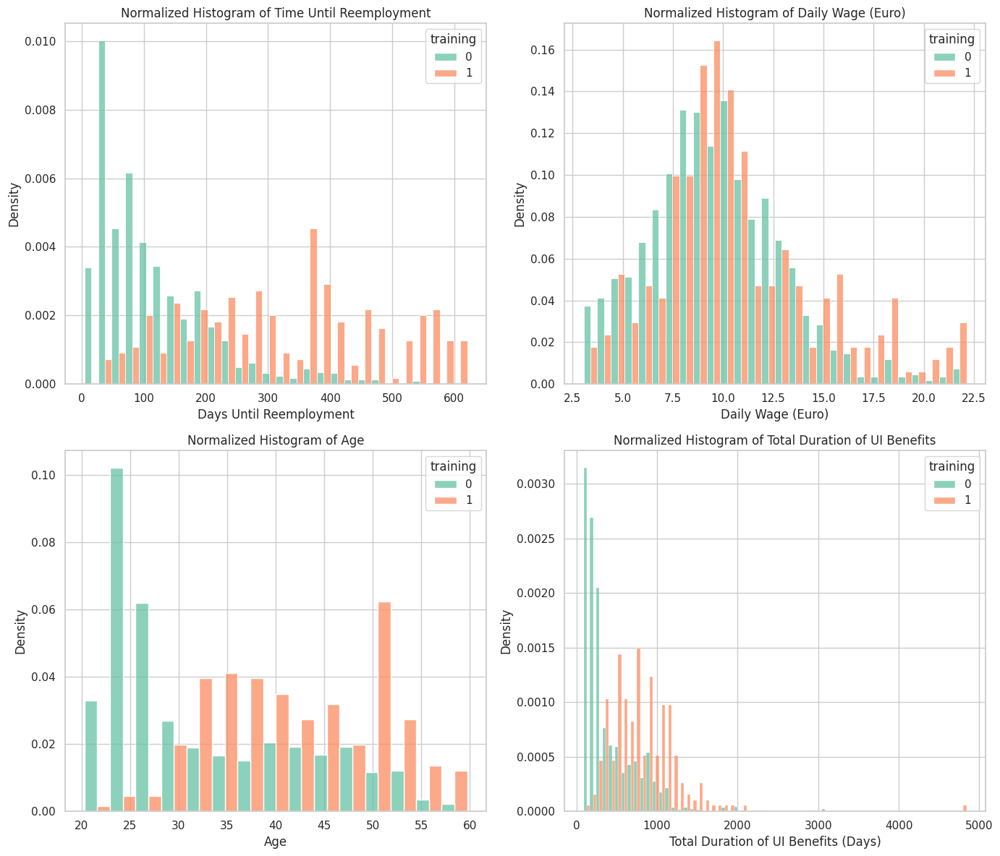

In [ ]:
# NORMALISED HISTOGRAM - TRAIN/NO TRAIN For Feale

# Filter to include only Females
gender_data = data[data['Male'] == 0]

# Creating normalized histograms for the requested variables with different color bars for male and female

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
sorthue = 'training'

# Normalized Histogram for Time Until Reemployment
sns.histplot(data=gender_data, x='time until reemployment', hue= sorthue , multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 0])
axes[0, 0].set_title('Normalized Histogram of Time Until Reemployment')
axes[0, 0].set_xlabel('Days Until Reemployment')
axes[0, 0].set_ylabel('Density')

# Normalized Histogram for Daily Wage (Euro)
sns.histplot(data=gender_data, x='Daily wage (euro)', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[0, 1])
axes[0, 1].set_title('Normalized Histogram of Daily Wage (Euro)')
axes[0, 1].set_xlabel('Daily Wage (Euro)')
axes[0, 1].set_ylabel('Density')

# Normalized Histogram for Age
sns.histplot(data=gender_data, x='Age', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 0])
axes[1, 0].set_title('Normalized Histogram of Age')
axes[1, 0].set_xlabel('Age')
axes[1, 0].set_ylabel('Density')

# Normalized Histogram for Total Duration of UI Benefits
sns.histplot(data=gender_data, x='total duration of UI benefits', hue= sorthue, multiple='dodge', palette='Set2', stat='density', common_norm=False, ax=axes[1, 1])
axes[1, 1].set_title('Normalized Histogram of Total Duration of UI Benefits')
axes[1, 1].set_xlabel('Total Duration of UI Benefits (Days)')
axes[1, 1].set_ylabel('Density')

plt.tight_layout()
plt.show()

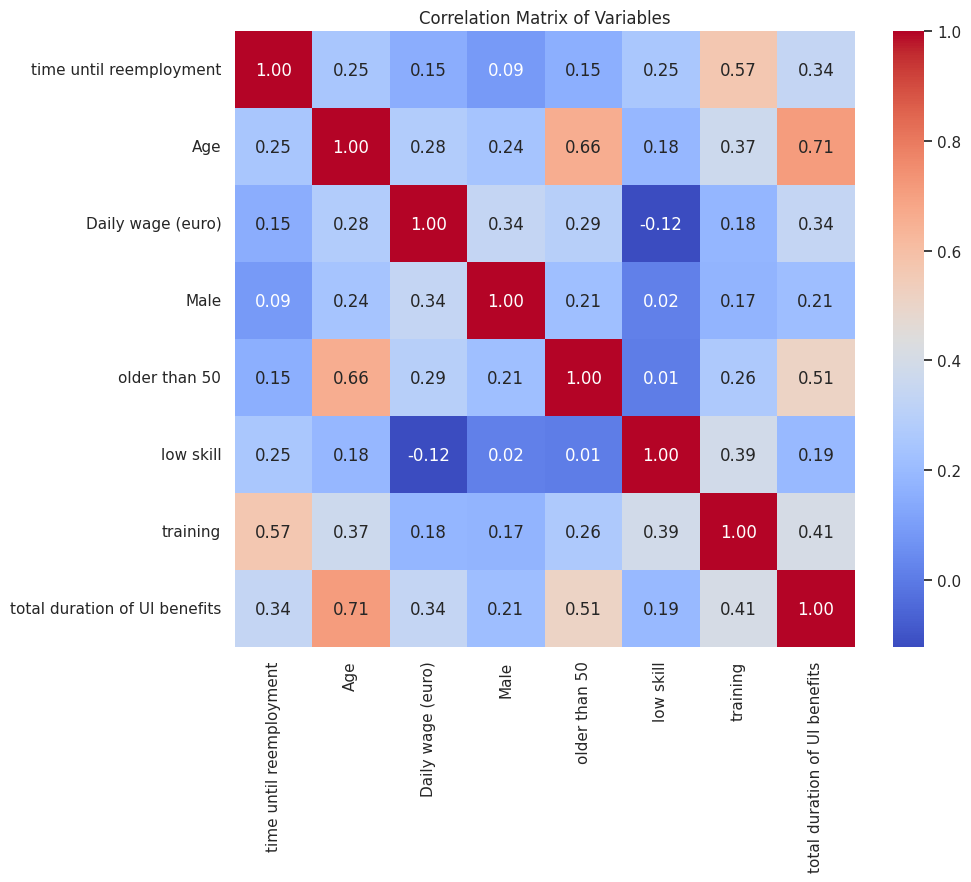

In [ ]:
# CORRELATION MATRIX

# Calculate the correlation matrix for the dataset
correlation_matrix = data.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Variables')
plt.show()


<ipython-input-38-6b07b168ce54>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='age_group', y='Daily wage (euro)', data=data, palette='viridis', ax=axes[2])


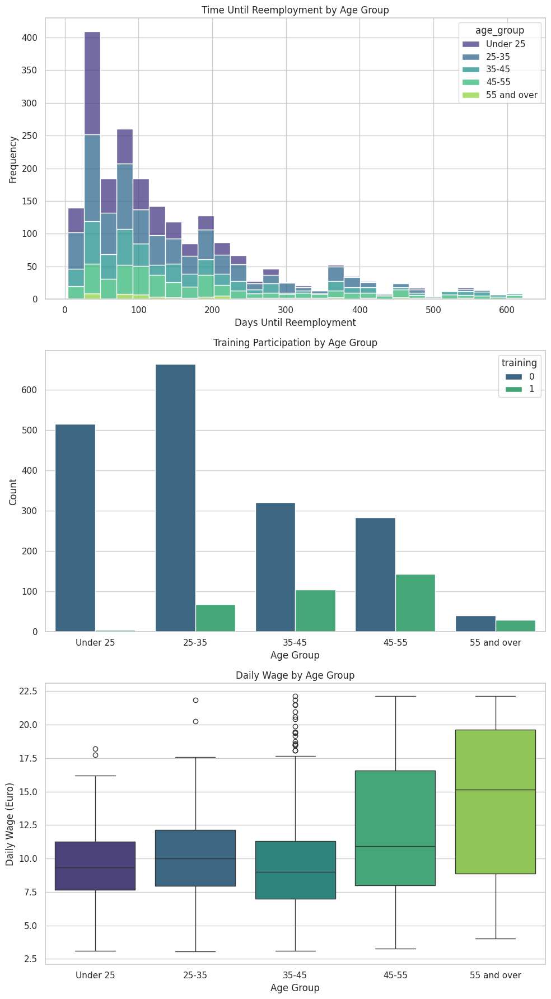

In [ ]:
# RUN ON AGE BUCKETS

# Defining age buckets for analysis
bins = [0, 25, 35, 45, 55, 65]
labels = ['Under 25', '25-35', '35-45', '45-55', '55 and over']
data['age_group'] = pd.cut(data['Age'], bins=bins, labels=labels, right=False)

# Creating histograms to analyze time until reemployment, training participation, and daily wage across age groups

fig, axes = plt.subplots(3, 1, figsize=(10, 18))

# Histogram of Time Until Reemployment by Age Group
sns.histplot(data=data, x='time until reemployment', hue='age_group', multiple='stack', palette='viridis', ax=axes[0])
axes[0].set_title('Time Until Reemployment by Age Group')
axes[0].set_xlabel('Days Until Reemployment')
axes[0].set_ylabel('Frequency')

# Count plot of Training Participation by Age Group
sns.countplot(x='age_group', hue='training', data=data, palette='viridis', ax=axes[1])
axes[1].set_title('Training Participation by Age Group')
axes[1].set_xlabel('Age Group')
axes[1].set_ylabel('Count')

# Boxplot of Daily Wage by Age Group
sns.boxplot(x='age_group', y='Daily wage (euro)', data=data, palette='viridis', ax=axes[2])
axes[2].set_title('Daily Wage by Age Group')
axes[2].set_xlabel('Age Group')
axes[2].set_ylabel('Daily Wage (Euro)')

plt.tight_layout()
plt.show()

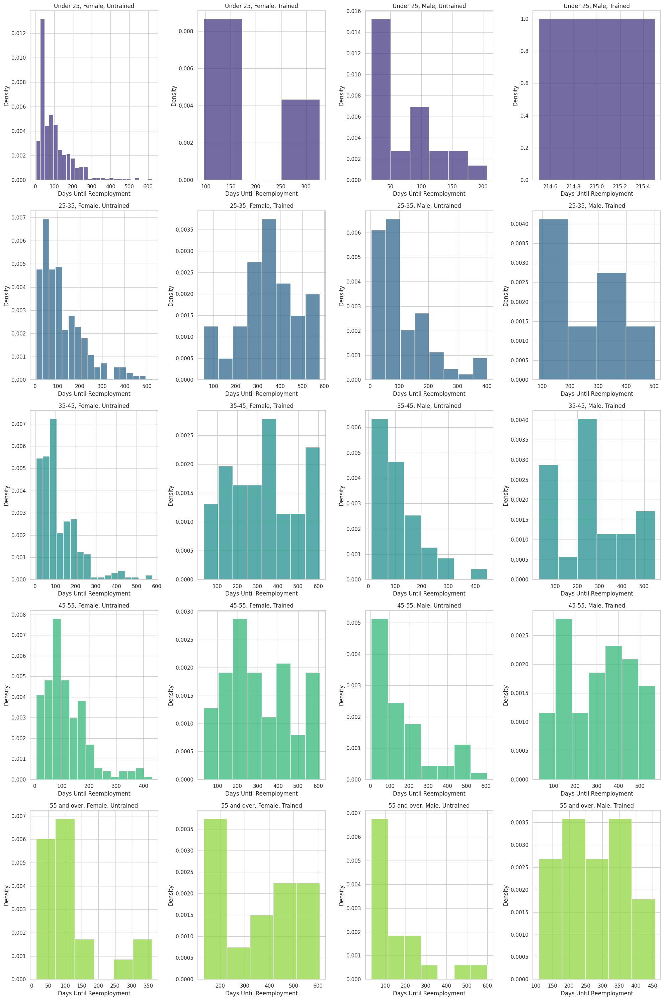

In [ ]:

# RUN ON AGE BUCKETS BY MALE?FEMALE AND TRAIN/NO TRAIN

# Adjusting the layout to have 5 rows of 4 histograms, each row representing an age group with four sub-categories

# Setting up the figure for multiple histograms
fig, axes = plt.subplots(5, 4, figsize=(20, 30))

# Loop through each combination of age group, gender, and training for plotting
for i, age in enumerate(labels):
    for j, gender in enumerate([0, 1]):  # 0 for female, 1 for male
        for k, train in enumerate([0, 1]):  # 0 for no train, 1 for train
            ax = axes[i, j*2 + k]
            subset = data[(data['Male'] == gender) & (data['training'] == train) & (data['age_group'] == age)]
            title = f"{age}, {'Male' if gender == 1 else 'Female'}, {'Trained' if train == 1 else 'Untrained'}"
            sns.histplot(subset, x='time until reemployment', hue='age_group', multiple='stack', stat='density', common_norm=False, palette='viridis', ax=ax)
            ax.set_title(title)
            ax.set_xlabel('Days Until Reemployment')
            ax.set_ylabel('Density')
            ax.legend_.remove()

plt.tight_layout()
plt.show()


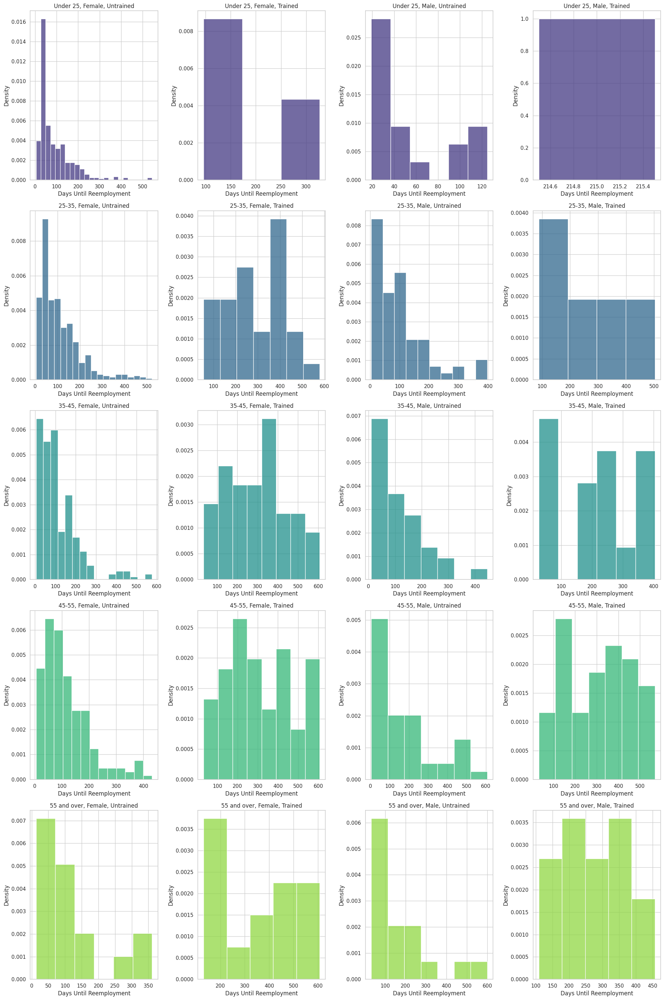

In [ ]:
# HISTOGRAMS ON PEOPLE WHO DID NOT RUN OUT OF UI

# Creating a new field to indicate whether Time Until Reemployment equals Total Duration of UI Benefits
data['reemployment_equals_UI'] = (data['time until reemployment'] == data['total duration of UI benefits']).astype(int)

# Filtering the data to include only rows where Time Until Reemployment does not equal Total Duration of UI Benefits
filtered_data = data[data['reemployment_equals_UI'] == 0]

# Setting up the figure for the adjusted multiple histograms based on the new filtered data
fig, axes = plt.subplots(5, 4, figsize=(20, 30))

# Loop through each combination of age group, gender, and training for plotting on the filtered dataset
for i, age in enumerate(labels):
    for j, gender in enumerate([0, 1]):  # 0 for female, 1 for male
        for k, train in enumerate([0, 1]):  # 0 for no train, 1 for train
            ax = axes[i, j*2 + k]
            subset = filtered_data[(filtered_data['Male'] == gender) & (filtered_data['training'] == train) & (filtered_data['age_group'] == age)]
            title = f"{age}, {'Male' if gender == 1 else 'Female'}, {'Trained' if train == 1 else 'Untrained'}"
            sns.histplot(subset, x='time until reemployment', hue='age_group', multiple='stack', stat='density', common_norm=False, palette='viridis', ax=ax)
            ax.set_title(title)
            ax.set_xlabel('Days Until Reemployment')
            ax.set_ylabel('Density')
            ax.legend_.remove()

plt.tight_layout()
plt.show()




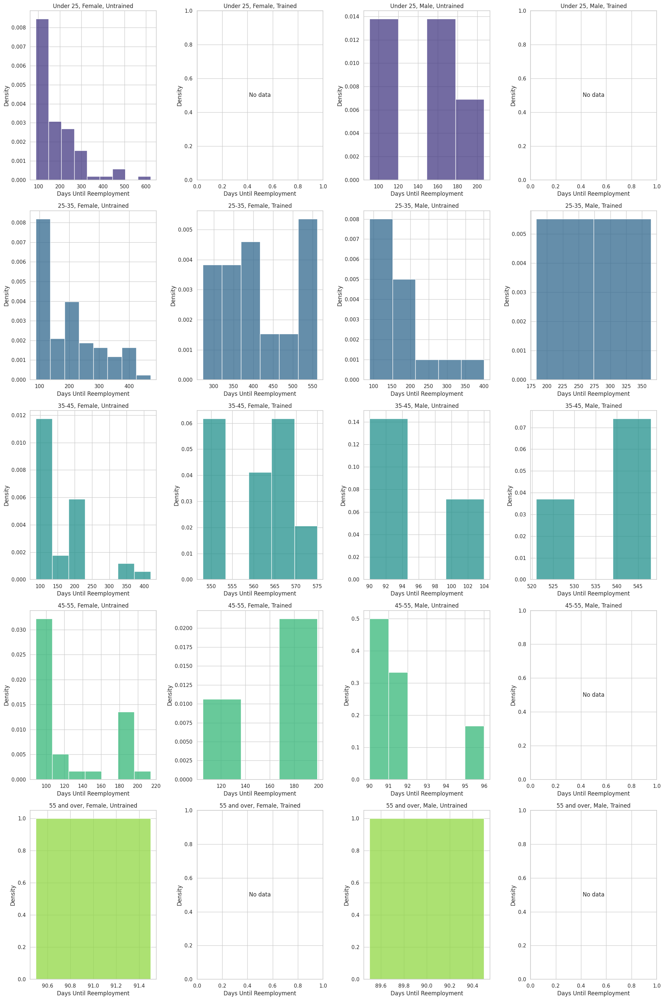

In [ ]:
# HISTOGRAMS ON PEOPLE WHO DID RUN OUT OF UI

# Creating a new field to indicate whether Time Until Reemployment equals Total Duration of UI Benefits
data['reemployment_equals_UI'] = (data['time until reemployment'] == data['total duration of UI benefits']).astype(int)

# Filtering the data to include only rows where Time Until Reemployment does equal Total Duration of UI Benefits
filtered_data = data[data['reemployment_equals_UI'] == 1]

# Setting up the figure for the adjusted multiple histograms based on the new filtered data
fig, axes = plt.subplots(5, 4, figsize=(20, 30))  # Adjust the dimensions of the subplot grid as necessary

# Loop through each combination of age group, gender, and training for plotting on the filtered dataset
for i, age in enumerate(labels):
    for j, gender in enumerate([0, 1]):  # 0 for female, 1 for male
        for k, train in enumerate([0, 1]):  # 0 for no train, 1 for train
            ax = axes[i, j*2 + k]
            subset = filtered_data[(filtered_data['Male'] == gender) & (filtered_data['training'] == train) & (filtered_data['age_group'] == age)]
            if subset.empty:
                ax.text(0.5, 0.5, 'No data', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
                ax.set_title(f"{age}, {'Male' if gender == 1 else 'Female'}, {'Trained' if train == 1 else 'Untrained'}")
                ax.set_xlabel('Days Until Reemployment')
                ax.set_ylabel('Density')
            else:
                sns.histplot(subset, x='time until reemployment', hue='age_group', multiple='stack', stat='density', common_norm=False, palette='viridis', ax=ax)
                ax.set_title(f"{age}, {'Male' if gender == 1 else 'Female'}, {'Trained' if train == 1 else 'Untrained'}")
                ax.set_xlabel('Days Until Reemployment')
                ax.set_ylabel('Density')
                ax.legend_.remove()

plt.tight_layout()
plt.show()



In [ ]:
# Calculating descriptive statistics for the new field 'reemployment_equals_UI'
descriptive_stats = data['reemployment_equals_UI'].describe()
descriptive_stats

# Filtering the data to show rows where 'reemployment_equals_UI' is 1 and displaying the top 10 rows
top_rows_with_ones = data[data['reemployment_equals_UI'] == 1].head(10)
top_rows_with_ones


,time until reemployment,Age,Daily wage (euro),Male,older than 50,low skill,training,total duration of UI benefits,age_group,reemployment_equals_UI
2,183,50.93363,7.99375,0,1,0,0,183,45-55,1
6,98,46.71996,7.13000,0,0,0,0,98,45-55,1
33,90,52.74614,6.58625,0,1,0,0,90,45-55,1
42,91,47.56051,7.45875,0,0,0,0,91,45-55,1
45,91,48.57628,7.14375,0,0,1,0,91,45-55,1
47,91,50.52568,7.64625,1,1,0,0,91,45-55,1
57,119,54.74209,8.96625,0,1,0,0,119,45-55,1
58,183,43.69182,8.65375,0,0,0,0,183,35-45,1
63,91,45.27982,5.25375,0,0,0,0,91,45-55,1
82,91,51.70299,14.83375,0,1,0,0,91,45-55,1


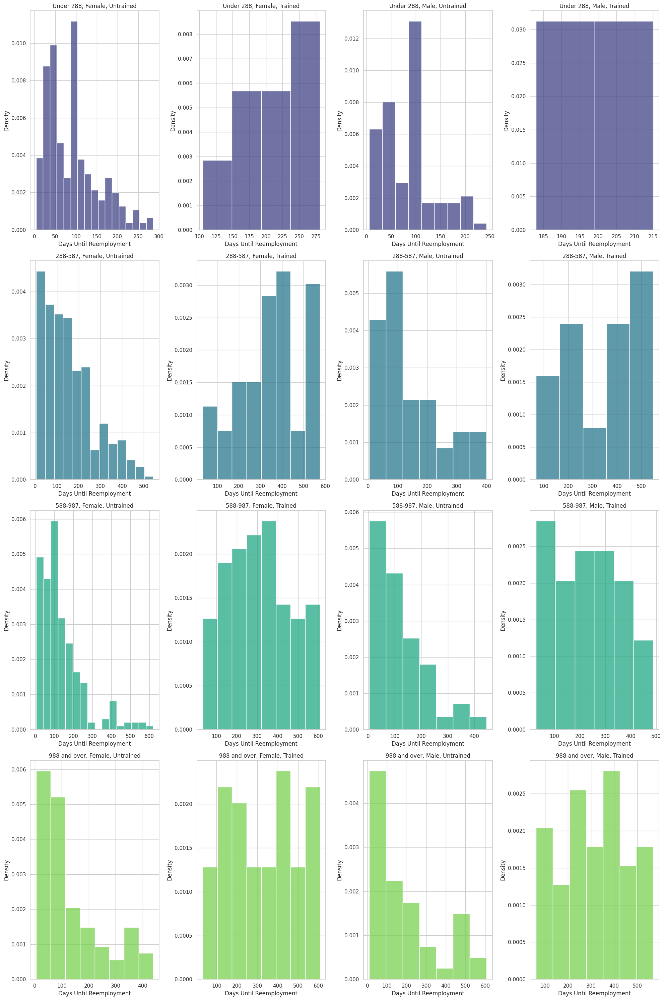

In [ ]:

# RUN ON UI BUCKETS BY MALE/FEMALE AND TRAIN/NO TRAIN

# Defining UI buckets for analysis
bins = [0, 288, 588, 988, 5000]
labels = ['Under 288', '288-587', '588-987', '988 and over']
data['UI_group'] = pd.cut(data['total duration of UI benefits'], bins=bins, labels=labels, right=False)

# Adjusting the layout to have 5 rows of 4 histograms, each row representing an age group with four sub-categories

# Setting up the figure for multiple histograms
fig, axes = plt.subplots(4, 4, figsize=(20, 30))  # Adjust the subplot dimensions as necessary

# Loop through each combination of UI group, gender, and training for plotting
for i, ui_duration_label in enumerate(labels):
    for j, gender in enumerate([0, 1]):  # 0 for female, 1 for male
        for k, train in enumerate([0, 1]):  # 0 for no train, 1 for train
            ax = axes[i, j * 2 + k]
            subset = data[(data['Male'] == gender) & (data['training'] == train) & (data['UI_group'] == ui_duration_label)]
            title = f"{ui_duration_label}, {'Male' if gender == 1 else 'Female'}, {'Trained' if train == 1 else 'Untrained'}"
            sns.histplot(subset, x='time until reemployment', hue='UI_group', multiple='stack', stat='density', common_norm=False, palette='viridis', ax=ax)
            ax.set_title(title)
            ax.set_xlabel('Days Until Reemployment')
            ax.set_ylabel('Density')
            ax.legend_.remove()

plt.tight_layout()
plt.show()


In [ ]:
#TEST HYPOTHESIS
#null hypothesis: There is no significant association between age group and training participation for females.

import pandas as pd
import scipy.stats as stats
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


# Defining age buckets for analysis
bins = [0, 25, 35, 45, 55, 100]  # Assuming max age is less than 100
labels = ['Under 25', '25-35', '35-45', '45-55', '55 and over']
data['age_group'] = pd.cut(data['Age'], bins=bins, labels=labels, right=False)

# Defining UI buckets for analysis
bins = [0, 288, 588, 988, 5000]
labels = ['Under 288', '288-587', '588-987', '988 and over']
data['UI_group'] = pd.cut(data['total duration of UI benefits'], bins=bins, labels=labels, right=False)

# Create new field 'untrained_female'
data['untrained_female'] = ((data['Male'] == 0)).astype(int)

# Filter data for females
filtered_data = data[data['untrained_female'] == 1]


# Define the order of UI groups
ui_order = {
    'Under 288': 0,
    '288-587': 1,
    '588-987': 2,
    '988 and over': 3
}

# Convert 'UI_group' to ordered categorical
filtered_data['UI_group'] = pd.Categorical(filtered_data['UI_group'], categories=ui_order.keys(), ordered=True)

# Sort data by the new ordered 'UI_group'
filtered_data.sort_values('UI_group', inplace=True)

# 1. Chi-Squared Test for Categorical Data (Training by Age Group)
contingency_table = pd.crosstab(filtered_data['age_group'], filtered_data['training'])
chi2, p, _, _ = stats.chi2_contingency(contingency_table)

print("\nChi-squared Test Results (Training by Age Group for Females):")
print(f"Chi-squared statistic: {chi2:.3f}")
print(f"P-value: {p:.3f}")

alpha = 0.05
if p < alpha:
    print("Reject the null hypothesis: There is a significant association between age group and training participation for females.")
else:
    print("Fail to reject the null hypothesis: There is no significant association between age group and training participation for females.")

# 2. ANOVA for Continuous Data (Time Until Reemployment by Age Group)
model = ols('Q("time until reemployment") ~ C(age_group)', data=filtered_data).fit() # use Q() to quote the column name
anova_table = anova_lm(model, typ=2)

print("\nANOVA Test Results (Time Until Reemployment by Age Group for Females):")
print(anova_table)

alpha = 0.05
if anova_table['PR(>F)'][0] < alpha:
    print("Reject the null hypothesis: There is a significant difference in reemployment time among age groups for females.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in reemployment time among age groups for females.")


Chi-squared Test Results (Training by Age Group for Females):
Chi-squared statistic: 182.197
P-value: 0.000
Reject the null hypothesis: There is a significant association between age group and training participation for females.

ANOVA Test Results (Time Until Reemployment by Age Group for Females):
                    sum_sq      df          F        PR(>F)
C(age_group)  1.390712e+06     4.0  22.499328  3.643638e-18
Residual      2.851044e+07  1845.0        NaN           NaN
Reject the null hypothesis: There is a significant difference in reemployment time among age groups for females.


<ipython-input-13-d9d2cd42e158>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['UI_group'] = pd.Categorical(filtered_data['UI_group'], categories=ui_order.keys(), ordered=True)
<ipython-input-13-d9d2cd42e158>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.sort_values('UI_group', inplace=True)


In [ ]:
#TEST HYPOTHESIS
#null hypothesis: There is no significant association between age group and training participation for females.
#and
#null hypothesis: There is no significant difference in reemployment time between males and females.
#and
#null hypothesis: There is no significant difference in reemployment time between trained and untrained females.

import pandas as pd
import scipy.stats as stats
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Rename columns to remove spaces
data.rename(columns={
    'time until reemployment': 'time_until_reemployment',
    'total duration of UI benefits': 'total_duration_ui_benefits'
}, inplace=True)

# Defining age buckets for analysis - Move this up before filtering data
bins = [0, 25, 35, 45, 55, 100]  # Assuming max age is less than 100
labels = ['Under 25', '25-35', '35-45', '45-55', '55 and over']
data['age_group'] = pd.cut(data['Age'], bins=bins, labels=labels, right=False)

# Create 'Gender' column based on 'Male'
data['Gender'] = data['Male'].apply(lambda x: 'Male' if x == 1 else 'Female')


# 2. ANOVA for Continuous Data (Time Until Reemployment by Age Group)
model = ols('time_until_reemployment ~ age_group', data=data).fit()
anova_table = anova_lm(model, typ=2)

print("\nANOVA Test Results (Time Until Reemployment by Age Group for Females):")
print(anova_table)

alpha = 0.05
if anova_table['PR(>F)'][0] < alpha:
    print("Reject the null hypothesis: There is a significant difference in reemployment time among age groups for females.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in reemployment time among age groups for females.")

# Filter data for females
filtered_data = data[data['Gender'] == 'Female']

# Defining UI buckets for analysis
bins = [0, 288, 588, 988, 5000]
labels = ['Under 288', '288-587', '588-987', '988 and over']
filtered_data['UI_group'] = pd.cut(filtered_data['total_duration_ui_benefits'], bins=bins, labels=labels, right=False)

# Define the order of UI groups
ui_order = {
    'Under 288': 0,
    '288-587': 1,
    '588-987': 2,
    '988 and over': 3
}

# Convert 'UI_group' to ordered categorical
filtered_data['UI_group'] = pd.Categorical(filtered_data['UI_group'], categories=ui_order.keys(), ordered=True)

# Sort data by the new ordered 'UI_group'
filtered_data.sort_values('UI_group', inplace=True)

# Independent t-test for time until reemployment by gender
male_time = data[data['Gender'] == 'Male']['time_until_reemployment']
female_time = data[data['Gender'] == 'Female']['time_until_reemployment']

t_statistic, p_value = stats.ttest_ind(male_time, female_time, nan_policy='omit')

print("\nIndependent t-Test Results (Time Until Reemployment by Gender):")
print(f"T-statistic: {t_statistic:.3f}")
print(f"P-value: {p_value:.3f}")

# Interpret results
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in reemployment time between males and females.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in reemployment time between males and females.")

# Independent t-test for time until reemployment by training status
train_time = filtered_data[filtered_data['training'] == 1]['time_until_reemployment']
untrain_time = filtered_data[filtered_data['training'] == 0]['time_until_reemployment']

t_statistic, p_value = stats.ttest_ind(train_time, untrain_time, nan_policy='omit')

print("\nIndependent t-Test Results (Time Until Reemployment by Training Status for Females):")
print(f"T-statistic: {t_statistic:.3f}")
print(f"P-value: {p_value:.3f}")

# Interpret results with direction
alpha = 0.05
if p_value < alpha:
    if t_statistic > 0:  # Train group took longer
        print("Reject the null hypothesis: Females who participated in training had a significantly longer time until reemployment.")
    else:  # Train group took shorter
        print("Reject the null hypothesis: Females who participated in training had a significantly shorter time until reemployment.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in reemployment time between trained and untrained females.")



ANOVA Test Results (Time Until Reemployment by Age Group for Females):
                 sum_sq      df          F        PR(>F)
age_group  2.218024e+06     4.0  34.406519  6.961751e-28
Residual   3.494015e+07  2168.0        NaN           NaN
Reject the null hypothesis: There is a significant difference in reemployment time among age groups for females.

Independent t-Test Results (Time Until Reemployment by Gender):
T-statistic: 4.182
P-value: 0.000
Reject the null hypothesis: There is a significant difference in reemployment time between males and females.

Independent t-Test Results (Time Until Reemployment by Training Status for Females):
T-statistic: 30.001
P-value: 0.000
Reject the null hypothesis: Females who participated in training had a significantly longer time until reemployment.


<ipython-input-20-6257c7f1a587>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['UI_group'] = pd.cut(filtered_data['total_duration_ui_benefits'], bins=bins, labels=labels, right=False)
<ipython-input-20-6257c7f1a587>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['UI_group'] = pd.Categorical(filtered_data['UI_group'], categories=ui_order.keys(), ordered=True)
<ipython-input-20-6257c7f1a587>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [ ]:
#TEST HYPOTHESIS
#null hypothesis: There is no significant association between age group and training participation for females.
#and
#null hypothesis: There is no significant difference in reemployment time between males and females.
#and
#null hypothesis: There is no significant difference in reemployment time between trained and untrained males.

import pandas as pd
import scipy.stats as stats
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Rename columns to remove spaces
data.rename(columns={
    'time until reemployment': 'time_until_reemployment',
    'total duration of UI benefits': 'total_duration_ui_benefits'
}, inplace=True)

# Defining age buckets for analysis
bins = [0, 25, 35, 45, 55, 100]  # Assuming max age is less than 100
labels = ['Under 25', '25-35', '35-45', '45-55', '55 and over']
data['age_group'] = pd.cut(data['Age'], bins=bins, labels=labels, right=False)

# Create 'Gender' column based on 'Male'
data['Gender'] = data['Male'].apply(lambda x: 'Male' if x == 1 else 'Female')


# 2. ANOVA for Continuous Data (Time Until Reemployment by Age Group)
model = ols('time_until_reemployment ~ age_group', data=data).fit()
anova_table = anova_lm(model, typ=2)

print("\nANOVA Test Results (Time Until Reemployment by Age Group):")
print(anova_table)

alpha = 0.05
if anova_table['PR(>F)'][0] < alpha:
    print("Reject the null hypothesis: There is a significant difference in reemployment time among age groups.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in reemployment time among age groups.")


# Filter data for females and males
filtered_data_females = data[data['Gender'] == 'Female']
filtered_data_males = data[data['Gender'] == 'Male']

# Defining UI buckets for analysis
bins = [0, 288, 588, 988, 5000]
labels = ['Under 288', '288-587', '588-987', '988 and over']
filtered_data_females['UI_group'] = pd.cut(filtered_data_females['total_duration_ui_benefits'], bins=bins, labels=labels, right=False)

# Define the order of UI groups
ui_order = {
    'Under 288': 0,
    '288-587': 1,
    '588-987': 2,
    '988 and over': 3
}

# Convert 'UI_group' to ordered categorical
filtered_data_females['UI_group'] = pd.Categorical(filtered_data_females['UI_group'], categories=ui_order.keys(), ordered=True)

# Sort data by the new ordered 'UI_group'
filtered_data_females.sort_values('UI_group', inplace=True)

# Independent t-test for time until reemployment by training status FOR FEMALES
train_time_females = filtered_data_females[filtered_data_females['training'] == 1]['time_until_reemployment']
untrain_time_females = filtered_data_females[filtered_data_females['training'] == 0]['time_until_reemployment']

t_statistic_females, p_value_females = stats.ttest_ind(train_time_females, untrain_time_females, nan_policy='omit')

print("\nIndependent t-Test Results (Time Until Reemployment by Training Status for Females):")
print(f"T-statistic (Females): {t_statistic_females:.3f}")
print(f"P-value (Females): {p_value_females:.3f}")

# Interpret results with direction for females
if p_value_females < alpha:
    if t_statistic_females > 0:  # Train group took longer
        print("Reject the null hypothesis: Females who participated in training had a significantly longer time until reemployment.")
    else:  # Train group took shorter
        print("Reject the null hypothesis: Females who participated in training had a significantly shorter time until reemployment.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in reemployment time between trained and untrained females.")


# Independent t-test for time until reemployment by training status FOR MALES
train_time_males = filtered_data_males[filtered_data_males['training'] == 1]['time_until_reemployment']
untrain_time_males = filtered_data_males[filtered_data_males['training'] == 0]['time_until_reemployment']

t_statistic_males, p_value_males = stats.ttest_ind(train_time_males, untrain_time_males, nan_policy='omit')

print("\nIndependent t-Test Results (Time Until Reemployment by Training Status for Males):")
print(f"T-statistic (Males): {t_statistic_males:.3f}")
print(f"P-value (Males): {p_value_males:.3f}")

# Interpret results with direction for males
if p_value_males < alpha:
    if t_statistic_males > 0:  # Train group took longer
        print("Reject the null hypothesis: Males who participated in training had a significantly longer time until reemployment.")
    else:  # Train group took shorter
        print("Reject the null hypothesis: Males who participated in training had a significantly shorter time until reemployment.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in reemployment time between trained and untrained males.")







ANOVA Test Results (Time Until Reemployment by Age Group):
                 sum_sq      df          F        PR(>F)
age_group  2.218024e+06     4.0  34.406519  6.961751e-28
Residual   3.494015e+07  2168.0        NaN           NaN
Reject the null hypothesis: There is a significant difference in reemployment time among age groups.

Independent t-Test Results (Time Until Reemployment by Training Status for Females):
T-statistic (Females): 30.001
P-value (Females): 0.000
Reject the null hypothesis: Females who participated in training had a significantly longer time until reemployment.

Independent t-Test Results (Time Until Reemployment by Training Status for Males):
T-statistic (Males): 11.142
P-value (Males): 0.000
Reject the null hypothesis: Males who participated in training had a significantly longer time until reemployment.


<ipython-input-21-3c1bd361f8ce>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data_females['UI_group'] = pd.cut(filtered_data_females['total_duration_ui_benefits'], bins=bins, labels=labels, right=False)
<ipython-input-21-3c1bd361f8ce>:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data_females['UI_group'] = pd.Categorical(filtered_data_females['UI_group'], categories=ui_order.keys(), ordered=True)
<ipython-input-21-3c1bd361f8ce>:60: SettingWithCopyWarning: 
A value is trying to be 

In [ ]:
#SIMPLE LINEAR REGRESSION

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# List of independent variables to analyze
independent_vars = ['Age', 'Daily wage (euro)', 'Male', 'older than 50', 'low skill', 'training', 'total duration of UI benefits']

# Dependent variable
dependent_var = 'time until reemployment'

# Running regressions for each independent variable
for var in independent_vars:
    X = data[[var]]  # Selecting the independent variable
    X = sm.add_constant(X)  # Adding a constant term for the intercept
    y = data[dependent_var]  # Dependent variable

    model = sm.OLS(y, X).fit()  # Fitting the model
    print(f"Regression results for {var}:\n{model.summary()}\n\n")


Regression results for Age:
                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.062
Model:                                 OLS   Adj. R-squared:                  0.062
Method:                      Least Squares   F-statistic:                     144.0
Date:                     Sat, 11 May 2024   Prob (F-statistic):           3.68e-32
Time:                             05:06:41   Log-Likelihood:                -13604.
No. Observations:                     2173   AIC:                         2.721e+04
Df Residuals:                         2171   BIC:                         2.722e+04
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

In [ ]:
#SIMPLE LINEAR REGRESSION
#WITH SUMMARY TABLE

import pandas as pd
import statsmodels.api as sm
import numpy as np

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Rename columns to remove spaces (for easier use in formulas)
data.rename(columns={
    'time until reemployment': 'time_until_reemployment',
    'total duration of UI benefits': 'total_duration_ui_benefits',
    'Daily wage (euro)': 'daily_wage_euro'
}, inplace=True)

# List of independent variables to analyze
independent_vars = ['Age', 'daily_wage_euro', 'Male', 'older than 50', 'low skill', 'training', 'total_duration_ui_benefits']

# Dependent variable
dependent_var = 'time_until_reemployment'

# Create an empty dataframe to store results
results_df = pd.DataFrame(columns=[
    'Variable', 'R-squared', 'F-statistic', 'Coef', 'Std Err', 't', 'P>|t|', '95% CI'
])

# Running regressions for each independent variable
for var in independent_vars:
    X = data[[var]]
    X = sm.add_constant(X)
    y = data[dependent_var]

    model = sm.OLS(y, X).fit()
    print(f"\nRegression results for {var}:\n{model.summary()}\n\n")

    # Extract results from the model summary
    summary = model.summary2().tables[1]
    ci_lower = summary.loc[var, '[0.025']
    ci_upper = summary.loc[var, '0.975]']
    ci_str = f"({ci_lower:.3f}, {ci_upper:.3f})"  # Format confidence interval

    results_df.loc[len(results_df)] = [
        var,
        f"{model.rsquared:.3f}",  # Format R-squared
        f"{model.fvalue:.3f}",   # Format F-statistic
        f"{summary.loc[var, 'Coef.']:.3f}",  # Format Coef
        f"{summary.loc[var, 'Std.Err.']:.3f}", # Format Std Err
        f"{summary.loc[var, 't']:.3f}", # Format t
        f"{summary.loc[var, 'P>|t|']:.3f}", # Format pval
        ci_str  # Formatted confidence interval
    ]

# Display the nicely formatted results table
print("\nSummary Table of Regression Results:")
print(results_df.to_markdown(index=False, numalign='left', stralign='left'))  # Using to_markdown for better formatting



Regression results for Age:
                               OLS Regression Results                              
Dep. Variable:     time_until_reemployment   R-squared:                       0.062
Model:                                 OLS   Adj. R-squared:                  0.062
Method:                      Least Squares   F-statistic:                     144.0
Date:                     Sat, 11 May 2024   Prob (F-statistic):           3.68e-32
Time:                             09:36:00   Log-Likelihood:                -13604.
No. Observations:                     2173   AIC:                         2.721e+04
Df Residuals:                         2171   BIC:                         2.722e+04
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------

In [ ]:
#Initial Multiple Regression on all variables.

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Define independent variables including categorical ones
X = data[['Age', 'Male', 'older than 50', 'Daily wage (euro)', 'training', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.342
Model:                                 OLS   Adj. R-squared:                  0.339
Method:                      Least Squares   F-statistic:                     160.5
Date:                     Sat, 11 May 2024   Prob (F-statistic):          2.54e-191
Time:                             09:36:29   Log-Likelihood:                -13219.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2165   BIC:                         2.650e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Multiple Regression Excluding Training

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Define independent variables including categorical ones
X = data[['Age', 'Daily wage (euro)', 'Male', 'low skill', 'total duration of UI benefits', 'older than 50']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.158
Model:                                 OLS   Adj. R-squared:                  0.156
Method:                      Least Squares   F-statistic:                     67.96
Date:                     Sat, 11 May 2024   Prob (F-statistic):           1.12e-77
Time:                             06:50:06   Log-Likelihood:                -13486.
No. Observations:                     2173   AIC:                         2.699e+04
Df Residuals:                         2166   BIC:                         2.703e+04
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Multiple Regression Excluding Wage

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Define independent variables including categorical ones
X = data[['Age', 'Male', 'older than 50', 'training', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.342
Model:                                 OLS   Adj. R-squared:                  0.339
Method:                      Least Squares   F-statistic:                     160.5
Date:                     Sat, 11 May 2024   Prob (F-statistic):          2.54e-191
Time:                             06:46:14   Log-Likelihood:                -13219.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2165   BIC:                         2.650e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Multiple Regression Just Women

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only Females
gender_data = data[data['Male'] == 0]

# Define independent variables including categorical ones
X = data[['Age', 'older than 50', 'Daily wage (euro)', 'training', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.341
Model:                                 OLS   Adj. R-squared:                  0.339
Method:                      Least Squares   F-statistic:                     186.8
Date:                     Sat, 11 May 2024   Prob (F-statistic):          4.93e-192
Time:                             06:51:10   Log-Likelihood:                -13220.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2166   BIC:                         2.649e+04
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Multiple Regression Just Men

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only Females
gender_data = data[data['Male'] == 1]

# Define independent variables including categorical ones
X = data[['Age', 'older than 50', 'Daily wage (euro)', 'training', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.341
Model:                                 OLS   Adj. R-squared:                  0.339
Method:                      Least Squares   F-statistic:                     186.8
Date:                     Sat, 11 May 2024   Prob (F-statistic):          4.93e-192
Time:                             06:51:40   Log-Likelihood:                -13220.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2166   BIC:                         2.649e+04
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Multiple Regression Just Women, exluding low skill and people under 25

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only Females over 25 and those with low skill = 1
filtered_data = data[(data['Male'] == 0) & (data['Age'] >= 25) & (data['low skill'] == 1)]

# Define independent variables including categorical ones (Age already excluded from filtering)
X = filtered_data[['Age', 'older than 50', 'Daily wage (euro)', 'training', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)

# Define the dependent variable
y = filtered_data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())




                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.428
Model:                                 OLS   Adj. R-squared:                  0.407
Method:                      Least Squares   F-statistic:                     19.94
Date:                     Sat, 11 May 2024   Prob (F-statistic):           8.45e-15
Time:                             06:53:45   Log-Likelihood:                -877.08
No. Observations:                      139   AIC:                             1766.
Df Residuals:                          133   BIC:                             1784.
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Multiple Regression Just Women, exluding low skill and people under 25 Excluding training

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only Females over 25 and those with low skill = 1
filtered_data = data[(data['Male'] == 0) & (data['Age'] >= 25) & (data['low skill'] == 1)]

# Define independent variables including categorical ones (Age already excluded from filtering)
X = filtered_data[['Age', 'older than 50', 'Daily wage (euro)', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)

# Define the dependent variable
y = filtered_data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.105
Model:                                 OLS   Adj. R-squared:                  0.078
Method:                      Least Squares   F-statistic:                     3.928
Date:                     Sat, 11 May 2024   Prob (F-statistic):            0.00477
Time:                             06:54:32   Log-Likelihood:                -908.25
No. Observations:                      139   AIC:                             1827.
Df Residuals:                          134   BIC:                             1841.
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Multiple Regression Just Men, exluding low skill and people under 25 Excluding training

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only Females over 25 and those with low skill = 1
filtered_data = data[(data['Male'] == 1) & (data['Age'] >= 25) & (data['low skill'] == 1)]

# Define independent variables including categorical ones (Age already excluded from filtering)
X = filtered_data[['Age', 'older than 50', 'training', 'Daily wage (euro)', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)

# Define the dependent variable
y = filtered_data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.421
Model:                                 OLS   Adj. R-squared:                  0.289
Method:                      Least Squares   F-statistic:                     3.199
Date:                     Sat, 11 May 2024   Prob (F-statistic):             0.0255
Time:                             06:56:36   Log-Likelihood:                -176.49
No. Observations:                       28   AIC:                             365.0
Df Residuals:                           22   BIC:                             373.0
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Initial Multiple Regression on all variables. Segmented on just trained and over 25 and regular skill

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only trained
filtered_data = data[(data['training'] == 1) & (data['Age'] >= 25) & (data['low skill'] == 1)]

# Define independent variables including categorical ones
X = filtered_data[['Age', 'Male', 'older than 50', 'Daily wage (euro)', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = filtered_data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.035
Model:                                 OLS   Adj. R-squared:                 -0.012
Method:                      Least Squares   F-statistic:                    0.7440
Date:                     Sat, 11 May 2024   Prob (F-statistic):              0.592
Time:                             07:06:03   Log-Likelihood:                -704.03
No. Observations:                      110   AIC:                             1420.
Df Residuals:                          104   BIC:                             1436.
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Initial Multiple Regression on all variables. Segmented on just not trained and over 25 and regular skill

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only trained
filtered_data = data[(data['training'] == 0) & (data['Age'] >= 25) & (data['low skill'] == 1)]

# Define independent variables including categorical ones
X = filtered_data[['Age', 'Male', 'older than 50', 'Daily wage (euro)', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = filtered_data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.208
Model:                                 OLS   Adj. R-squared:                  0.130
Method:                      Least Squares   F-statistic:                     2.671
Date:                     Sat, 11 May 2024   Prob (F-statistic):             0.0321
Time:                             07:05:50   Log-Likelihood:                -340.07
No. Observations:                       57   AIC:                             692.1
Df Residuals:                           51   BIC:                             704.4
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Initial Multiple Regression on all variables. Over 25 and regular skill

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only trained
filtered_data = data[ (data['Age'] >= 25) & (data['low skill'] == 1)]

# Define independent variables including categorical ones
X = filtered_data[['Age', 'Male', 'training', 'older than 50', 'Daily wage (euro)', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = filtered_data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.424
Model:                                 OLS   Adj. R-squared:                  0.403
Method:                      Least Squares   F-statistic:                     19.65
Date:                     Sat, 11 May 2024   Prob (F-statistic):           4.10e-17
Time:                             07:07:16   Log-Likelihood:                -1054.0
No. Observations:                      167   AIC:                             2122.
Df Residuals:                          160   BIC:                             2144.
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Initial Multiple Regression on all variables. under 25 or low skill

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Filter to include only trained
filtered_data = data[(data['Age'] >= 25) | (data['low skill'] == 0)]

# Define independent variables including categorical ones
X = filtered_data[['Age', 'Male', 'training', 'older than 50', 'Daily wage (euro)', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = filtered_data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.342
Model:                                 OLS   Adj. R-squared:                  0.339
Method:                      Least Squares   F-statistic:                     160.5
Date:                     Sat, 11 May 2024   Prob (F-statistic):          2.54e-191
Time:                             07:09:00   Log-Likelihood:                -13219.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2165   BIC:                         2.650e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Initial Multiple Regression on all variables new variable of young women and low skill women created.

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Create the new field
data['Young_Women_and_Low_Skilled_Women'] = (
    (data['Male'] == 0) &
    ((data['low skill'] == 0) | (data['Age'] < 25))
).astype(int)  # Convert boolean to 0/1

# Define independent variables including the new field (Exclude columns already in the new field)
X = data[['Young_Women_and_Low_Skilled_Women', 'Age', 'Male', 'older than 50', 'Daily wage (euro)', 'training', 'low skill', 'total duration of UI benefits']]
X = sm.add_constant(X)

# Define the dependent variable
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.342
Model:                                 OLS   Adj. R-squared:                  0.339
Method:                      Least Squares   F-statistic:                     140.4
Date:                     Sat, 11 May 2024   Prob (F-statistic):          2.89e-190
Time:                             07:01:39   Log-Likelihood:                -13219.
No. Observations:                     2173   AIC:                         2.646e+04
Df Residuals:                         2164   BIC:                         2.651e+04
Df Model:                                8                                         
Covariance Type:                 nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Convert Age into a categorical variable with buckets
data['Age_cat'] = pd.cut(data['Age'], bins=[0, 25, float('inf')], labels=['25 and under', 'over 25'], right=False)

# Create dummy variables for the categorical Age
age_cat_dummies = pd.get_dummies(data['Age_cat'], drop_first=True, prefix='Age')  # This will create one column: Age_over 25

# Convert boolean dummies to integer if needed
age_cat_dummies = age_cat_dummies.astype(int)

# Combine dummies back with the original dataframe
data = pd.concat([data, age_cat_dummies], axis=1)

# Define independent variables including categorical ones
X = data[['Age', 'Age_over 25', 'Male', 'older than 50', 'Daily wage (euro)', 'training', 'low skill', 'total duration of UI benefits']]
X = sm.add_constant(X)  # Adding a constant column for the intercept

# Explicitly convert all columns in X to numeric, and handle any errors
for col in X.columns:
    X[col] = pd.to_numeric(X[col], errors='coerce')
    if X[col].isnull().any():
        print(f"Warning: Column '{col}' contains NaN after conversion to numeric.")

# Drop rows with any missing values
X.dropna(inplace=True)
y = data['time until reemployment'].loc[X.index]  # Ensure y aligns with rows in X

# Check if y needs any conversion or cleaning
y = pd.to_numeric(y, errors='coerce')
y.dropna(inplace=True)  # Ensuring no missing values in y

# Ensure X and y have the same length after dropping missing values
X = X.loc[y.index]

# Print the top 10 rows of the DataFrame (including the index)
print(data.head(50).to_markdown(numalign='left', stralign='left'))

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())




|    | time until reemployment   | Age     | Daily wage (euro)   | Male   | older than 50   | low skill   | training   | total duration of UI benefits   | Age_cat      | Age_over 25   |
|:---|:--------------------------|:--------|:--------------------|:-------|:----------------|:------------|:-----------|:--------------------------------|:-------------|:--------------|
| 0  | 214                       | 48.4887 | 13.965              | 0      | 0               | 0           | 0          | 822                             | over 25      | 1             |
| 1  | 55                        | 53.2855 | 12.3863             | 0      | 1               | 0           | 0          | 91                              | over 25      | 1             |
| 2  | 183                       | 50.9336 | 7.99375             | 0      | 1               | 0           | 0          | 183                             | over 25      | 1             |
| 3  | 200                       | 48.4421 | 12.8413             | 0  

In [ ]:
# Multiple Regression with new variables

import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Convert Age into a categorical variable with buckets
data['Age_cat'] = pd.cut(data['Age'], bins=[0, 30, 50, float('inf')], labels=['under 30', '31 to 50', 'over 50'], right=False)
age_cat_dummies = pd.get_dummies(data['Age_cat'], drop_first=False).astype(int)

# Convert Daily wage into categories
data['Wage_cat'] = pd.cut(data['Daily wage (euro)'], bins=[-np.inf, 50, 100, np.inf], labels=['low wage', 'medium wage', 'high wage'], right=False)
wage_cat_dummies = pd.get_dummies(data['Wage_cat'], drop_first=False).astype(int)

# Convert time until reemployment into categories
data['Reemployment_time_cat'] = pd.cut(data['time until reemployment'], bins=[0, 90, 180, np.inf], labels=['short time', 'medium time', 'long time'], right=False)
reemployment_time_cat_dummies = pd.get_dummies(data['Reemployment_time_cat'], drop_first=False).astype(int)

# Convert total duration of UI benefits into categories
data['UI_duration_cat'] = pd.cut(data['total duration of UI benefits'], bins=[0, 500, 1000, np.inf], labels=['0-500', '500-1000', '1000 and over'], right=False)
ui_duration_cat_dummies = pd.get_dummies(data['UI_duration_cat'], drop_first=False).astype(int)

# Combine all dummies back with the original dataframe
data = pd.concat([data, age_cat_dummies, wage_cat_dummies, reemployment_time_cat_dummies, ui_duration_cat_dummies], axis=1)

# Define independent variables including categorical ones and interactions with the 'Male' field
data['Male_inter_age_under_30'] = data['Male'] * data['under 30']
data['Male_inter_age_31_to_50'] = data['Male'] * data['31 to 50']
data['Male_inter_age_over_50'] = data['Male'] * data['over 50']

# Define full list of predictors
X = data[['Age', 'training', 'under 30', '31 to 50', 'over 50', 'low skill', 'low wage', 'medium wage', 'high wage', '0-500', '500-1000', '1000 and over', 'Male', 'Male_inter_age_under_30', 'Male_inter_age_31_to_50', 'Male_inter_age_over_50']]
X = sm.add_constant(X)  # Adding a constant column for the intercept

# Convert all columns in X to numeric and handle any errors
for col in X.columns:
    X[col] = pd.to_numeric(X[col], errors='coerce')

# Drop rows with any missing values
X.dropna(inplace=True)
y = data['time until reemployment'].loc[X.index]  # Ensure y aligns with rows in X

# Convert y to numeric, ensuring no missing values
y = pd.to_numeric(y, errors='coerce')
y.dropna(inplace=True)

# Ensure X and y have the same length after dropping missing values
X = X.loc[y.index]

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.343
Model:                                 OLS   Adj. R-squared:                  0.340
Method:                      Least Squares   F-statistic:                     112.9
Date:                     Sat, 11 May 2024   Prob (F-statistic):          4.78e-189
Time:                             08:25:06   Log-Likelihood:                -13217.
No. Observations:                     2173   AIC:                         2.646e+04
Df Residuals:                         2162   BIC:                         2.652e+04
Df Model:                               10                                         
Covariance Type:                 nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

In [ ]:
# Multiple Regression with new variables Cross validation

from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import make_scorer, r2_score
from sklearn.model_selection import KFold

# Define the model
model = LinearRegression()

# Define the cross-validation method
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
scores = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(r2_score))

print("Cross-validated R^2 scores:", scores)
print("Mean R^2:", np.mean(scores))

Cross-validated R^2 scores: [0.49684745 0.41628805 0.50622194 0.44919701 0.45774512]
Mean R^2: 0.4652599115266235


In [ ]:
# Multiple Regression with new variables but removing statistically insignificant variables

import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Convert Age into a categorical variable with buckets
data['Age_cat'] = pd.cut(data['Age'], bins=[0, 30, 50, float('inf')], labels=['under 30', '31 to 50', 'over 50'], right=False)
age_cat_dummies = pd.get_dummies(data['Age_cat'], drop_first=False).astype(int)

# Convert Daily wage into categories
data['Wage_cat'] = pd.cut(data['Daily wage (euro)'], bins=[-np.inf, 50, 100, np.inf], labels=['low wage', 'medium wage', 'high wage'], right=False)
wage_cat_dummies = pd.get_dummies(data['Wage_cat'], drop_first=False).astype(int)

# Convert time until reemployment into categories
data['Reemployment_time_cat'] = pd.cut(data['time until reemployment'], bins=[0, 90, 180, np.inf], labels=['short time', 'medium time', 'long time'], right=False)
reemployment_time_cat_dummies = pd.get_dummies(data['Reemployment_time_cat'], drop_first=False).astype(int)

# Convert total duration of UI benefits into categories
data['UI_duration_cat'] = pd.cut(data['total duration of UI benefits'], bins=[0, 500, 1000, np.inf], labels=['0-500', '500-1000', '1000 and over'], right=False)
ui_duration_cat_dummies = pd.get_dummies(data['UI_duration_cat'], drop_first=False).astype(int)

# Combine all dummies back with the original dataframe
data = pd.concat([data, age_cat_dummies, wage_cat_dummies, reemployment_time_cat_dummies, ui_duration_cat_dummies], axis=1)

# Define independent variables including categorical ones and interactions with the 'Male' field
data['Male_inter_age_under_30'] = data['Male'] * data['under 30']
data['Male_inter_age_31_to_50'] = data['Male'] * data['31 to 50']
data['Male_inter_age_over_50'] = data['Male'] * data['over 50']

# Define full list of predictors
X = data[['Age', 'training', 'under 30', '31 to 50', 'over 50', 'low wage',  '500-1000', '1000 and over', ]]
X = sm.add_constant(X)  # Adding a constant column for the intercept

# Convert all columns in X to numeric and handle any errors
for col in X.columns:
    X[col] = pd.to_numeric(X[col], errors='coerce')

# Drop rows with any missing values
X.dropna(inplace=True)
y = data['time until reemployment'].loc[X.index]  # Ensure y aligns with rows in X

# Convert y to numeric, ensuring no missing values
y = pd.to_numeric(y, errors='coerce')
y.dropna(inplace=True)

# Ensure X and y have the same length after dropping missing values
X = X.loc[y.index]

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.342
Model:                                 OLS   Adj. R-squared:                  0.340
Method:                      Least Squares   F-statistic:                     187.6
Date:                     Sat, 11 May 2024   Prob (F-statistic):          9.45e-193
Time:                             16:38:36   Log-Likelihood:                -13219.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2166   BIC:                         2.649e+04
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [ ]:
#Cross Validation

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming X is your predictors DataFrame from the previous setup
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data.sort_values(by="VIF", ascending=False))

# Multiple Regression with new variables Cross validation

from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import make_scorer, r2_score
from sklearn.model_selection import KFold

# Define the model
model = LinearRegression()

# Define the cross-validation method
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
scores = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(r2_score))

print("Cross-validated R^2 scores:", scores)
print("Mean R^2:", np.mean(scores))


         feature       VIF
2       under 30       inf
3       31 to 50       inf
4        over 50       inf
0            Age  7.717130
7  1000 and over  2.709125
6       500-1000  1.960031
1       training  1.266249
5       low wage  0.000000
Cross-validated R^2 scores: [0.32925617 0.26128713 0.38507789 0.34399973 0.36236053]
Mean R^2: 0.3363962917629113


/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [ ]:
# Assuming 'data' is your DataFrame with all variables
# Drop one dummy from each categorical set
X = data[['Age', 'training', 'under 30', '31 to 50',  # Dropping 'over 50'
          'low wage',  # Dropping 'medium wage' and 'high wage'
                   '0-500', '500-1000',  # Dropping '1000 and over'
          'Male']]

X = sm.add_constant(X)  # Add a constant column for the intercept

# Recalculate VIFs
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
print(vif_data)

# Fit the model again
model = sm.OLS(y, X).fit()
print(model.summary())


    feature         VIF
0       Age    7.780892
1  training    1.274148
2  under 30   15.316302
3  31 to 50    6.997353
4  low wage  218.770928
5     0-500    5.886228
6  500-1000    4.296151
7      Male    1.082920
                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.342
Model:                                 OLS   Adj. R-squared:                  0.340
Method:                      Least Squares   F-statistic:                     161.0
Date:                     Sat, 11 May 2024   Prob (F-statistic):          7.28e-192
Time:                             16:40:09   Log-Likelihood:                -13218.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2165   BIC:                         2.650e+04
Df Model:                                7                                         
Covariance Type:            

In [ ]:
#Shrink less important predictors using Lasso

from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# LassoCV for optimal alpha
lasso = LassoCV(cv=5, random_state=0).fit(X_scaled, y)

# Check the coefficients
lasso_coef = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': lasso.coef_
})

print(lasso_coef)

# Checking how many coefficients have been reduced to zero
print("Number of features used:", np.sum(lasso.coef_ != 0))


       Feature  Coefficient
0          Age   -15.980197
1     training    26.356344
2     under 30    -6.800045
3     31 to 50    -0.000000
4     low wage     0.000000
5   short time  -112.420509
6  medium time   -70.367051
7        0-500   -22.938049
8     500-1000    -9.616128
9         Male    -2.561639
Number of features used: 8


In [ ]:
3Multiple regression creating new variables, but grouping by time to reemployment

import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Convert Age into a categorical variable with buckets
data['Age_cat'] = pd.cut(data['Age'], bins=[0, 30, 50, float('inf')], labels=['under 30', '31 to 50', 'over 50'], right=False)
age_cat_dummies = pd.get_dummies(data['Age_cat'], drop_first=False).astype(int)

# Convert Daily wage into categories
data['Wage_cat'] = pd.cut(data['Daily wage (euro)'], bins=[-np.inf, 50, 100, np.inf], labels=['low wage', 'medium wage', 'high wage'], right=False)
wage_cat_dummies = pd.get_dummies(data['Wage_cat'], drop_first=False).astype(int)

# Convert time until reemployment into categories for segmentation
data['Reemployment_time_cat'] = pd.cut(data['time until reemployment'], bins=[0, 90, 180, np.inf], labels=['short time', 'medium time', 'long time'], right=False)

# Convert total duration of UI benefits into categories
data['UI_duration_cat'] = pd.cut(data['total duration of UI benefits'], bins=[0, 500, 1000, np.inf], labels=['0-500', '500-1000', '1000 and over'], right=False)
ui_duration_cat_dummies = pd.get_dummies(data['UI_duration_cat'], drop_first=False).astype(int)

# Combine all dummies back with the original dataframe
data = pd.concat([data, age_cat_dummies, wage_cat_dummies, ui_duration_cat_dummies], axis=1)

# Interaction terms with 'Male' field
data['Male_inter_age_under_30'] = data['Male'] * data['under 30']
data['Male_inter_age_31_to_50'] = data['Male'] * data['31 to 50']
data['Male_inter_age_over_50'] = data['Male'] * data['over 50']

# Define segments
time_segments = ['short time', 'medium time', 'long time']

# Iterate through each segment and run a regression
for segment in time_segments:
    print(f"Regression results for {segment} segment:")
    segment_data = data[data['Reemployment_time_cat'] == segment]

    # Define predictors, excluding time segments from X
    X = segment_data[['Age', 'training', 'under 30', '31 to 50', 'over 50', 'low skill', 'low wage', 'medium wage', 'high wage', '0-500', '500-1000', '1000 and over', 'Male', 'Male_inter_age_under_30', 'Male_inter_age_31_to_50', 'Male_inter_age_over_50']]
    X = sm.add_constant(X)  # Add a constant column for the intercept

    # Define response variable
    y = segment_data['time until reemployment']

    # Fit the model
    model = sm.OLS(y, X).fit()

    # Print the summary
    print(model.summary())
    print("\n" + "-"*80 + "\n")  # Separator for readability


Regression results for short time segment:
                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.043
Model:                                 OLS   Adj. R-squared:                  0.032
Method:                      Least Squares   F-statistic:                     3.919
Date:                     Sat, 11 May 2024   Prob (F-statistic):           3.09e-05
Time:                             08:22:49   Log-Likelihood:                -4005.1
No. Observations:                      888   AIC:                             8032.
Df Residuals:                          877   BIC:                             8085.
Df Model:                               10                                         
Covariance Type:                 nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.347
Model:                                 OLS   Adj. R-squared:                  0.343
Method:                      Least Squares   F-statistic:                     88.13
Date:                     Sun, 12 May 2024   Prob (F-statistic):          1.34e-188
Time:                             05:13:12   Log-Likelihood:                -13211.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2159   BIC:                         2.653e+04
Df Model:                               13                                         
Covariance Type:                 nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

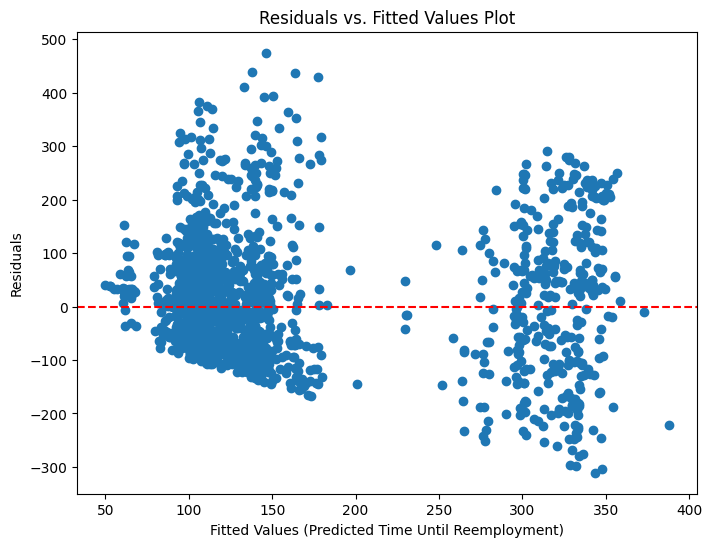

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Convert Age into a categorical variable with buckets
data['Age_cat'] = pd.cut(data['Age'], bins=[0, 30, 50, float('inf')], labels=['under 30', '31 to 50', 'over 50'], right=False)
age_cat_dummies = pd.get_dummies(data['Age_cat'], drop_first=False).astype(int)

# Convert Daily wage into categories
data['Wage_cat'] = pd.cut(data['Daily wage (euro)'], bins=[-np.inf, 50, 100, np.inf], labels=['low wage', 'medium wage', 'high wage'], right=False)
wage_cat_dummies = pd.get_dummies(data['Wage_cat'], drop_first=False).astype(int)

# Convert time until reemployment into categories for segmentation
data['Reemployment_time_cat'] = pd.cut(data['time until reemployment'], bins=[0, 90, 180, np.inf], labels=['short time', 'medium time', 'long time'], right=False)
reemployment_time_cat_dummies = pd.get_dummies(data['Reemployment_time_cat'], drop_first=False).astype(int)

# Convert total duration of UI benefits into categories
data['UI_duration_cat'] = pd.cut(data['total duration of UI benefits'], bins=[0, 500, 1000, np.inf], labels=['0-500', '500-1000', '1000 and over'], right=False)
ui_duration_cat_dummies = pd.get_dummies(data['UI_duration_cat'], drop_first=False).astype(int)

# Combine all dummies back with the original dataframe
data = pd.concat([data, age_cat_dummies, wage_cat_dummies, reemployment_time_cat_dummies, ui_duration_cat_dummies], axis=1)

# Create interaction terms
data['Male_training'] = data['Male'] * data['training']
data['Male_Age'] = data['Male'] * data['Age']
data['Male_low_skill'] = data['Male'] * data['low skill']

# Define independent variables including categorical ones and interactions with the 'Male' field
data['Male_inter_age_under_30'] = data['Male'] * data['under 30']
data['Male_inter_age_31_to_50'] = data['Male'] * data['31 to 50']
data['Male_inter_age_over_50'] = data['Male'] * data['over 50']

# Define full list of predictors including new interaction terms
X = data[['Age', 'training', 'under 30', '31 to 50', 'over 50', 'low skill', 'low wage', 'medium wage', 'high wage', '0-500', '500-1000', '1000 and over', 'Male', 'Male_training', 'Male_Age', 'Male_low_skill', 'Male_inter_age_under_30', 'Male_inter_age_31_to_50', 'Male_inter_age_over_50']]
X = sm.add_constant(X)  # Adding a constant column for the intercept

# Convert all columns in X to numeric and handle any errors
for col in X.columns:
    X[col] = pd.to_numeric(X[col], errors='coerce')

# Drop rows with any missing values
X.dropna(inplace=True)
y = data['time until reemployment'].loc[X.index]  # Ensure y aligns with rows in X

# Convert y to numeric, ensuring no missing values
y = pd.to_numeric(y, errors='coerce')
y.dropna(inplace=True)

# Ensure X and y have the same length after dropping missing values
X = X.loc[y.index]

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

# Get model predictions (fitted values)
y_pred = model.predict(X)

# Calculate residuals
residuals = y - y_pred

# Create the residual plot
plt.figure(figsize=(8, 6))
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='dashed')  # Add a horizontal line at zero
plt.xlabel('Fitted Values (Predicted Time Until Reemployment)')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values Plot')
plt.show()


In [ ]:
#Lasso Coefficient

from sklearn.decomposition import PCA
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X.iloc[:, 1:])  # Exclude the intercept

# PCA to reduce dimensionality
pca = PCA(n_components=0.95)  # retain 95% of variance

# LassoCV for regularization
lasso = LassoCV(cv=5)

# Create a pipeline
pipeline = make_pipeline(scaler, pca, lasso)

# Fit the model
pipeline.fit(X_scaled, y)

# Evaluate the model
print("Lasso Coefficients:", lasso.coef_)


Lasso Coefficients: [ 21.88747505 -11.05508974 -12.75884388  18.09800928  14.22597154
 -23.22567967 -26.70439085  -0.          -1.55624172]


In [ ]:
#Checking Skewness in variables.

import pandas as pd
from scipy.stats import skew, kurtosis

# Assuming 'data' is your DataFrame already loaded with the necessary columns

# List of continuous variables to check
variables_to_check = ['Age', 'time until reemployment', 'total duration of UI benefits', 'Daily wage (euro)']

# Initialize DataFrame to store results
stats_df = pd.DataFrame(columns=['Variable', 'Group', 'Skewness', 'Kurtosis'])

# Calculate skewness and kurtosis for each variable
for var in variables_to_check:
    # Calculations for the whole dataset
    overall_skewness = skew(data[var].dropna())
    overall_kurtosis = kurtosis(data[var].dropna())
    overall_stats = pd.DataFrame({
        'Variable': [var],
        'Group': ['All'],
        'Skewness': [overall_skewness],
        'Kurtosis': [overall_kurtosis]
    })
    stats_df = pd.concat([stats_df, overall_stats], ignore_index=True)

    # Calculations for Male = 0
    male_0_skewness = skew(data[data['Male'] == 0][var].dropna())
    male_0_kurtosis = kurtosis(data[data['Male'] == 0][var].dropna())
    male_0_stats = pd.DataFrame({
        'Variable': [var],
        'Group': ['Male = 0'],
        'Skewness': [male_0_skewness],
        'Kurtosis': [male_0_kurtosis]
    })
    stats_df = pd.concat([stats_df, male_0_stats], ignore_index=True)

    # Calculations for Male = 1
    male_1_skewness = skew(data[data['Male'] == 1][var].dropna())
    male_1_kurtosis = kurtosis(data[data['Male'] == 1][var].dropna())
    male_1_stats = pd.DataFrame({
        'Variable': [var],
        'Group': ['Male = 1'],
        'Skewness': [male_1_skewness],
        'Kurtosis': [male_1_kurtosis]
    })
    stats_df = pd.concat([stats_df, male_1_stats], ignore_index=True)

# Print the results
print(stats_df)




                         Variable     Group  Skewness   Kurtosis
0                             Age       All  0.559544  -1.022435
1                             Age  Male = 0  0.660678  -0.865032
2                             Age  Male = 1 -0.073446  -1.405983
3         time until reemployment       All  1.464693   1.659507
4         time until reemployment  Male = 0  1.559260   2.096587
5         time until reemployment  Male = 1  1.014756   0.068319
6   total duration of UI benefits       All  2.078864   9.652369
7   total duration of UI benefits  Male = 0  2.440549  13.215202
8   total duration of UI benefits  Male = 1  0.951320   2.890729
9               Daily wage (euro)       All  0.796021   0.592878
10              Daily wage (euro)  Male = 0  0.672270   0.822035
11              Daily wage (euro)  Male = 1  0.094750  -1.069174


In [ ]:
import pandas as pd
from scipy.stats import boxcox
from scipy.special import boxcox1p  # This handles adding 1 and applying Box-Cox in one step

# Loading data - Assuming data is already loaded in 'data' DataFrame
# data = pd.read_csv('your_data.csv')

# List of variables to transform
variables_to_transform = ['Age', 'time until reemployment', 'total duration of UI benefits', 'Daily wage (euro)']

# Dictionary to store lambda values for later reference or inverse transformation
lambdas = {}

# Applying Box-Cox Transformation
transformed_data = data.copy()  # Creating a copy to store transformations

for var in variables_to_transform:
    # Shift the data if there are non-positive values
    min_val = transformed_data[var].min()
    if min_val <= 0:
        shift = abs(min_val) + 1
        transformed_data[var] = transformed_data[var] + shift

    # Apply Box-Cox Transformation
    transformed_data[var], best_lambda = boxcox(transformed_data[var])
    lambdas[var] = best_lambda

    # Store the lambda for each variable
    print(f"Best lambda for {var}: {best_lambda}")

# Now `transformed_data` contains the Box-Cox transformed variables.


Best lambda for Age: -0.7179844357597976
Best lambda for time until reemployment: 0.14439590267627278
Best lambda for total duration of UI benefits: -0.0151457097185853
Best lambda for Daily wage (euro): 0.27940227037036774


In [ ]:
#Apply Transformations

import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load data - assuming 'data' is your DataFrame
# data = pd.read_csv('your_data.csv')

# Apply transformations
data['Age_transformed'] = data['Age'] ** -0.7179844357597976  # Inverse transformation
data['total_duration_UI_transformed'] = np.log1p(data['total duration of UI benefits'])
data['Daily_wage_transformed'] = np.sqrt(data['Daily wage (euro)'])

# Apply the transformation to the dependent variable
data['time_until_reemployment_transformed'] = np.log1p(data['time until reemployment'])



In [ ]:
#Define New Model Variables
#excluded variables 'Male','Male_training', 'Male_Age', 'Male_low_skill', 'Male_inter_age_under_30', 'Male_inter_age_31_to_50', 'Male_inter_age_over_50','Daily_wage_transformed', 'Age_transformed','Daily wage (euro)', 'low skill', 'Male',
#y = data['time_until_reemployment_transformed']

filtered_data = data[(data['Male'] == 0) & (data['Age'] >= 25) | (data['low skill'] == 0)]
#filtered_data = data[(data['Age'] >= 25) | (data['low skill'] == 0)]

# Selecting the independent variables, now including the transformed ones
X = filtered_data[['training', 'under 30', '31 to 50', 'over 50','0-500', '500-1000', '1000 and over',  'total_duration_UI_transformed','Male_training', 'Age_transformed','Male_Age', 'Male_low_skill', 'Male_inter_age_under_30', 'Male_inter_age_31_to_50', 'Male_inter_age_over_50','Daily_wage_transformed', 'Age_transformed','Daily wage (euro)', 'low skill' ]]
X = sm.add_constant(X)  # Adding a constant column for the intercept

# Dependent variable
y = filtered_data['time until reemployment']

#Fit the Regression Model

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary of the regression results
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.367
Model:                                 OLS   Adj. R-squared:                  0.363
Method:                      Least Squares   F-statistic:                     82.42
Date:                     Sat, 11 May 2024   Prob (F-statistic):          8.26e-199
Time:                             09:06:25   Log-Likelihood:                -12985.
No. Observations:                     2145   AIC:                         2.600e+04
Df Residuals:                         2129   BIC:                         2.609e+04
Df Model:                               15                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

In [ ]:
#Define New Model Variables
#excluded variables 'Male','Male_training', 'Male_Age', 'Male_low_skill', 'Male_inter_age_under_30', 'Male_inter_age_31_to_50', 'Male_inter_age_over_50','Daily_wage_transformed', 'Age_transformed','Daily wage (euro)', 'low skill', 'Male',
#y = data['time_until_reemployment_transformed']

filtered_data = data[(data['Male'] == 1) & (data['Age'] >= 25) | (data['low skill'] == 1)]
#filtered_data = data[(data['Age'] >= 25) | (data['low skill'] == 0)]

# Selecting the independent variables, now including the transformed ones
X = filtered_data[['training', 'under 30', '31 to 50', 'over 50','0-500', '500-1000', '1000 and over',  'total_duration_UI_transformed','Male_training', 'Age_transformed','Male_Age', 'Male_low_skill', 'Male_inter_age_under_30', 'Male_inter_age_31_to_50', 'Male_inter_age_over_50','Daily_wage_transformed', 'Age_transformed','Daily wage (euro)', 'low skill' ]]
X = sm.add_constant(X)  # Adding a constant column for the intercept

# Dependent variable
y = filtered_data['time until reemployment']

#Fit the Regression Model

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary of the regression results
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.418
Model:                                 OLS   Adj. R-squared:                  0.397
Method:                      Least Squares   F-statistic:                     20.14
Date:                     Sat, 11 May 2024   Prob (F-statistic):           9.53e-41
Time:                             09:08:23   Log-Likelihood:                -2726.6
No. Observations:                      437   AIC:                             5485.
Df Residuals:                          421   BIC:                             5551.
Df Model:                               15                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

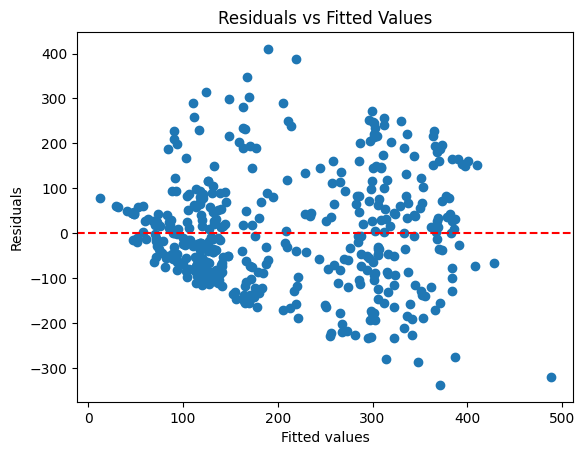

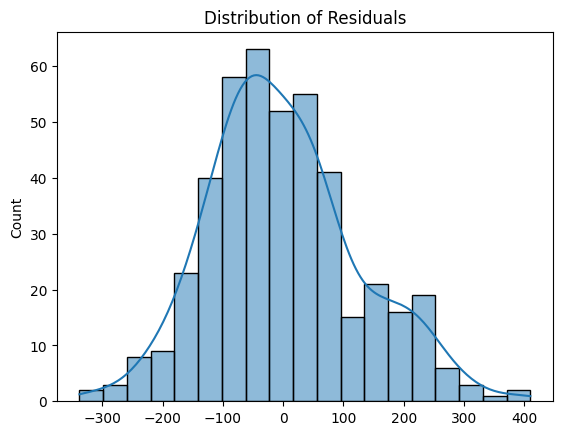

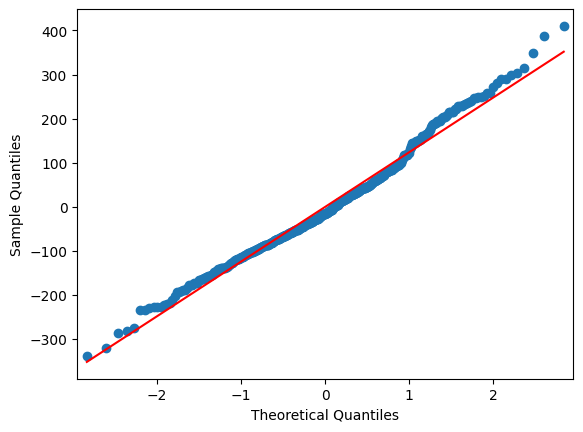

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Residual plot to check for homoscedasticity
residuals = model.resid
plt.scatter(model.predict(X), residuals)
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted Values')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

# Histogram of residuals to check for normality
sns.histplot(residuals, kde=True)
plt.title('Distribution of Residuals')
plt.show()

# Q-Q plot to check for normality in detail
from statsmodels.graphics.gofplots import qqplot
qqplot(residuals, line='s')
plt.show()


In [ ]:
from lifelines import CoxPHFitter

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Preparing the data for survival analysis
data['event'] = data['time until reemployment'].notnull().astype(int)
data['duration'] = data['time until reemployment']

# Drop any rows with missing values in the relevant columns (start_time is already gone)
data.dropna(subset=['duration', 'event', 'training', 'Age', 'Male', 'Daily wage (euro)', 'low skill','total duration of UI benefits'], inplace=True)

# Fitting the Cox Proportional Hazards model
cph = CoxPHFitter()
cph.fit(data[['duration', 'event', 'training', 'Age', 'Male', 'Daily wage (euro)', 'low skill','total duration of UI benefits']], duration_col='duration', event_col='event', show_progress=True)

# Print the summary of the model
print(cph.print_summary())



Iteration 1: norm_delta = 5.12e-01, step_size = 0.9500, log_lik = -14528.79734, newton_decrement = 2.82e+02, seconds_since_start = 0.1
Iteration 2: norm_delta = 1.22e-01, step_size = 0.9500, log_lik = -14221.28669, newton_decrement = 1.76e+01, seconds_since_start = 0.1
Iteration 3: norm_delta = 1.77e-02, step_size = 0.9500, log_lik = -14203.01739, newton_decrement = 2.86e-01, seconds_since_start = 0.2
Iteration 4: norm_delta = 2.29e-04, step_size = 1.0000, log_lik = -14202.72895, newton_decrement = 4.30e-05, seconds_since_start = 0.2
Iteration 5: norm_delta = 3.86e-08, step_size = 1.0000, log_lik = -14202.72891, newton_decrement = 1.14e-12, seconds_since_start = 0.3
Convergence success after 5 iterations.


<lifelines.CoxPHFitter: fitted with 2173 total observations, 0 right-censored observations>
             duration col = 'duration'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 2173
number of events observed = 2173
   partial log-likelihood = -14202.73
         time fit was run = 2024-05-11 09:52:00 UTC

---
                                coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                             
training                       -1.11       0.33       0.07            -1.25            -0.96                 0.29                 0.38
Age                             0.02       1.02       0.00             0.01             0.02                 1.01                 1.02
Male                            0.10       1.10       0.07            -0.03             0.23                 0.97                 1.25
Daily wage (euro)              -0.01       0.99       0.01            -0.02             0.01                 0.98                 1.01
low skill                      -0.10       0.90       0.09            -0.28             0.08                 0.75                 1.08
total duration of UI benefits  -0.00       1.00       0.00            -0.00            -0.00                 1.00                 1.00

                                cmp to      z      p   -log2(p)
covariate                                                      
training                          0.00 -15.03 <0.005     167.09
Age                               0.00   5.52 <0.005      24.85
Male                              0.00   1.50   0.13       2.90
Daily wage (euro)                 0.00  -1.09   0.27       1.87
low skill                         0.00  -1.09   0.27       1.87
total duration of UI benefits     0.00 -10.73 <0.005      86.83
---
Concordance = 0.65
Partial AIC = 28417.46
log-likelihood ratio test = 652.14 on 6 df
-log2(p) of ll-ratio test = 454.71

None


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.365
Model:                                 OLS   Adj. R-squared:                  0.363
Method:                      Least Squares   F-statistic:                     177.5
Date:                     Sun, 12 May 2024   Prob (F-statistic):          5.74e-208
Time:                             05:14:38   Log-Likelihood:                -13181.
No. Observations:                     2173   AIC:                         2.638e+04
Df Residuals:                         2165   BIC:                         2.642e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

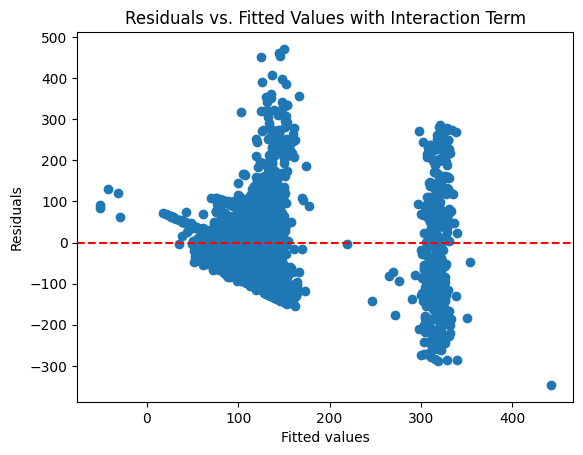

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import boxcox
from scipy.special import boxcox1p  # This handles adding 1 and applying Box-Cox in one step

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Attempt a Box-Cox transformation on 'total duration of UI benefits'
# Add 1 to shift all values positive if necessary (Box-Cox requires all positive values)
##positive_shift = data['total duration of UI benefits'].min() + 1
##data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
##fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
##data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
#print('Lambda for Box-Cox Transformation:', fitted_lambda)
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])


# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_daily_wage'] = np.log1p(data['Daily wage (euro)'])  # log1p is used to handle zero wages smoothly
#data['log_total_duration_UI'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
#data['age_squared'] = data['Age'] ** 2
# Apply a square root transformation to 'Age' to check for improvements
#data['sqrt_age'] = np.sqrt(data['Age'])
# Log transformation for 'Age'
#data['log_age'] = np.log1p(data['Age'])
from sklearn.preprocessing import QuantileTransformer

qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt.fit_transform(data[['Age']])

#filtered_data = data[(data['training'] == 0)]
#(data['Age'] >= 25) | (data['low skill'] == 1) &
from scipy.stats.mstats import winsorize
# Winsorize at 5% and 95% quantiles
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

# Define independent variables including categorical ones #'log_time_until_reemployment','time until reemployment', 'total duration of UI benefits','low skill','older than 50','training',
X = data[['Age', 'Male',  'Daily wage (euro)', 'training', 'UI_quantile_normal', 'log_daily_wage','Age_quantile_normal']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
#y = filtered_data['time until reemployment']
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())



# Recheck the residuals plot
import matplotlib.pyplot as plt
residuals = model.resid
fitted = model.fittedvalues
plt.scatter(fitted, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values with Interaction Term')
plt.show()




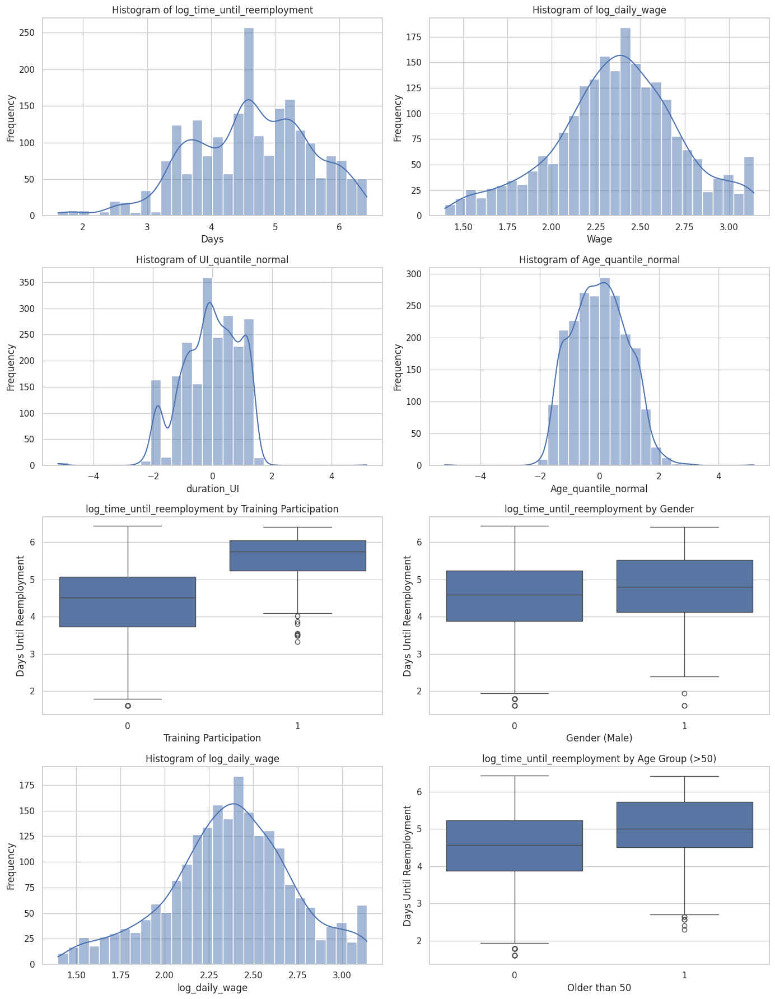

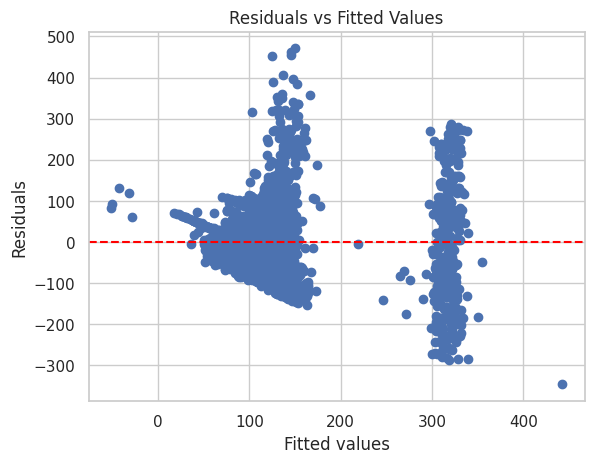

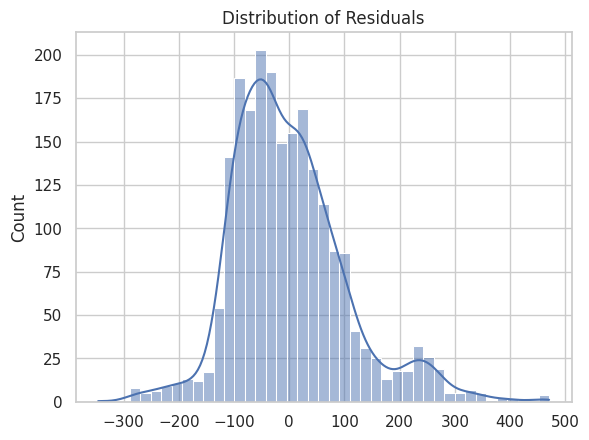

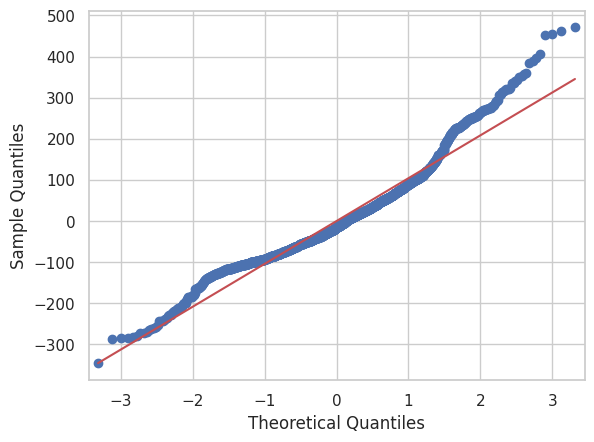

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# VISULISATIONS

import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Creating a figure to host the plots
fig, axes = plt.subplots(4, 2, figsize=(14, 18))

# Plotting histograms and boxplots for key variables
sns.histplot(data['log_time_until_reemployment'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Histogram of log_time_until_reemployment')
axes[0, 0].set_xlabel('Days')
axes[0, 0].set_ylabel('Frequency')

sns.histplot(data['log_daily_wage'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Histogram of log_daily_wage')
axes[0, 1].set_xlabel('Wage')
axes[0, 1].set_ylabel('Frequency')

sns.histplot(data['UI_quantile_normal'], bins=30, kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Histogram of UI_quantile_normal')
axes[1, 0].set_xlabel('duration_UI')
axes[1, 0].set_ylabel('Frequency')

sns.histplot(data['Age_quantile_normal'], bins=30, kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Histogram of Age_quantile_normal')
axes[1, 1].set_xlabel('Age_quantile_normal')
axes[1, 1].set_ylabel('Frequency')

sns.boxplot(x='training', y='log_time_until_reemployment', data=data, ax=axes[2, 0])
axes[2, 0].set_title('log_time_until_reemployment by Training Participation')
axes[2, 0].set_xlabel('Training Participation')
axes[2, 0].set_ylabel('Days Until Reemployment')

sns.boxplot(x='Male', y='log_time_until_reemployment', data=data, ax=axes[2,1])
axes[2, 1].set_title('log_time_until_reemployment by Gender')
axes[2, 1].set_xlabel('Gender (Male)')
axes[2, 1].set_ylabel('Days Until Reemployment')

sns.histplot(data['log_daily_wage'], bins=30, kde=True, ax=axes[3, 0])
axes[3, 0].set_title('Histogram of log_daily_wage')
axes[3, 0].set_xlabel('log_daily_wage')
axes[3, 0].set_ylabel('Frequency')

sns.boxplot(x='older than 50', y='log_time_until_reemployment', data=data, ax=axes[3, 1])
axes[3, 1].set_title('log_time_until_reemployment by Age Group (>50)')
axes[3, 1].set_xlabel('Older than 50')
axes[3, 1].set_ylabel('Days Until Reemployment')

plt.tight_layout()
plt.show()


# Residual plot to check for homoscedasticity
residuals = model.resid
plt.scatter(model.predict(X), residuals)
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted Values')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

# Histogram of residuals to check for normality
sns.histplot(residuals, kde=True)
plt.title('Distribution of Residuals')
plt.show()

# Q-Q plot to check for normality in detail
from statsmodels.graphics.gofplots import qqplot
qqplot(residuals, line='s')
plt.show()

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.363
Model:                                 OLS   Adj. R-squared:                  0.361
Method:                      Least Squares   F-statistic:                     176.0
Date:                     Sun, 12 May 2024   Prob (F-statistic):          1.53e-206
Time:                             05:22:42   Log-Likelihood:                -13184.
No. Observations:                     2173   AIC:                         2.638e+04
Df Residuals:                         2165   BIC:                         2.643e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

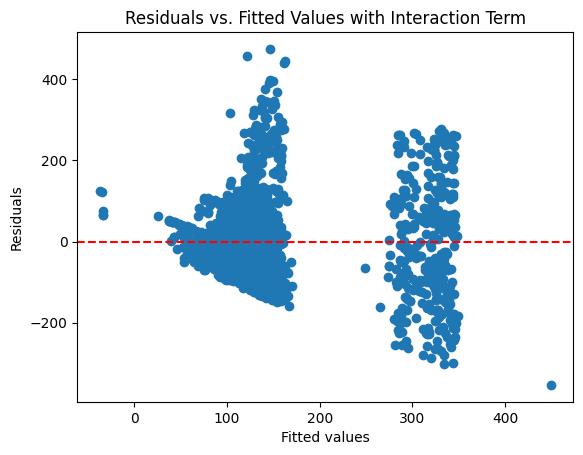

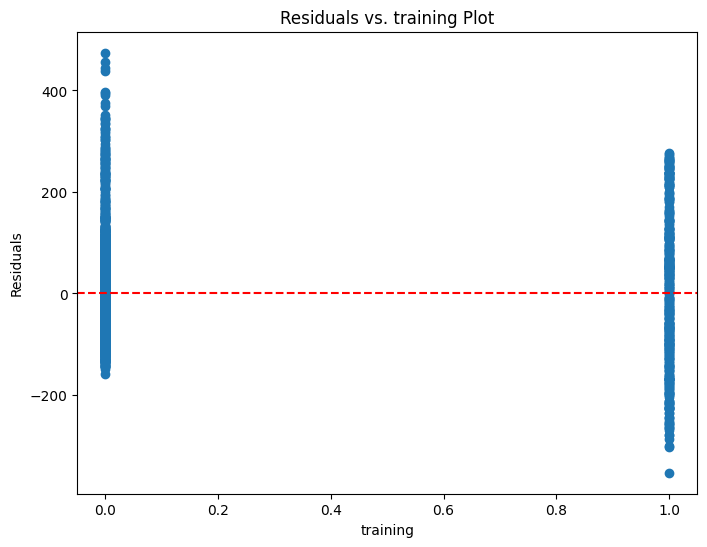

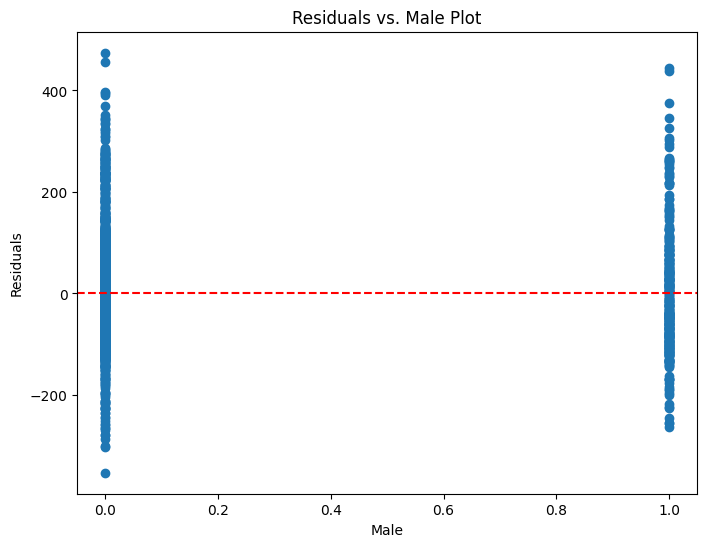

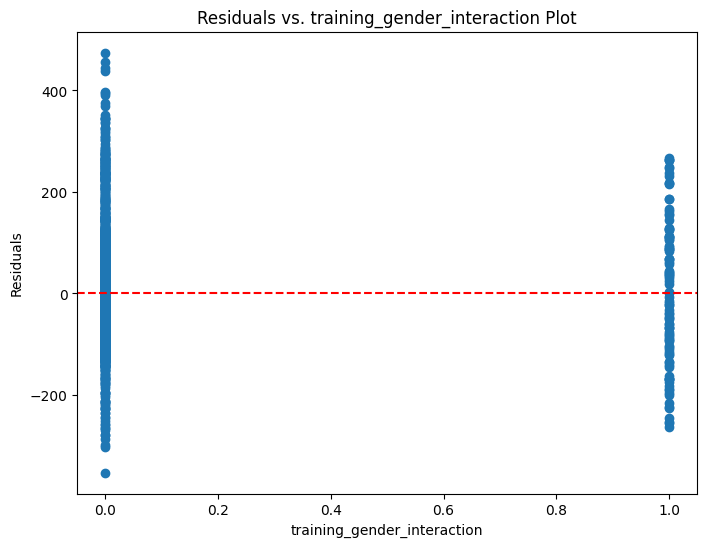

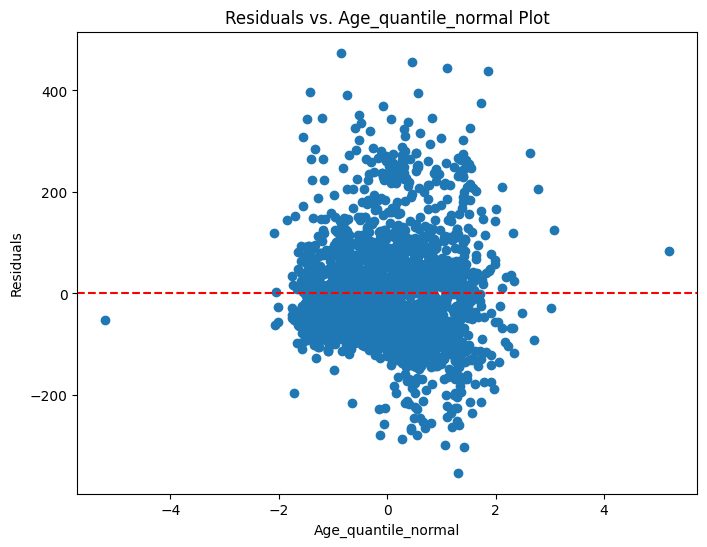

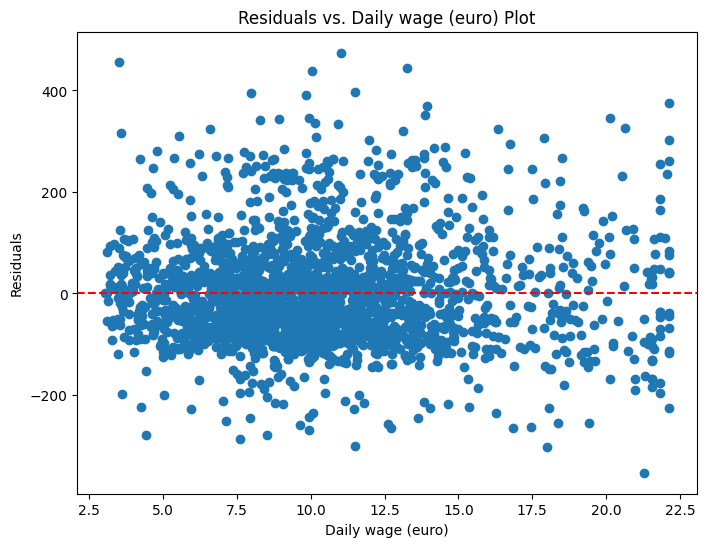

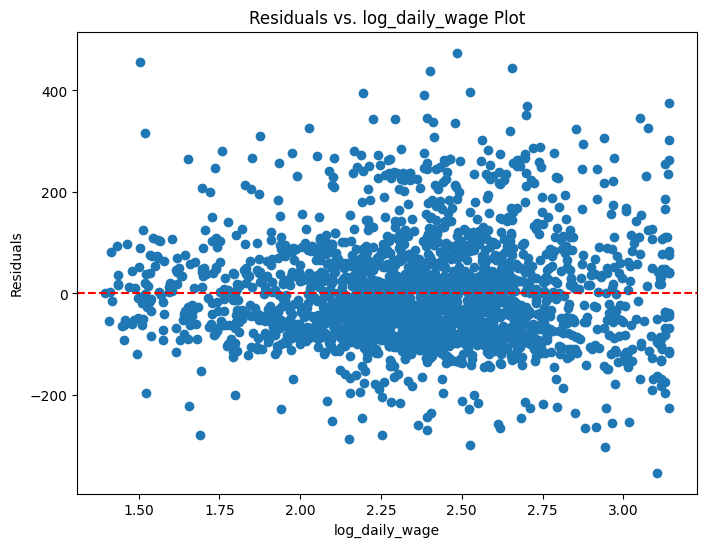

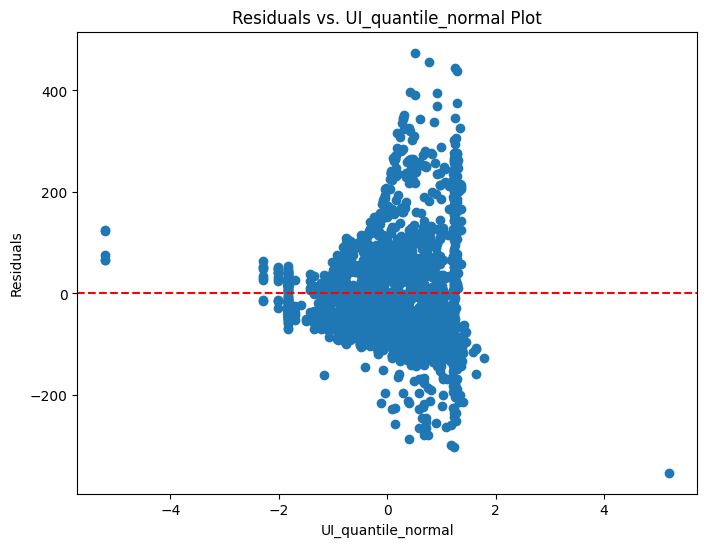

In [ ]:
import statsmodels.api as sm

# Create interaction term
data['training_gender_interaction'] = data['training'] * data['Male']

# Define the model with the interaction term
X = data[['training', 'Male', 'training_gender_interaction', 'Age_quantile_normal', 'Daily wage (euro)','log_daily_wage','UI_quantile_normal']]  # plus other covariates as appropriate
X = sm.add_constant(X)
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Check the summary
print(model.summary())

# Recheck the residuals plot
import matplotlib.pyplot as plt
residuals = model.resid
fitted = model.fittedvalues
plt.scatter(fitted, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values with Interaction Term')
plt.show()

import matplotlib.pyplot as plt

# Choose a predictor variable to plot (e.g., 'Age')
predictor = 'Age'

# Get model predictions (fitted values)
y_pred = model.predict(X)

# Calculate residuals
residuals = y - y_pred


#Function to create a single plot for both continous and categorical variables
def plot_residuals(predictor):
    plt.figure(figsize=(8, 6))

    # Check if the predictor is in the original data
    if predictor in data.columns:

        # Check if predictor is numeric for scatter plot
        if np.issubdtype(data[predictor].dtype, np.number):
            plt.scatter(data[predictor].loc[X.index], residuals)

        # Otherwise, assume it's categorical for box plot
        else:
            residual_df = pd.DataFrame({'residuals': residuals, predictor: data[predictor].loc[X.index]})
            residual_df.boxplot(column='residuals', by=predictor)
            plt.xticks(rotation=45)

# Correct the predictor list
predictors_to_plot = ['training', 'Male', 'training_gender_interaction',
                      'Age_quantile_normal', 'Daily wage (euro)',
                      'log_daily_wage', 'UI_quantile_normal']

# Modify the plot_residuals function
def plot_residuals(predictor):
    plt.figure(figsize=(8, 6))

    # Check if predictor is in the DataFrame used for the model (X)
    if predictor in X.columns:

        # Check if predictor is numeric for scatter plot
        if np.issubdtype(X[predictor].dtype, np.number):
            plt.scatter(X[predictor], residuals)

        # Otherwise, assume it's categorical for box plot
        else:
            residual_df = pd.DataFrame({'residuals': residuals, predictor: X[predictor]})
            residual_df.boxplot(column='residuals', by=predictor)
            plt.xticks(rotation=45)

    else:
        raise KeyError(f"Predictor '{predictor}' not found in data.")

    plt.axhline(y=0, color='r', linestyle='dashed')
    plt.xlabel(predictor)
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs. {predictor} Plot')
    plt.show()


# Generate plots for the corrected list of predictors
for predictor in predictors_to_plot:
    plot_residuals(predictor)

Optimal lambda for Yeo-Johnson transformation: -0.7581921845457731


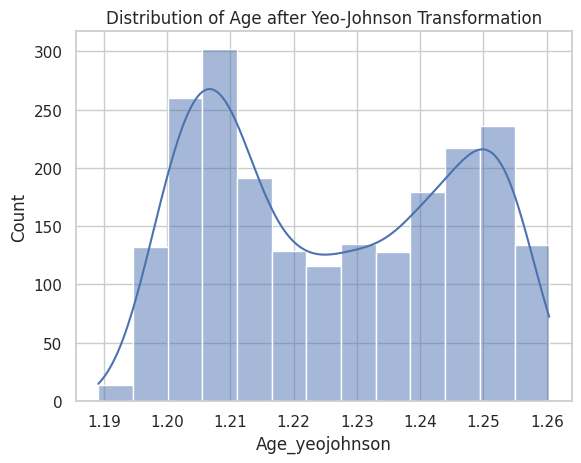

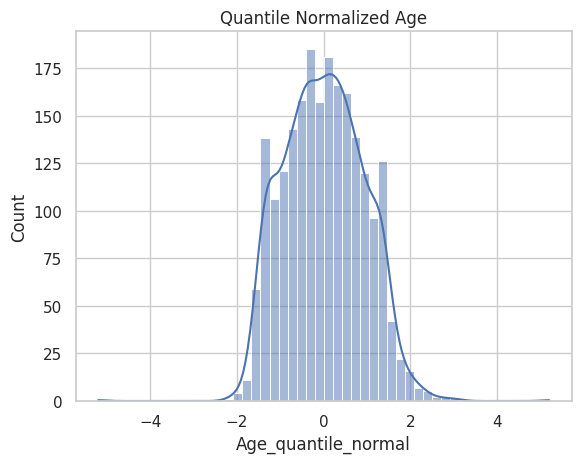

Optimal lambda for Yeo-Johnson transformation: -0.017802030880803316


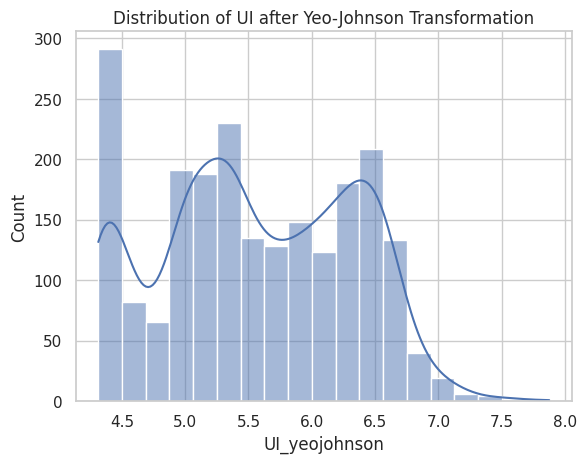

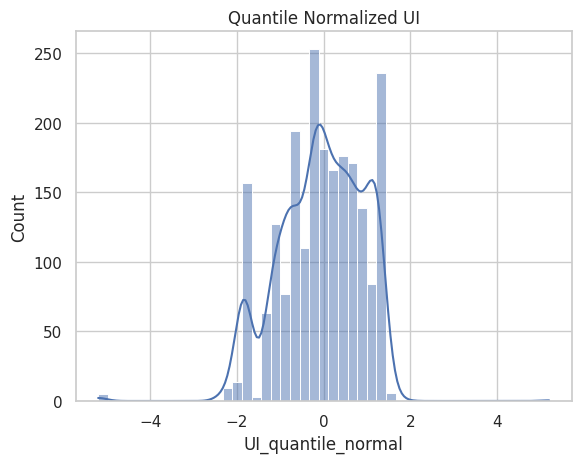

In [ ]:
from scipy.stats import yeojohnson

# Apply Yeo-Johnson transformation
data['Age_yeojohnson'], param = yeojohnson(data['Age'])
print(f"Optimal lambda for Yeo-Johnson transformation: {param}")

# Check the distribution again
sns.histplot(data['Age_yeojohnson'], kde=True)
plt.title('Distribution of Age after Yeo-Johnson Transformation')
plt.show()

from sklearn.preprocessing import QuantileTransformer

qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt.fit_transform(data[['Age']])

# Check the new distribution
sns.histplot(data['Age_quantile_normal'], kde=True)
plt.title('Quantile Normalized Age')
plt.show()

from scipy.stats import yeojohnson

# Apply Yeo-Johnson transformation
data['UI_yeojohnson'], param = yeojohnson(data['total duration of UI benefits'])
print(f"Optimal lambda for Yeo-Johnson transformation: {param}")

# Check the distribution again
sns.histplot(data['UI_yeojohnson'], kde=True)
plt.title('Distribution of UI after Yeo-Johnson Transformation')
plt.show()

from sklearn.preprocessing import QuantileTransformer

qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])

# Check the new distribution
sns.histplot(data['UI_quantile_normal'], kde=True)
plt.title('Quantile Normalized UI')
plt.show()

In [ ]:
import statsmodels.api as sm

# Assuming 'log_time_until_reemployment' and 'UI_quantile_normal' are already in your DataFrame
# and represent the logged time until reemployment and normalized UI benefits, respectively.

# Create the interaction term
data['interaction_age_UI'] = data['Age'] * data['total duration of UI benefits']

# Add this new interaction term to your model's features
X = data[[ 'interaction_age_UI', 'Male', 'training','log_daily_wage']]
X = sm.add_constant(X)  # Adding a constant term for the intercept

# Define the dependent variable
y = data['time until reemployment']  # or whatever your dependent variable is

# Fit the model
model = sm.OLS(y, X).fit()

# Check the summary of your model to see the impact of the interaction term
print(model.summary())


                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.331
Model:                                 OLS   Adj. R-squared:                  0.330
Method:                      Least Squares   F-statistic:                     267.9
Date:                     Sat, 11 May 2024   Prob (F-statistic):          2.88e-187
Time:                             11:00:57   Log-Likelihood:                -13237.
No. Observations:                     2173   AIC:                         2.648e+04
Df Residuals:                         2168   BIC:                         2.651e+04
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.342
Model:                                 OLS   Adj. R-squared:                  0.340
Method:                      Least Squares   F-statistic:                     160.6
Date:                     Sat, 11 May 2024   Prob (F-statistic):          1.73e-191
Time:                             11:15:09   Log-Likelihood:                -13219.
No. Observations:                     2173   AIC:                         2.645e+04
Df Residuals:                         2165   BIC:                         2.650e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

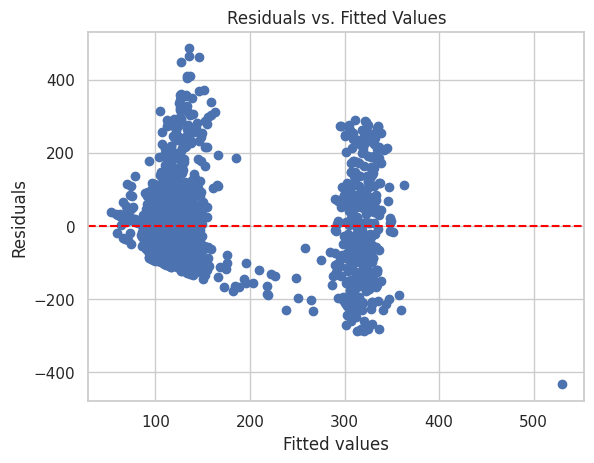

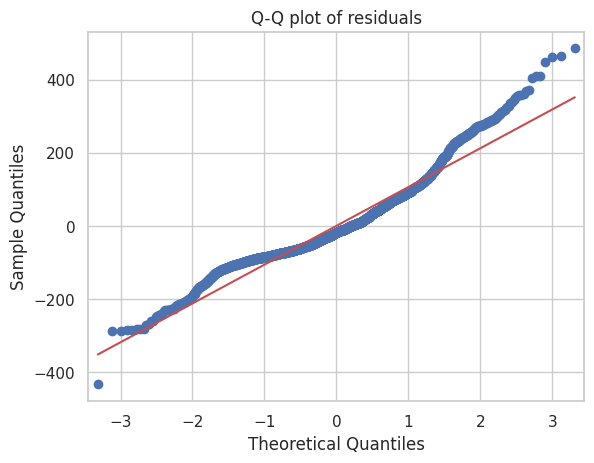

In [ ]:
#Initial Multiple Regression on all variables.

import pandas as pd
import statsmodels.api as sm

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

from scipy.stats.mstats import winsorize
# Winsorize at 5% and 95% quantiles
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])


# Define independent variables including categorical ones
X = data[['Age', 'Male', 'older than 50', 'transformed_wage', 'training', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
y = data['time until reemployment']

# Fit the model
model = sm.OLS(y, X).fit()

# Print the summary
print(model.summary())

import matplotlib.pyplot as plt

# Plot residuals
residuals = model.resid
fitted = model.fittedvalues
plt.scatter(fitted, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values')
plt.show()

# Optionally, plot residuals to check normality
sm.qqplot(residuals, line='s')
plt.title('Q-Q plot of residuals')
plt.show()


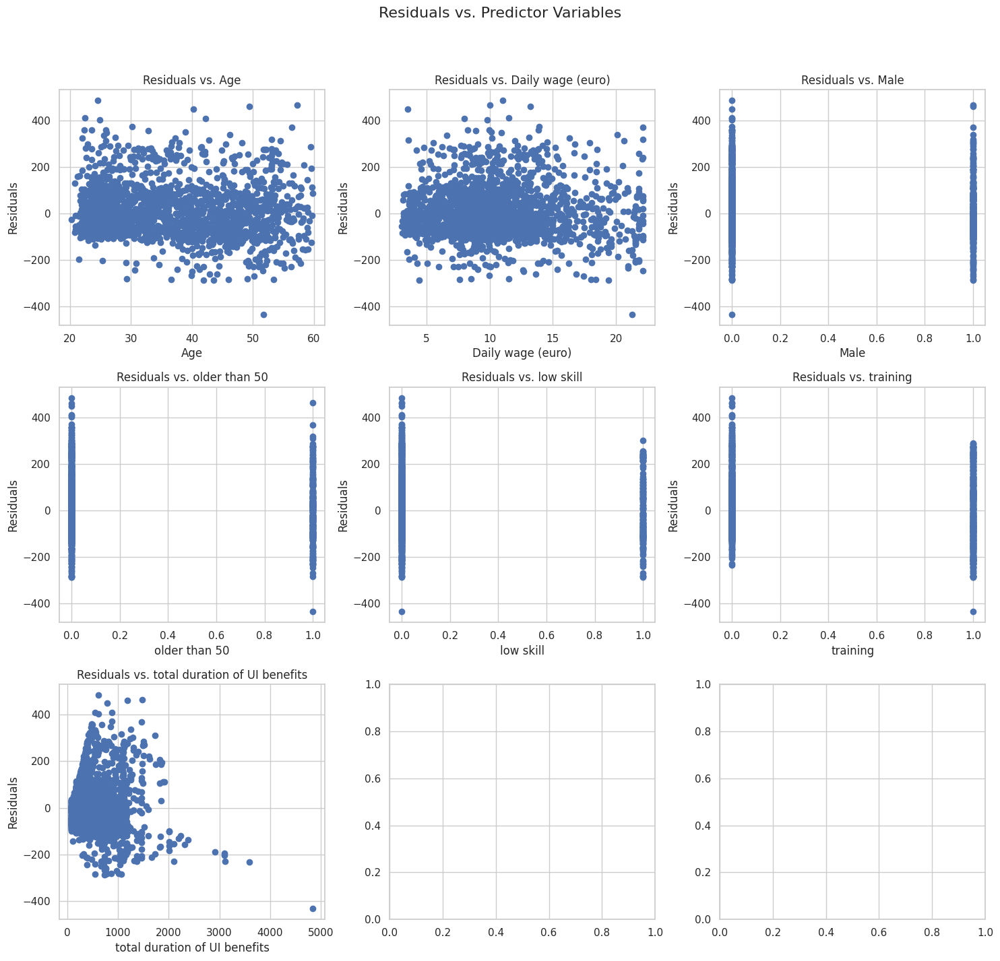

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# Assuming 'model' is your fitted regression model
residuals = model.resid
fitted = model.fittedvalues

# Plot residuals against each predictor variable
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
fig.suptitle('Residuals vs. Predictor Variables', fontsize=16)

predictors = ['Age', 'Daily wage (euro)', 'Male', 'older than 50', 'low skill', 'training', 'total duration of UI benefits']

for ax, predictor in zip(axes.flatten(), predictors):
    ax.scatter(data[predictor], residuals)
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Residuals')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


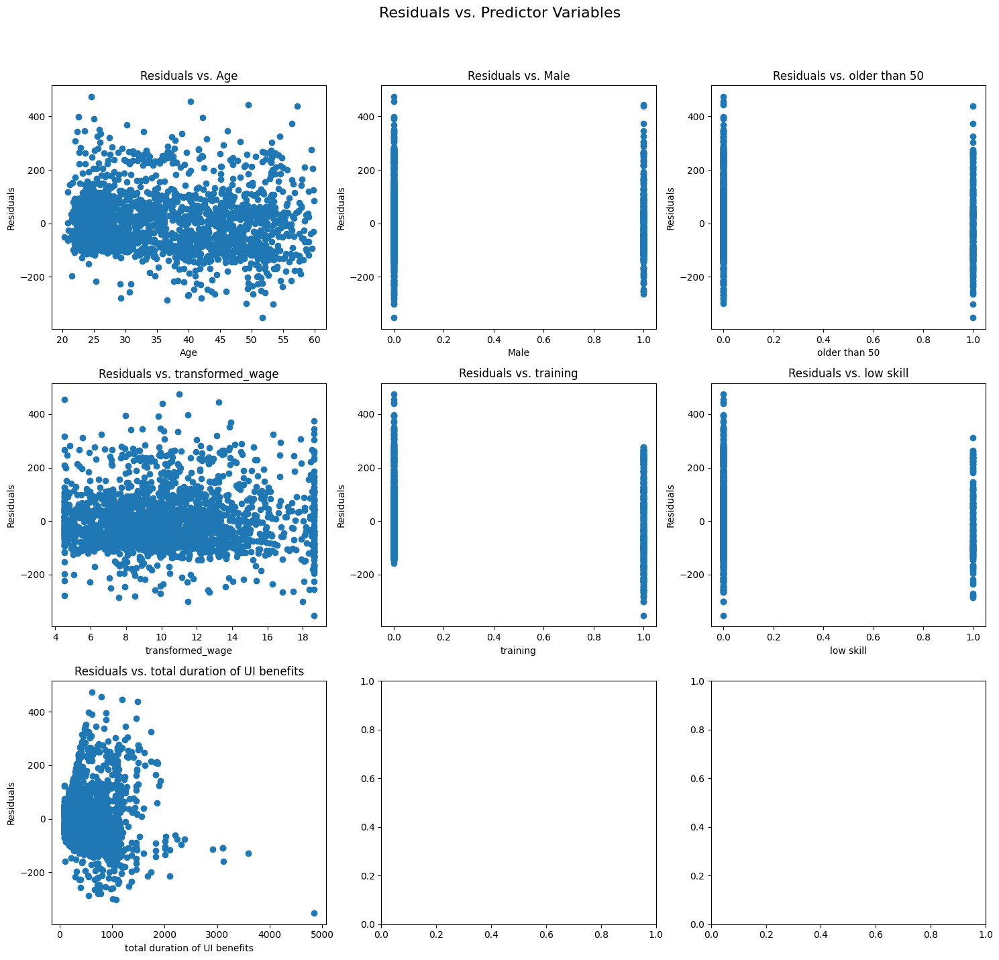

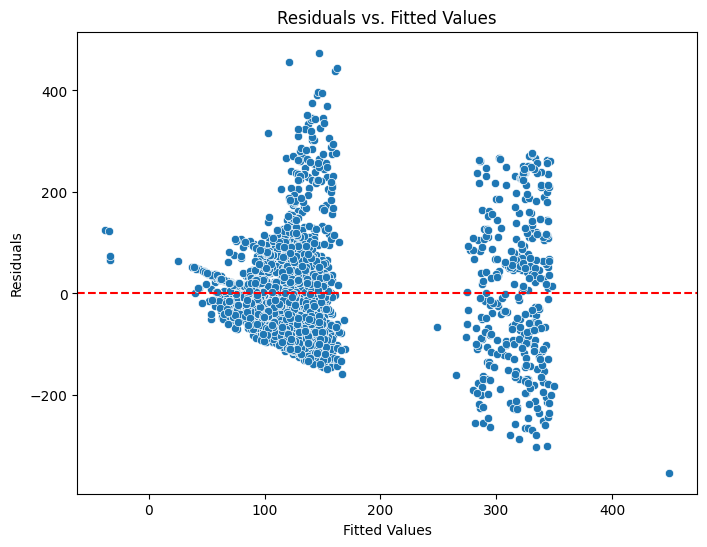

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# Assuming 'model' is your fitted regression model
residuals = model.resid
fitted = model.fittedvalues

# Plot residuals against each predictor variable
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
fig.suptitle('Residuals vs. Predictor Variables', fontsize=16)

predictors = ['Age', 'Male', 'older than 50', 'transformed_wage', 'training', 'low skill', 'total duration of UI benefits']

for ax, predictor in zip(axes.flatten(), predictors):
    ax.scatter(data[predictor], residuals)
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Residuals')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'model' is your fitted regression model
residuals = model.resid
fitted = model.fittedvalues

# Plot fitted values vs residuals
plt.figure(figsize=(8, 6))  # Optional: adjust figure size
sns.scatterplot(x=fitted, y=residuals)
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='dashed')  # Add a horizontal line at zero
plt.show()

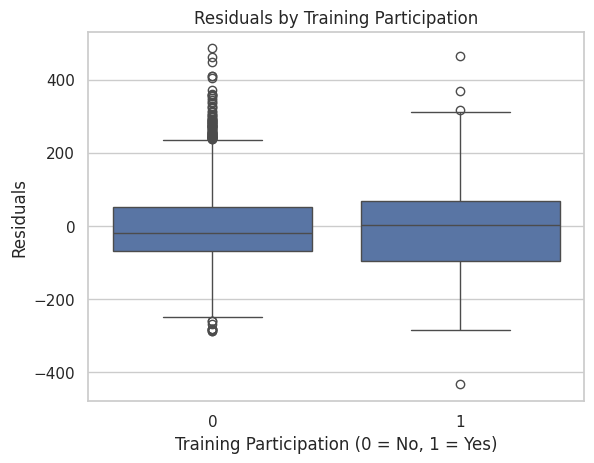

In [ ]:
sns.boxplot(x=data['older than 50'], y=residuals)
plt.title('Residuals by Training Participation')
plt.xlabel('Training Participation (0 = No, 1 = Yes)')
plt.ylabel('Residuals')
plt.show()

In [ ]:
from statsmodels.regression.linear_model import WLS

# Example: Weighting by inverse of the variance estimated from 'UI_quantile_normal'
weights = 1 / data['UI_quantile_normal']**2
model_wls = WLS(y, X, weights=weights).fit()
print(model_wls.summary())

                               WLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.361
Model:                                 WLS   Adj. R-squared:                  0.359
Method:                      Least Squares   F-statistic:                     174.9
Date:                     Sat, 11 May 2024   Prob (F-statistic):          1.86e-205
Time:                             11:40:31   Log-Likelihood:                -12830.
No. Observations:                     2173   AIC:                         2.568e+04
Df Residuals:                         2165   BIC:                         2.572e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import boxcox
from scipy.special import boxcox1p  # This handles adding 1 and applying Box-Cox in one step

# Load dataset
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

# Attempt a Box-Cox transformation on 'total duration of UI benefits'
# Add 1 to shift all values positive if necessary (Box-Cox requires all positive values)
##positive_shift = data['total duration of UI benefits'].min() + 1
##data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
##fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
##data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
#print('Lambda for Box-Cox Transformation:', fitted_lambda)
#qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
#data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])
from statsmodels.regression.linear_model import WLS

# Example: Weighting by inverse of the variance estimated from 'UI_quantile_normal'
#weights = 1 / data['total duration of UI benefits']**2
#model_wls = WLS(y, X, weights=weights).fit()

# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_daily_wage'] = np.log1p(data['Daily wage (euro)'])  # log1p is used to handle zero wages smoothly
#data['log_total_duration_UI'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
#data['age_squared'] = data['Age'] ** 2
# Apply a square root transformation to 'Age' to check for improvements
#data['sqrt_age'] = np.sqrt(data['Age'])
# Log transformation for 'Age'
#data['log_age'] = np.log1p(data['Age'])
from sklearn.preprocessing import QuantileTransformer

qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt.fit_transform(data[['Age']])

#filtered_data = data[(data['training'] == 0)]
#(data['Age'] >= 25) | (data['low skill'] == 1) &
from scipy.stats.mstats import winsorize
# Winsorize at 5% and 95% quantiles
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

# Define independent variables including categorical ones #'log_time_until_reemployment','time until reemployment', 'total duration of UI benefits','low skill','older than 50','training','log_daily_wage','Age',
X = data[[ 'transformed_wage', 'training']]  # Assume 'Male' and 'training' are binary categorical variables
X = sm.add_constant(X)  # adding a constant

# Define the dependent variable
#y = filtered_data['time until reemployment']
y = data['time until reemployment']

# Adding interaction between 'training' and 'low skill'
data['training_x_low_skill'] = data['training'] * data['low skill']
X['training_x_low_skill'] = data['training_x_low_skill']

# Adding interaction between 'Male' and 'low skill'
#data['male_x_low_skill'] = data['Male'] * data['low skill']
#X['male_x_low_skill'] = data['male_x_low_skill']

# Adding interaction between 'Male' and 'low skill'
data['male_x_training'] = data['Male'] * data['training']
X['male_x_training'] = data['male_x_training']

# Re-fit the model
model = sm.OLS(y, X).fit()
print(model.summary())



                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.330
Model:                                 OLS   Adj. R-squared:                  0.329
Method:                      Least Squares   F-statistic:                     267.4
Date:                     Sat, 11 May 2024   Prob (F-statistic):          5.73e-187
Time:                             14:17:36   Log-Likelihood:                -13238.
No. Observations:                     2173   AIC:                         2.649e+04
Df Residuals:                         2168   BIC:                         2.651e+04
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

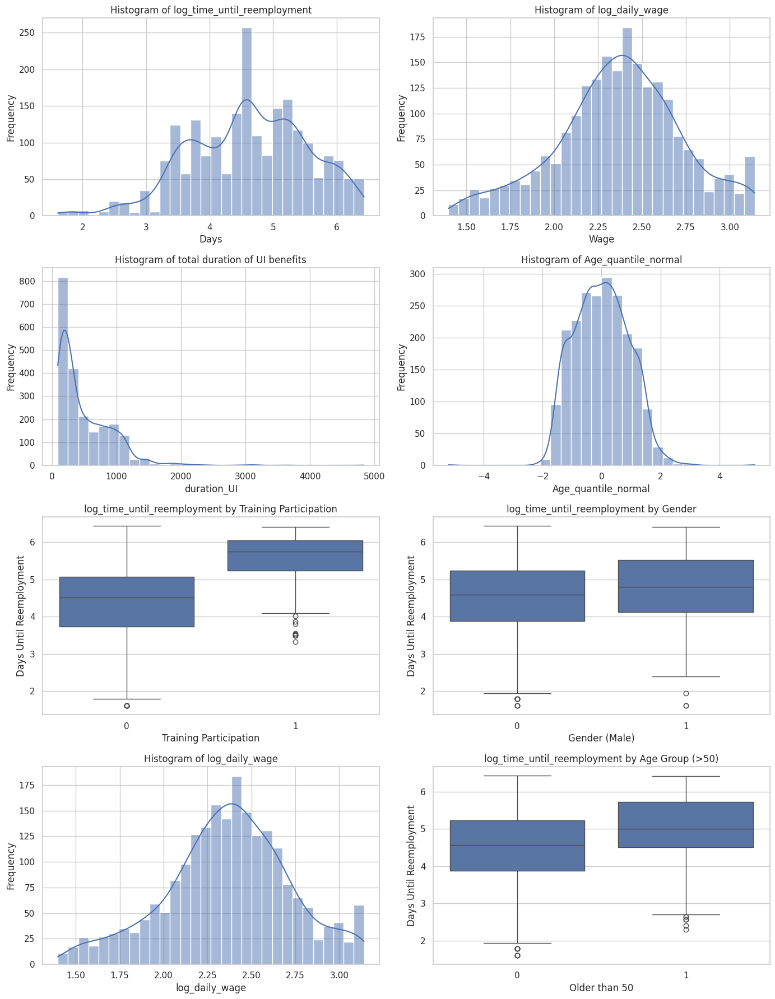

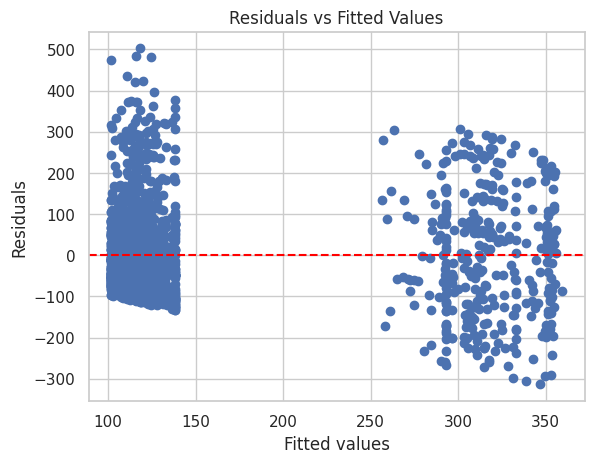

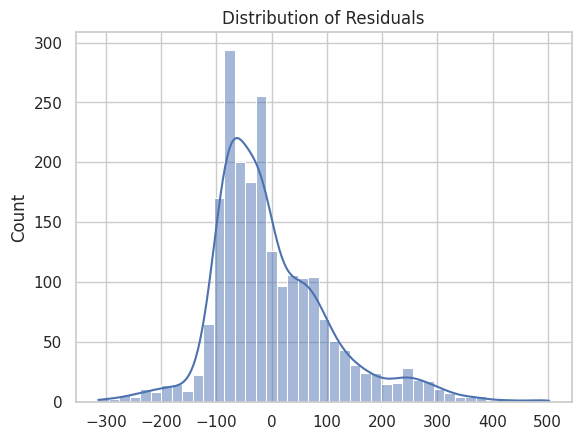

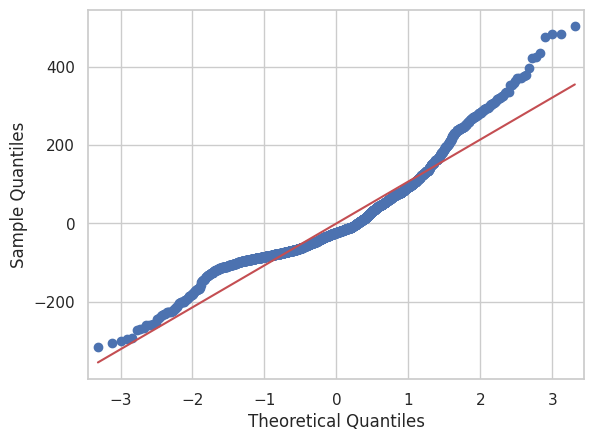

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# VISULISATIONS

import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Creating a figure to host the plots
fig, axes = plt.subplots(4, 2, figsize=(14, 18))

# Plotting histograms and boxplots for key variables
sns.histplot(data['log_time_until_reemployment'], bins=30, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Histogram of log_time_until_reemployment')
axes[0, 0].set_xlabel('Days')
axes[0, 0].set_ylabel('Frequency')

sns.histplot(data['log_daily_wage'], bins=30, kde=True, ax=axes[0, 1])
axes[0, 1].set_title('Histogram of log_daily_wage')
axes[0, 1].set_xlabel('Wage')
axes[0, 1].set_ylabel('Frequency')

sns.histplot(data['total duration of UI benefits'], bins=30, kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Histogram of total duration of UI benefits')
axes[1, 0].set_xlabel('duration_UI')
axes[1, 0].set_ylabel('Frequency')

sns.histplot(data['Age_quantile_normal'], bins=30, kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Histogram of Age_quantile_normal')
axes[1, 1].set_xlabel('Age_quantile_normal')
axes[1, 1].set_ylabel('Frequency')

sns.boxplot(x='training', y='log_time_until_reemployment', data=data, ax=axes[2, 0])
axes[2, 0].set_title('log_time_until_reemployment by Training Participation')
axes[2, 0].set_xlabel('Training Participation')
axes[2, 0].set_ylabel('Days Until Reemployment')

sns.boxplot(x='Male', y='log_time_until_reemployment', data=data, ax=axes[2,1])
axes[2, 1].set_title('log_time_until_reemployment by Gender')
axes[2, 1].set_xlabel('Gender (Male)')
axes[2, 1].set_ylabel('Days Until Reemployment')

sns.histplot(data['log_daily_wage'], bins=30, kde=True, ax=axes[3, 0])
axes[3, 0].set_title('Histogram of log_daily_wage')
axes[3, 0].set_xlabel('log_daily_wage')
axes[3, 0].set_ylabel('Frequency')

sns.boxplot(x='older than 50', y='log_time_until_reemployment', data=data, ax=axes[3, 1])
axes[3, 1].set_title('log_time_until_reemployment by Age Group (>50)')
axes[3, 1].set_xlabel('Older than 50')
axes[3, 1].set_ylabel('Days Until Reemployment')

plt.tight_layout()
plt.show()


# Residual plot to check for homoscedasticity
residuals = model.resid
plt.scatter(model.predict(X), residuals)
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted Values')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

# Histogram of residuals to check for normality
sns.histplot(residuals, kde=True)
plt.title('Distribution of Residuals')
plt.show()

# Q-Q plot to check for normality in detail
from statsmodels.graphics.gofplots import qqplot
qqplot(residuals, line='s')
plt.show()

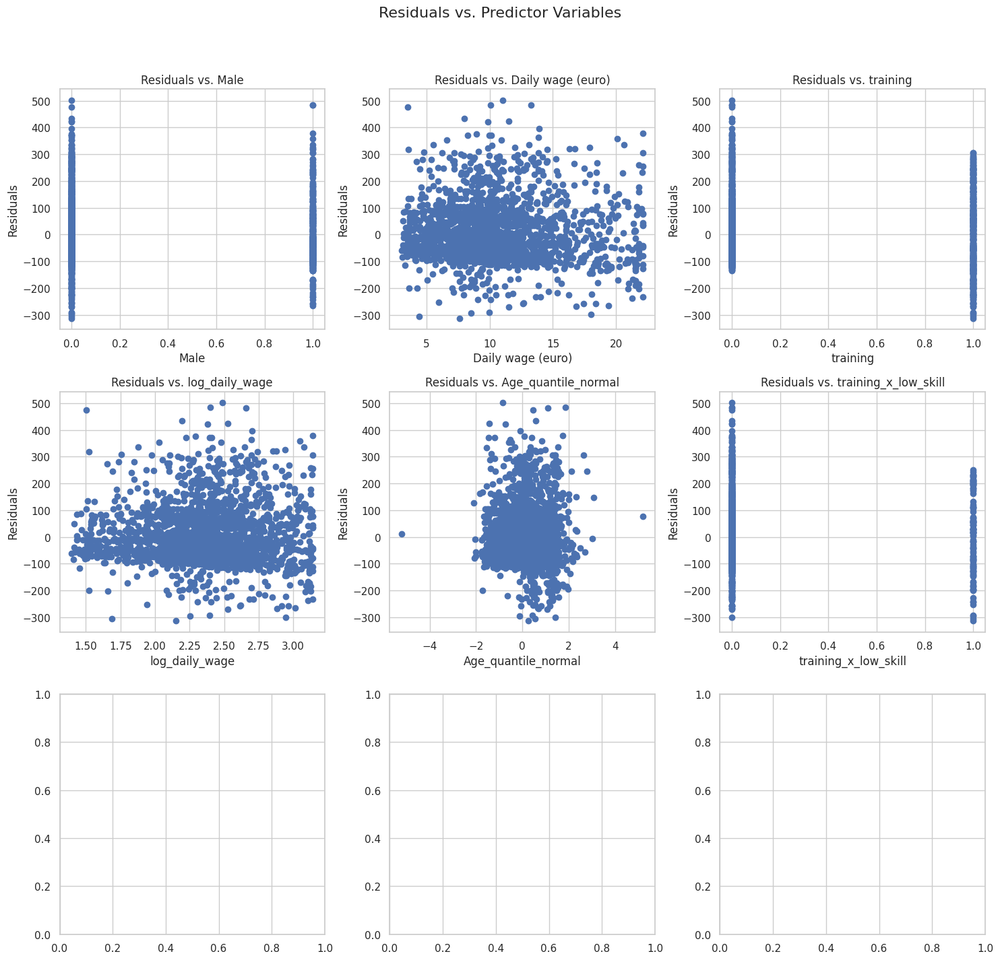

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# Assuming 'model' is your fitted regression model
residuals = model.resid
fitted = model.fittedvalues

# Plot residuals against each predictor variable
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
fig.suptitle('Residuals vs. Predictor Variables', fontsize=16)

predictors = ['Male',  'Daily wage (euro)', 'training', 'log_daily_wage','Age_quantile_normal','training_x_low_skill' ]

for ax, predictor in zip(axes.flatten(), predictors):
    ax.scatter(data[predictor], residuals)
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Residuals')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [ ]:



data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


# Attempt a Box-Cox transformation on 'total duration of UI benefits'
#Add 1 to shift all values positive if necessary (Box-Cox requires all positive values)
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])
from statsmodels.regression.linear_model import WLS

# Example: Weighting by inverse of the variance estimated from 'UI_quantile_normal'
#weights = 1 / data['total duration of UI benefits']**2
#model_wls = WLS(y, X, weights=weights).fit()

# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily wage (euro)'] = np.log1p(data['Daily wage (euro)'])  # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2
# Apply a square root transformation to 'Age' to check for improvements
data['sqrt_age'] = np.sqrt(data['Age'])
# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

from sklearn.preprocessing import QuantileTransformer
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt.fit_transform(data[['Age']])

from scipy.stats.mstats import winsorize
# Winsorize at 5% and 95% quantiles
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

import matplotlib.pyplot as plt
import seaborn as sns

#VISUALISE
#Box-Cox Transformation on total duration of UI benefits:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Original Distribution
sns.histplot(data['total duration of UI benefits'], bins=30, kde=True, ax=axes[0])
axes[0].set_title('Original Distribution of Total Duration of UI Benefits')
axes[0].set_xlabel('Total Duration of UI Benefits')
axes[0].set_ylabel('Frequency')

# Box-Cox Transformed Distribution
sns.histplot(data['boxcox_total_duration_UI'], bins=30, kde=True, ax=axes[1])
axes[1].set_title('Box-Cox Transformed Distribution')
axes[1].set_xlabel('Transformed Total Duration of UI Benefits')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

#Quantile Transformation on total duration of UI benefits:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Original Distribution (same as above)
sns.histplot(data['total duration of UI benefits'], bins=30, kde=True, ax=axes[0])
axes[0].set_title('Original Distribution of Total Duration of UI Benefits')
axes[0].set_xlabel('Total Duration of UI Benefits')
axes[0].set_ylabel('Frequency')

# Quantile Transformed Distribution
sns.histplot(data['UI_quantile_normal'], bins=30, kde=True, ax=axes[1])
axes[1].set_title('Quantile Transformed Distribution (Normal)')
axes[1].set_xlabel('Transformed Total Duration of UI Benefits')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Weighted Least Squares (WLS):
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Residuals vs. Fitted for OLS model
sns.scatterplot(x=model.fittedvalues, y=model.resid, ax=axes[0])
axes[0].set_title('OLS: Residuals vs. Fitted')
axes[0].set_xlabel('Fitted Values')
axes[0].set_ylabel('Residuals')
axes[0].axhline(0, color='red', linestyle='dashed')

# Residuals vs. Fitted for WLS model
sns.scatterplot(x=model_wls.fittedvalues, y=model_wls.resid, ax=axes[1])
axes[1].set_title('WLS: Residuals vs. Fitted')
axes[1].set_xlabel('Fitted Values')
axes[1].set_ylabel('Residuals')
axes[1].axhline(0, color='red', linestyle='dashed')

plt.tight_layout()
plt.show()

#4. Log Transformations on Daily wage (euro), time until reemployment, and Age:
# Create a dictionary mapping variable names to column names
log_var_map = {
    'Daily wage (euro)': 'log_Daily wage (euro)',
    'time until reemployment': 'log_time_until_reemployment',
    'Age': 'log_age'
}

# Plot histograms
for var in ['Daily wage (euro)', 'time until reemployment', 'Age']:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # Original Distribution
    sns.histplot(data[var], bins=30, kde=True, ax=axes[0])
    axes[0].set_title(f'Original Distribution of {var}')
    axes[0].set_xlabel(var)
    axes[0].set_ylabel('Frequency')

    # Log-Transformed Distribution (use the dictionary)
    sns.histplot(data[log_var_map[var]], bins=30, kde=True, ax=axes[1])
    axes[1].set_title(f'Log-Transformed Distribution of {var}')
    axes[1].set_xlabel(f'log({var})')
    axes[1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


#Polynomial and Square Root Transformations on Age:
fig, ax = plt.subplots(figsize=(8, 6))
sns.scatterplot(x='Age', y='time until reemployment', data=data, ax=ax)
ax.set_title('Scatterplot of Age vs. Time Until Reemployment')
ax.set_xlabel('Age')
ax.set_ylabel('Time Until Reemployment')

# Add polynomial fit line (e.g., degree=2 for quadratic)
import numpy as np
import statsmodels.api as sm

# Create the array for prediction, matching the structure of X_poly
X_pred = pd.DataFrame({'Age': x_values, 'Age_squared': x_values**2})
X_pred = sm.add_constant(X_pred)  # Add the constant term


# Add square root fit line (corrected)
X_pred_sqrt = pd.DataFrame({'Age': x_values, 'Age_squared': x_values**2})  # Include 'Age_squared' as well
X_pred_sqrt['Age'] = np.sqrt(X_pred_sqrt['Age'])  # Now take the square root of 'Age'
X_pred_sqrt = sm.add_constant(X_pred_sqrt)  # Add the constant term

y_pred_sqrt = model_poly.predict(X_pred_sqrt)  # Now predicts with the correct dimensions

ax.plot(x_values, y_pred_sqrt, color='blue', label='Square Root Fit')

plt.legend()
plt.show()


#Quantile Transformation on age:
fig, axes = plt.subplots(1, 4, figsize=(10, 4))

# Original Distribution (same as above)
sns.histplot(data['Age'], bins=30, kde=True, ax=axes[0])
axes[0].set_title('Original Distribution of age')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Frequency')


# Apply a square root transformation to 'Age' to check for improvements
#data['sqrt_age'] = np.sqrt(data['Age'])

# Quantile Transformed Distribution
sns.histplot(data['Age_quantile_normal'], bins=30, kde=True, ax=axes[1])
axes[1].set_title('Quantile Transformed Distribution (Normal)')
axes[1].set_xlabel('Q Transformed Age')
axes[1].set_ylabel('Frequency')

# age_squared Transformed Distribution
sns.histplot(data['age_squared'], bins=30, kde=True, ax=axes[2])
axes[2].set_title('age_squared Transformed Distribution (Normal)')
axes[2].set_xlabel('S Transformed Age')
axes[2].set_ylabel('Frequency')

# log_age Transformed Distribution
sns.histplot(data['log_age'], bins=30, kde=True, ax=axes[3])
axes[3].set_title('log_age Transformed Distribution (Normal)')
axes[3].set_xlabel('L Transformed Age')
axes[3].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Original Boxplot
sns.boxplot(data['Daily wage (euro)'], ax=axes[0])
axes[0].set_title('Original Distribution of Daily Wage (euro)')

# Winsorized Boxplot
sns.boxplot(data['transformed_wage'], ax=axes[1])
axes[1].set_title('Winsorized Distribution of Daily Wage (euro)')

plt.tight_layout()
plt.show()

data['training_x_low_skill'] = data['training'] * data['low skill']
data['Male_x_low_skill'] = data['Male'] * data['low skill']
data['Male_x_training'] = data['Male'] * data['training']

# Create a boolean variable for re-employment within 10 days of UI benefits
reemployed_near_end = (  (data['time until reemployment'] >= 0) &  # Ensure re-employment time is non-negative
    (data['total duration of UI benefits'] >= 0) & # Ensure UI benefits duration is non-negative
    (data['time until reemployment'] >= data['total duration of UI benefits'] - 10) &
    (data['time until reemployment'] <= data['total duration of UI benefits']))
    # Convert the boolean variable to integer (1 for True, 0 for False)
data['reemployed_near_end_of_UI'] = reemployed_near_end.astype(int)
#filtered_data = data[(data['Age'] >= 25) | (data['low skill'] == 1)]

# Define independent variables (ALL - including interactions)
X = data[['Age', 'Male', 'older than 50', 'Daily wage (euro)', 'training', 'low skill',
                   'total duration of UI benefits', 'boxcox_total_duration_UI', 'log_Daily wage (euro)', 'log_age', 'Age_quantile_normal', 'UI_quantile_normal',
                   'transformed_wage', 'training_x_low_skill', 'Male_x_low_skill', 'Male_x_training','reemployed_near_end_of_UI']]

X = sm.add_constant(X)

# Define dependent variable
y = data['time until reemployment']

# Fit OLS model
model = sm.OLS(y, X).fit()

# Fit WLS model (using the same weights as before)
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


# Attempt a Box-Cox transformation on 'total duration of UI benefits'
#Add 1 to shift all values positive if necessary (Box-Cox requires all positive values)
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])
from statsmodels.regression.linear_model import WLS

# Example: Weighting by inverse of the variance estimated from 'UI_quantile_normal'
#weights = 1 / data['total duration of UI benefits']**2
#model_wls = WLS(y, X, weights=weights).fit()

# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily wage (euro)'] = np.log1p(data['Daily wage (euro)'])  # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2
# Apply a square root transformation to 'Age' to check for improvements
data['sqrt_age'] = np.sqrt(data['Age'])
# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

from sklearn.preprocessing import QuantileTransformer
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt.fit_transform(data[['Age']])

#from scipy.stats.mstats import winsorize
# Winsorize at 5% and 95% quantiles
#data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])model_wls = sm.WLS(y, X, weights=weights).fit()

NameError: name 'pd' is not defined

Lambda for Box-Cox Transformation: -0.2287934593683001

OLS Model Summary:
                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.374
Model:                                 OLS   Adj. R-squared:                  0.372
Method:                      Least Squares   F-statistic:                     215.6
Date:                     Sat, 11 May 2024   Prob (F-statistic):          4.80e-216
Time:                             14:45:02   Log-Likelihood:                -13165.
No. Observations:                     2173   AIC:                         2.634e+04
Df Residuals:                         2166   BIC:                         2.638e+04
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                coef    std err          t      P>|t|      [0.025    

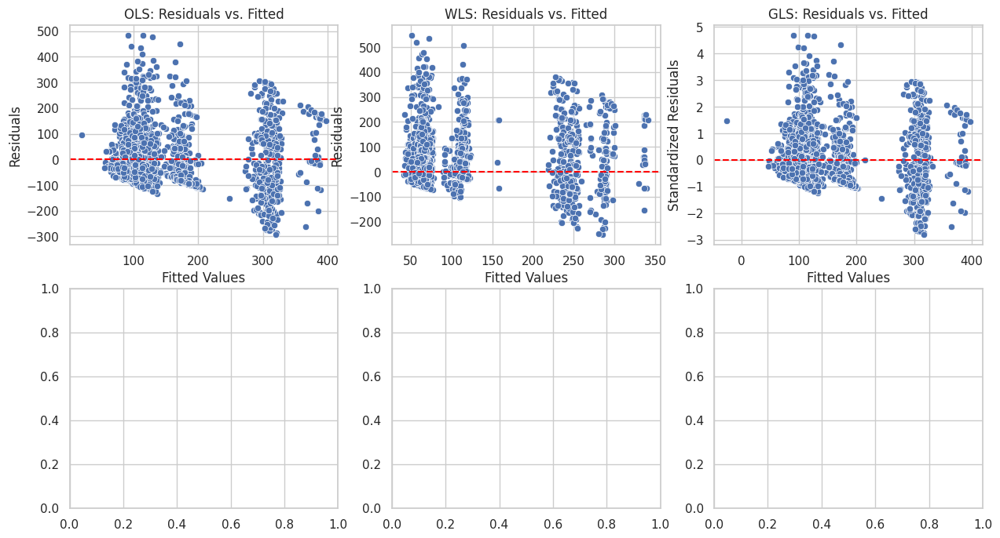

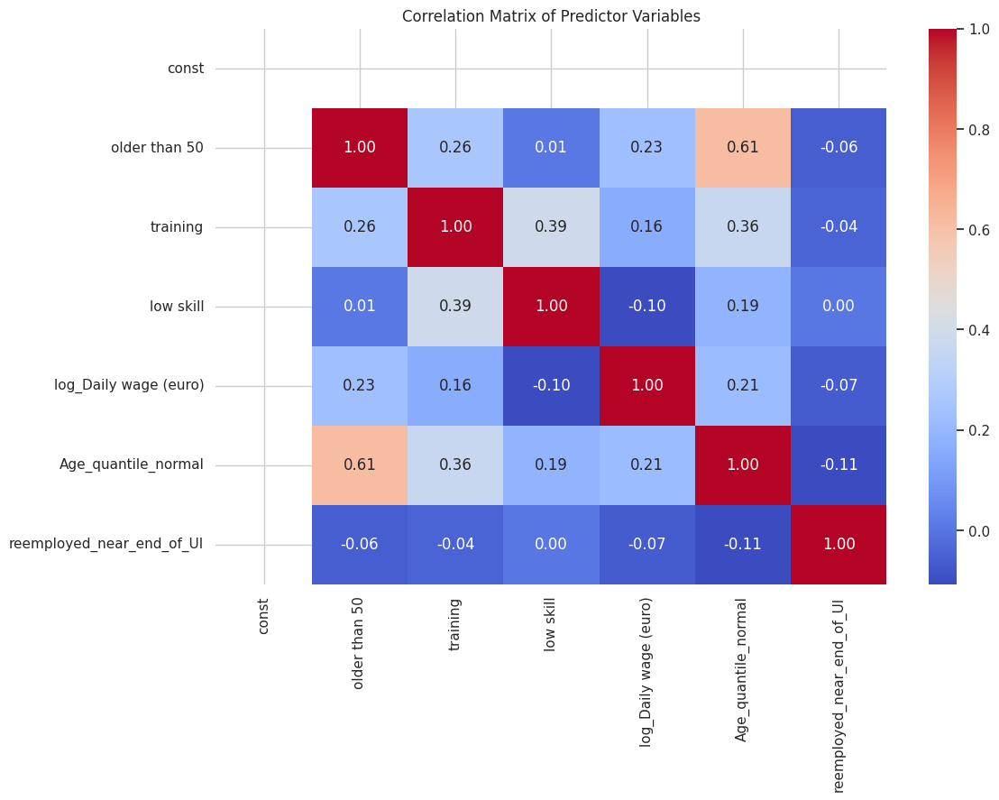


Variance Inflation Factors (VIF):
                    Variable        VIF
0                      const  50.084901
1              older than 50   1.673741
2                   training   1.357727
3                  low skill   1.256607
4      log_Daily wage (euro)   1.108878
5        Age_quantile_normal   1.790938
6  reemployed_near_end_of_UI   1.014298

poly OLS Model Summary:
                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.374
Model:                                 OLS   Adj. R-squared:                  0.372
Method:                      Least Squares   F-statistic:                     161.8
Date:                     Sat, 11 May 2024   Prob (F-statistic):          5.54e-214
Time:                             14:45:04   Log-Likelihood:                -13164.
No. Observations:                     2173   AIC:                         2.635e+04
Df Residuals:                   

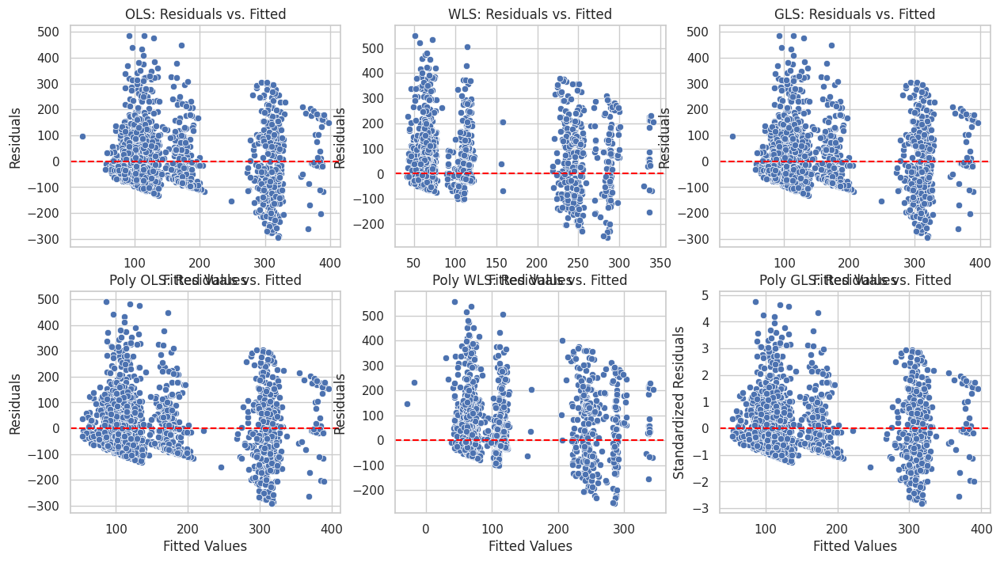

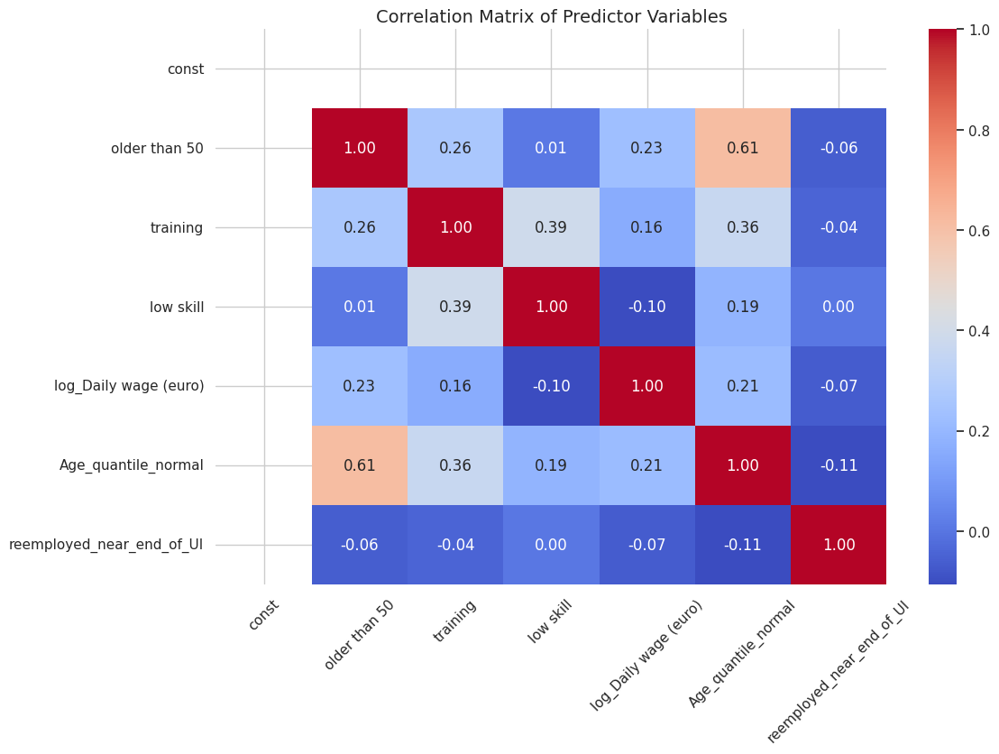

<Figure size 640x480 with 0 Axes>

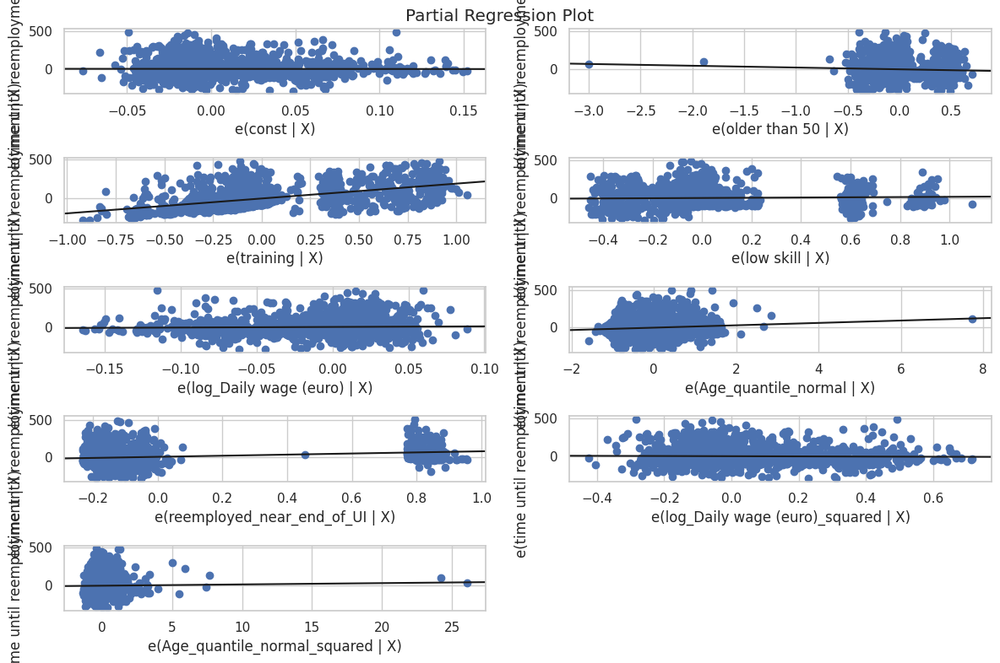

In [ ]:
data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.regression.linear_model import WLS
from sklearn.preprocessing import QuantileTransformer
from scipy.stats import boxcox
from scipy.special import boxcox1p # This handles adding 1 and applying Box-Cox in one step
from scipy.stats.mstats import winsorize

# Attempt a Box-Cox transformation on 'total duration of UI benefits'
#Add 1 to shift all values positive if necessary (Box-Cox requires all positive values)
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])
from statsmodels.regression.linear_model import WLS

# Example: Weighting by inverse of the variance estimated from 'UI_quantile_normal'
#weights = 1 / data['total duration of UI benefits']**2
#model_wls = WLS(y, X, weights=weights).fit()

# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily wage (euro)'] = np.log1p(data['Daily wage (euro)'])  # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2
# Apply a square root transformation to 'Age' to check for improvements
data['sqrt_age'] = np.sqrt(data['Age'])
# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

from sklearn.preprocessing import QuantileTransformer
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt.fit_transform(data[['Age']])

from scipy.stats.mstats import winsorize
# Winsorize at 5% and 95% quantiles
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

 # Create a boolean variable for re-employment within 10 days of UI benefits
reemployed_near_end = (  (data['time until reemployment'] >= 0) &  # Ensure re-employment time is non-negative
    (data['total duration of UI benefits'] >= 0) & # Ensure UI benefits duration is non-negative
    (data['time until reemployment'] >= data['total duration of UI benefits'] - 10) &
    (data['time until reemployment'] <= data['total duration of UI benefits']))
    # Convert the boolean variable to integer (1 for True, 0 for False)
data['reemployed_near_end_of_UI'] = reemployed_near_end.astype(int)
#filtered_data = data[(data['Age'] >= 25) | (data['low skill'] == 1)]

#Log Transformations on Daily wage (euro), time until reemployment, and Age:
# Create a dictionary mapping variable names to column names
log_var_map = {
    'Daily wage (euro)': 'log_Daily wage (euro)',
    'time until reemployment': 'log_time_until_reemployment',
    'Age': 'log_age'
}

 # Define independent variables (ALL - including interactions)
X = data[['older than 50', 'training', 'low skill',
                   'log_Daily wage (euro)', 'Age_quantile_normal',
                  'reemployed_near_end_of_UI']]

X = sm.add_constant(X)

# Define dependent variable
y = data['time until reemployment']

# Fit OLS model
model = sm.OLS(y, X).fit()

# Fit WLS model (using the same weights as before)
model_wls = sm.WLS(y, X, weights=weights).fit()

# Fit the GLS model. To start, assume a simple structure for the error covariance matrix
model_gls = sm.GLS(y, X).fit()

 #Print the OLS model summary
print("\nOLS Model Summary:")
print(model.summary())

# Print the WLS model summary
print("\nWLS Model Summary:")
print(model_wls.summary())

# Print the GLS model summary
print("\nGLS Model Summary:")
print(model_gls.summary())

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Visualization

fig, axes = plt.subplots(2, 3, figsize=(15, 8))  # 2 rows for all plots

# Weighted Least Squares (WLS) Residuals vs. Fitted
sns.scatterplot(x=model.fittedvalues, y=model.resid, ax=axes[0, 0])  # Plot in first row
axes[0, 0].set_title('OLS: Residuals vs. Fitted')
axes[0, 0].set_xlabel('Fitted Values')
axes[0, 0].set_ylabel('Residuals')
axes[0, 0].axhline(0, color='red', linestyle='dashed')

sns.scatterplot(x=model_wls.fittedvalues, y=model_wls.resid, ax=axes[0, 1])  # Plot in first row
axes[0, 1].set_title('WLS: Residuals vs. Fitted')
axes[0, 1].set_xlabel('Fitted Values')
axes[0, 1].set_ylabel('Residuals')
axes[0, 1].axhline(0, color='red', linestyle='dashed')

# Residuals vs. Fitted for GLS model (Corrected)
sns.scatterplot(x=model_gls_fittedvalues, y=model_gls_norm_resid, ax=axes[0, 2])  # Plot in first row
axes[0, 2].set_title('GLS: Residuals vs. Fitted')
axes[0, 2].set_xlabel('Fitted Values')
axes[0, 2].set_ylabel('Standardized Residuals')
axes[0, 2].axhline(0, color='red', linestyle='dashed')

import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Correlation matrix (heatmap)
correlation_matrix = X.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Predictor Variables')
plt.show()

# Variance Inflation Factor (VIF)
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print("\nVariance Inflation Factors (VIF):")
print(vif_data)

 # Add squared terms for predictors
for predictor in [ 'log_Daily wage (euro)', 'Age_quantile_normal']:
    X[predictor + "_squared"] = X[predictor]**2

# Fit new models with polynomial terms
model_poly = sm.OLS(y, X).fit()
model_poly_WLS = sm.WLS(y, X, weights=weights).fit()
model_poly_GLS = sm.GLS(y, X).fit()

# Print the model summaries
print("\npoly OLS Model Summary:")
print(model_poly.summary())
print("\npoly WLS Model Summary:")
print(model_poly_WLS.summary())
print("\npoly GLS Model Summary:")
print(model_poly_GLS.summary())

# Visualization
fig, axes = plt.subplots(2, 3, figsize=(15, 8))  # 2 rows for all plots

# Residuals vs. Fitted Plots (including new models)
model_list = [model, model_wls, model_gls, model_poly, model_poly_WLS, model_poly_GLS]
model_names = ['OLS', 'WLS', 'GLS', 'Poly OLS', 'Poly WLS', 'Poly GLS']

for i, (model_obj, model_name) in enumerate(zip(model_list, model_names)):

    # Calculate standardized residuals for GLS model
    if model_name == 'Poly GLS':
        resid = model_obj.resid
        scale = np.sqrt(model_obj.scale)
        leverage = np.diag(np.dot(np.dot(X, np.linalg.pinv(np.dot(X.T, X))), X.T))
        norm_resid = resid / scale / np.sqrt(1 - leverage)

        sns.scatterplot(x=model_obj.fittedvalues, y=norm_resid, ax=axes[i // 3, i % 3])
        axes[i // 3, i % 3].set_ylabel('Standardized Residuals')
    else:
        sns.scatterplot(x=model_obj.fittedvalues, y=model_obj.resid, ax=axes[i // 3, i % 3])
        axes[i // 3, i % 3].set_ylabel('Residuals')

    axes[i // 3, i % 3].set_title(f'{model_name}: Residuals vs. Fitted')
    axes[i // 3, i % 3].set_xlabel('Fitted Values')
    axes[i // 3, i % 3].axhline(0, color='red', linestyle='dashed')

# Correlation Matrix (Heatmap) - separate and larger
plt.figure(figsize=(12, 8))  # Create a new figure for the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Predictor Variables', fontsize=14)  # Adjust fontsize for clarity
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
plt.yticks(rotation=0)   # Optionally rotate y-axis labels if needed
plt.show()

plt.tight_layout()
plt.show()

from statsmodels.graphics.regressionplots import plot_partregress_grid

fig = plt.figure(figsize=(12, 8))
plot_partregress_grid(model_poly, fig=fig)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.regression.linear_model import WLS
from sklearn.preprocessing import QuantileTransformer
from scipy.stats import boxcox
from scipy.special import boxcox1p # This handles adding 1 and applying Box-Cox in one step
from scipy.stats.mstats import winsorize


data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


# Attempt a Box-Cox transformation on 'total duration of UI benefits'
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)

# Apply QuantileTransformer to 'total duration of UI benefits'
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])


# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily_wage'] = np.log1p(data['Daily wage (euro)']) # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2

# Square root transformation for 'Age'
data['sqrt_age'] = np.sqrt(data['Age'])

# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

# Apply QuantileTransformer to 'Age'
qt_age = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt_age.fit_transform(data[['Age']])

# Winsorize 'Daily wage (euro)'
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

# Create interaction terms
data['training_x_low_skill'] = data['training'] * data['low skill']
data['Male_x_low_skill'] = data['Male'] * data['low skill']
data['Male_x_training'] = data['Male'] * data['training']

# Create a boolean variable for re-employment within 10 days of UI benefits
reemployed_near_end = (
    (data['time until reemployment'] >= 0) &
    (data['total duration of UI benefits'] >= 0) &
    (data['time until reemployment'] >= data['total duration of UI benefits'] - 10) &
    (data['time until reemployment'] <= data['total duration of UI benefits'])
).astype(int)
data['reemployed_near_end_of_UI'] = reemployed_near_end

X = data[['Age', 'older than 50', 'training', 'low skill',
                            'log_Daily_wage', 'Age_quantile_normal',
                           'reemployed_near_end_of_UI']]  # Removed the spaces in 'log_Daily wage (euro)'
X = sm.add_constant(X)

# Define dependent variable
y = data['time until reemployment']


# Fit OLS model
model = sm.OLS(y, X).fit()
print("\nOLS Model Summary:")
print(model.summary())
# Example: Weighting by inverse of the variance estimated from 'UI_quantile_normal'
weights = 1 / data['total duration of UI benefits']**2
model_wls = WLS(y, X, weights=weights).fit()

# Print the WLS model summary
print("\nWLS Model Summary:")
print(model_wls.summary())

# Fit the GLS model. To start, assume a simple structure for the error covariance matrix
model_gls = sm.GLS(y, X).fit()
# Print the GLS model summary
print("\nGLS Model Summary:")
print(model_gls.summary())

# Calculate standardized residuals for easier interpretation
model_norm_resid = model.get_influence().resid_studentized_internal

# Function to plot residuals against a given predictor
def plot_residuals_vs_predictor(data, model, predictor, ax):
    sns.scatterplot(x=data[predictor], y=model_norm_resid, ax=ax)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Standardized Residuals')

# Add squared terms for predictors (make sure this happens before model fitting and residual plotting)
for predictor in ['Age', 'log_Daily_wage', 'Age_quantile_normal']:
    X[predictor + "_squared"] = X[predictor]**2

# Fit a new OLS model with the added polynomial terms
model_poly = sm.OLS(y, X).fit()
print("\npoly OLS Model Summary:")
print(model_poly.summary()) # Use the correct model name here

# Create the array for prediction, matching the structure of X used in model_poly (with all the squared terms)
x_values = np.linspace(data['Age'].min(), data['Age'].max(), 100)
X_pred = pd.DataFrame({'Age': x_values})
for predictor in ['Age', 'log_Daily_wage', 'Age_quantile_normal']:
    X_pred[predictor + "_squared"] = X_pred[predictor]**2
X_pred = sm.add_constant(X_pred)  # Add the constant term

# Predict based on the new X_pred DataFrame
y_pred = model_poly.predict(X_pred)
# Create subplots for each predictor (except the constant term)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 12))
fig.suptitle('Residual Plots vs. Predictors', fontsize=16)

for i, predictor in enumerate(X.columns[1:]):  # Skip the constant term
    row = i // 3
    col = i % 3
    plot_residuals_vs_predictor(data, model_poly, predictor, axes[row, col])  # Use the model with squared terms

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



Lambda for Box-Cox Transformation: -0.2287934593683001

OLS Model Summary:
                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.374
Model:                                 OLS   Adj. R-squared:                  0.372
Method:                      Least Squares   F-statistic:                     185.2
Date:                     Sat, 11 May 2024   Prob (F-statistic):          2.67e-215
Time:                             14:50:53   Log-Likelihood:                -13164.
No. Observations:                     2173   AIC:                         2.634e+04
Df Residuals:                         2165   BIC:                         2.639e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                coef    std err          t      P>|t|      [0.025    

KeyError: 'log_Daily_wage'

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.regression.linear_model import WLS
from sklearn.preprocessing import QuantileTransformer
from scipy.stats import boxcox
from scipy.special import boxcox1p
from scipy.stats.mstats import winsorize


data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


# Attempt a Box-Cox transformation on 'total duration of UI benefits'
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)

# Apply QuantileTransformer to 'total duration of UI benefits'
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])


# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily wage (euro)'] = np.log1p(data['Daily wage (euro)']) # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2

# Square root transformation for 'Age'
data['sqrt_age'] = np.sqrt(data['Age'])

# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

# Apply QuantileTransformer to 'Age'
qt_age = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt_age.fit_transform(data[['Age']])

# Winsorize 'Daily wage (euro)'
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

# Create interaction terms
data['training_x_low_skill'] = data['training'] * data['low skill']
data['Male_x_low_skill'] = data['Male'] * data['low skill']
data['Male_x_training'] = data['Male'] * data['training']

# Create a boolean variable for re-employment within 10 days of UI benefits
reemployed_near_end = (
    (data['time until reemployment'] >= 0) &
    (data['total duration of UI benefits'] >= 0) &
    (data['time until reemployment'] >= data['total duration of UI benefits'] - 10) &
    (data['time until reemployment'] <= data['total duration of UI benefits'])
).astype(int)
data['reemployed_near_end_of_UI'] = reemployed_near_end


# Define independent variables and create a copy
X = data[['Age', 'older than 50', 'training', 'low skill',
          'log_Daily wage (euro)', 'Age_quantile_normal',
          'reemployed_near_end_of_UI']].copy()

# Add squared terms and interactions to X
for predictor in ['Age', 'log_Daily wage (euro)', 'Age_quantile_normal']:
    X[predictor + "_squared"] = X[predictor]**2

# Create array for predictions
x_values = np.linspace(data['Age'].min(), data['Age'].max(), 100)
X_pred = pd.DataFrame({'Age': x_values})
# Add squared terms and interactions to X_pred at the same time they are added to X
for predictor in ['Age', 'log_Daily wage (euro)', 'Age_quantile_normal']:
    X_pred[predictor + "_squared"] = X_pred[predictor]**2

# Adding other columns in X to X_pred (with default value 0)
for col in X.columns:
    if col not in X_pred.columns:
        X_pred[col] = 0

X = sm.add_constant(X) # Add constant term


# Define dependent variable
y = data['time until reemployment']

# Fit all models after X has been fully prepared
model = sm.OLS(y, X).fit()
weights = 1 / data['total duration of UI benefits']**2
model_wls = WLS(y, X, weights=weights).fit()
model_gls = sm.GLS(y, X).fit()
model_poly = sm.OLS(y, X).fit()
model_poly_wls = WLS(y, X, weights=weights).fit()
model_poly_gls = sm.GLS(y, X).fit()

# Print the model summaries
print("\nOLS Model Summary:")
print(model.summary())
print("\nWLS Model Summary:")
print(model_wls.summary())
print("\nGLS Model Summary:")
print(model_gls.summary())

# Now you can predict
y_pred = model_poly.predict(X_pred)
# Calculate standardized residuals for easier interpretation
model_norm_resid = model.get_influence().resid_studentized_internal
# Calculate standardized residuals for easier interpretation
model_poly_norm_resid = model_poly.get_influence().resid_studentized_internal
# Calculate standardized residuals for WLS
model_wls_resid = model_wls.resid
model_wls_scale = np.sqrt(model_wls.scale)  # Estimate of residual standard deviation
#  Calculate leverage for WLS (adapted for weighted data)
X_wls = X.to_numpy()  # Convert X_wls to a NumPy array
sqrt_weights = np.sqrt(weights.to_numpy())  # Convert weights to a NumPy array and get the square root
model_wls_leverage = np.diag(np.dot(np.dot(X_wls * sqrt_weights[:, np.newaxis], np.linalg.pinv(np.dot(X_wls.T, X_wls * sqrt_weights[:, np.newaxis]))), (X_wls * sqrt_weights[:, np.newaxis]).T))
model_wls_norm_resid = model_wls_resid / model_wls_scale / np.sqrt(1 - model_wls_leverage)


# Function to plot residuals against a given predictor
def plot_residuals_vs_predictor(data, model, predictor, ax):
    sns.scatterplot(x=data[predictor], y=model_norm_resid, ax=ax)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Standardized Residuals')

# Poly OLS model (fitted later for better residuals plot)
model_poly = sm.OLS(y, X).fit()

# Add Poly WLS and Poly GLS models
model_poly_WLS = WLS(y, X, weights=weights).fit()
model_poly_GLS = sm.GLS(y, X).fit()

# Create the array for prediction, matching the structure of X used in model_poly
x_values = np.linspace(data['Age'].min(), data['Age'].max(), 100)
# Creating a DataFrame with all the predictors (including squared terms and interactions)
X_pred = pd.DataFrame({'Age': x_values})
for predictor in ['Age', 'log_Daily wage (euro)', 'Age_quantile_normal']:
    X_pred[predictor + "_squared"] = X_pred[predictor]**2
# Adding other columns in X to X_pred
for col in X.columns:
  if col not in X_pred.columns:
    X_pred[col] = 0 # Assuming 0 as default for other columns, as it is not used in the prediction


# Predict based on the new X_pred DataFrame
y_pred = model_poly.predict(X_pred)
# Enhanced Residuals vs. Predictor Plots
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 12))
fig.suptitle('Residual Plots vs. Predictors (Poly OLS)', fontsize=16)

for i, predictor in enumerate(X.columns[1:]):  # Skip the constant term
    plot_residuals_vs_predictor(data, model_poly, predictor, axes[i // 3, i % 3])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Residuals vs. Fitted Plots (including new models)
model_list = [model, model_wls, model_gls, model_poly, model_poly_WLS, model_poly_GLS]
model_names = ['OLS', 'WLS', 'GLS', 'Poly OLS', 'Poly WLS', 'Poly GLS']

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle('Residuals vs. Fitted Values', fontsize=16)

for i, (model_obj, model_name) in enumerate(zip(model_list, model_names)):
    # Calculate standardized residuals, handling GLS separately
    if model_name == 'GLS':
        resid = model_obj.resid
        scale = np.sqrt(model_obj.scale)
        leverage = np.diag(np.dot(np.dot(X, np.linalg.pinv(np.dot(X.T, X))), X.T))
        norm_resid = resid / scale / np.sqrt(1 - leverage)
    else:
        norm_resid = model_obj.get_influence().resid_studentized_internal

    sns.scatterplot(x=model_obj.fittedvalues, y=norm_resid, ax=axes[i // 3, i % 3])
    axes[i // 3, i % 3].axhline(0, color='red', linestyle='dashed')
    axes[i // 3, i % 3].set_title(f'{model_name} Model')
    axes[i // 3, i % 3].set_xlabel('Fitted Values')
    axes[i // 3, i % 3].set_ylabel('Standardized Residuals')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


Lambda for Box-Cox Transformation: -0.2287934593683001


KeyError: 'log_Daily wage (euro)'

Lambda for Box-Cox Transformation: -0.2287934593683001

OLS Model Summary:
                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.482
Model:                                 OLS   Adj. R-squared:                  0.477
Method:                      Least Squares   F-statistic:                     105.4
Date:                     Sun, 12 May 2024   Prob (F-statistic):          3.98e-290
Time:                             04:17:28   Log-Likelihood:                -12959.
No. Observations:                     2173   AIC:                         2.596e+04
Df Residuals:                         2153   BIC:                         2.607e+04
Df Model:                               19                                         
Covariance Type:                 nonrobust                                         
                                                      coef    std err          t     

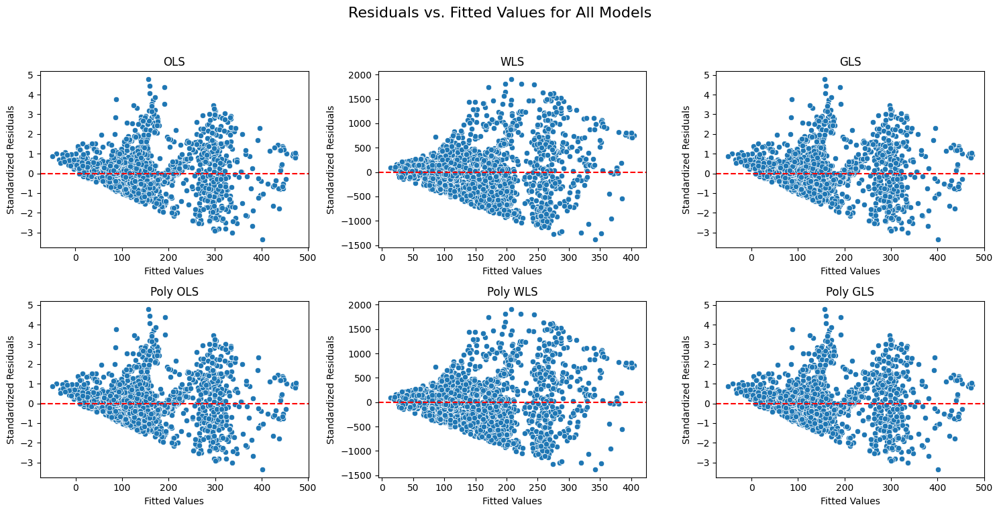

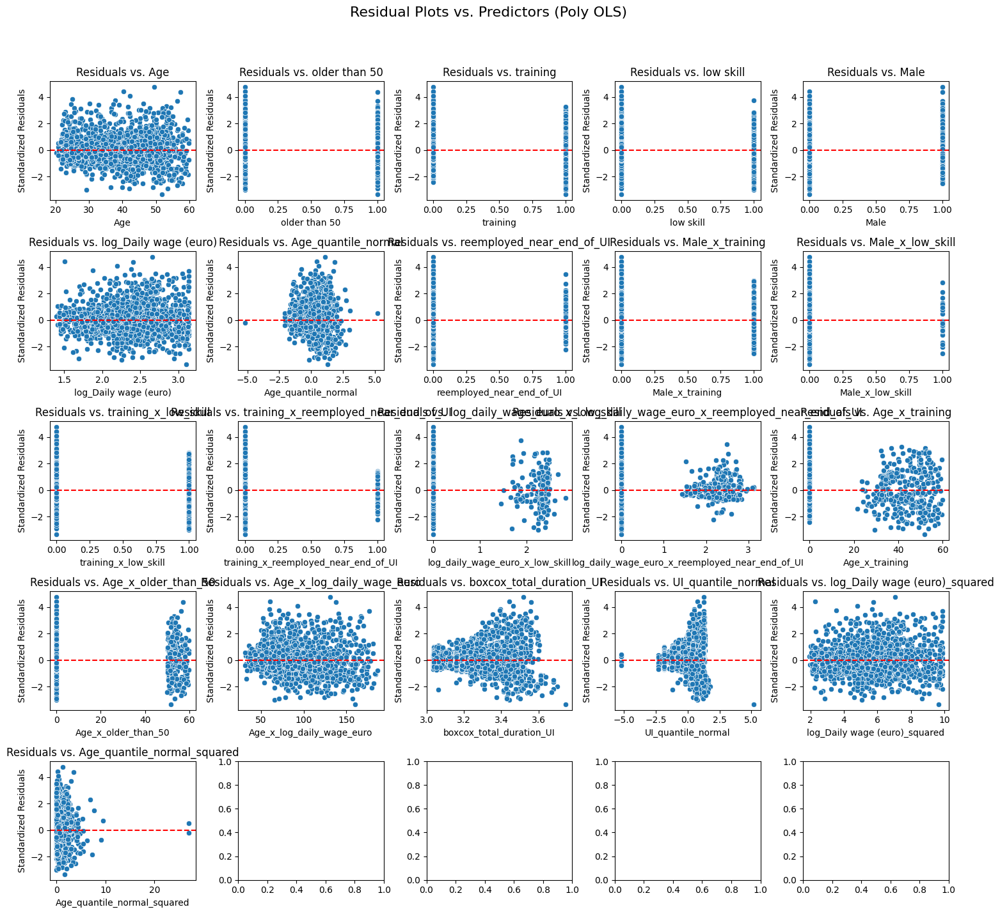

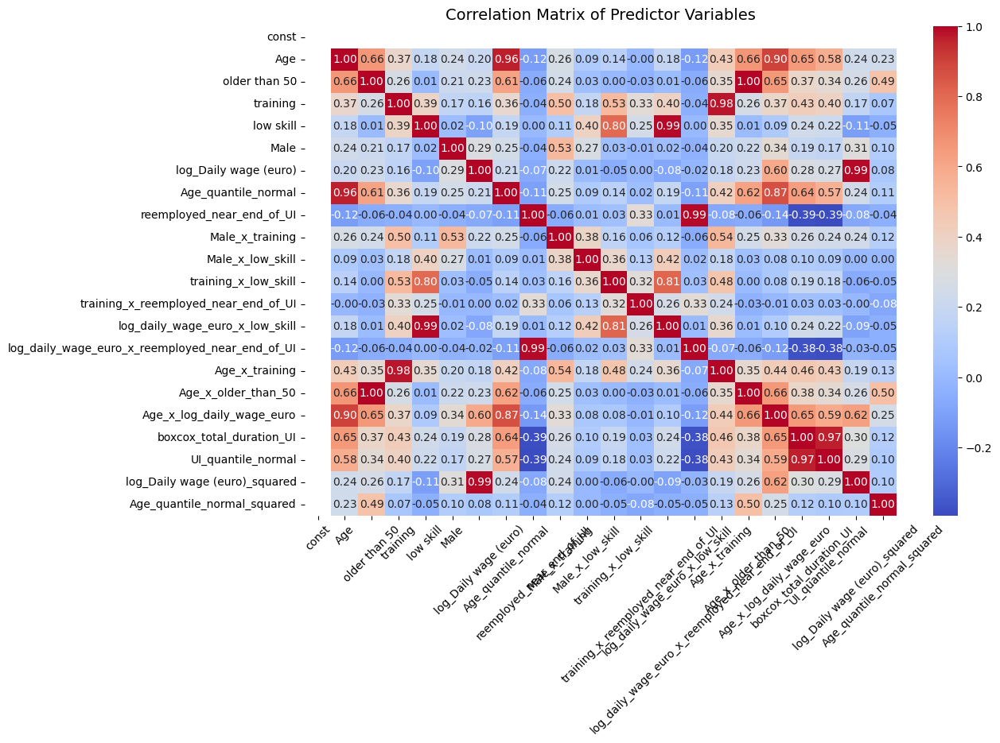

<Figure size 640x480 with 0 Axes>

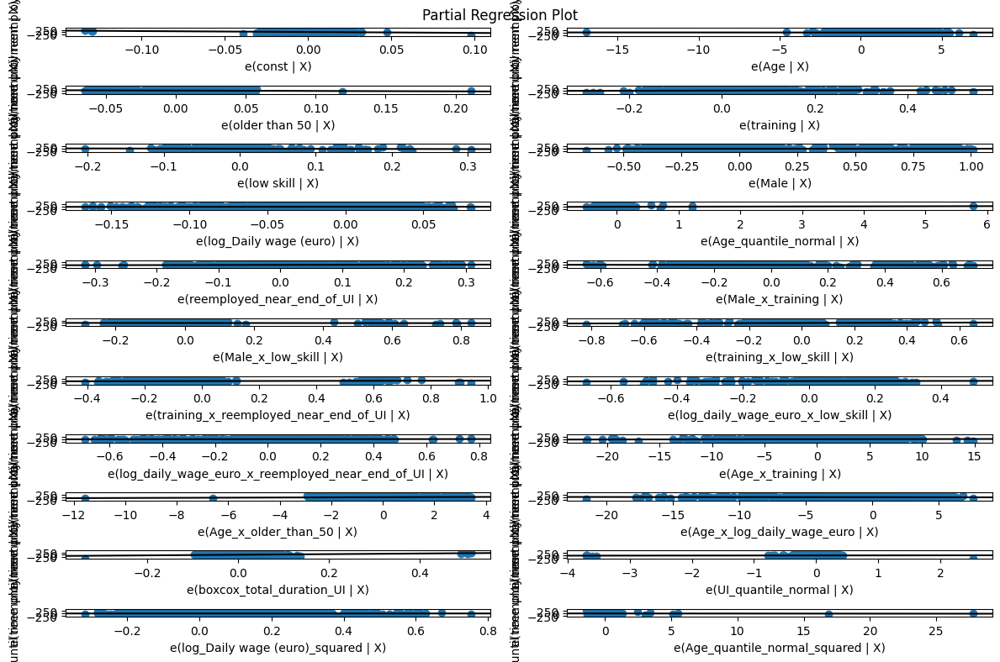

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.regression.linear_model import WLS
from sklearn.preprocessing import QuantileTransformer
from scipy.stats import boxcox
from scipy.special import boxcox1p
from scipy.stats.mstats import winsorize
import pandas as pd
from scipy import stats
import numpy as np

data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


# Attempt a Box-Cox transformation on 'total duration of UI benefits'
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)

# Apply QuantileTransformer to 'total duration of UI benefits'
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])


# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily wage (euro)'] = np.log1p(data['Daily wage (euro)']) # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2

# Square root transformation for 'Age'
data['sqrt_age'] = np.sqrt(data['Age'])

# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

# Apply QuantileTransformer to 'Age'
qt_age = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt_age.fit_transform(data[['Age']])

# Winsorize 'Daily wage (euro)'
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

# Create interaction terms
data['training_x_low_skill'] = data['training'] * data['low skill']
data['Male_x_low_skill'] = data['Male'] * data['low skill']
data['Male_x_training'] = data['Male'] * data['training']

data['log_daily_wage_euro_x_low_skill'] = data['log_Daily wage (euro)'] * data['low skill']

# Interactions with Age:
data['Age_x_training'] = data['Age'] * data['training']
data['Age_x_older_than_50'] = data['Age'] * data['older than 50']
data['Age_x_log_daily_wage_euro'] = data['Age'] * data['log_Daily wage (euro)']

# Create a boolean variable for re-employment within 10 days of UI benefits
reemployed_near_end = (
    (data['time until reemployment'] >= 0) &
    (data['total duration of UI benefits'] >= 0) &
    (data['time until reemployment'] >= data['total duration of UI benefits'] - 10) &
    (data['time until reemployment'] <= data['total duration of UI benefits'])
).astype(int)
data['reemployed_near_end_of_UI'] = reemployed_near_end
data['training_x_reemployed_near_end_of_UI'] = data['training'] * data['reemployed_near_end_of_UI']
data['log_daily_wage_euro_x_reemployed_near_end_of_UI'] = data['log_Daily wage (euro)'] * data['reemployed_near_end_of_UI']

# 1. Initial Models (OLS, WLS, GLS)
#X = data[['Age', 'older than 50', 'training', 'low skill',
 #        'log_Daily wage (euro)', 'Age_quantile_normal',
  #       'reemployed_near_end_of_UI']]
X = data[['Age', 'older than 50', 'training', 'low skill', 'Male',
              'log_Daily wage (euro)', # Using log-transformed daily wage
              'Age_quantile_normal', 'reemployed_near_end_of_UI',
              'Male_x_training', 'Male_x_low_skill', 'training_x_low_skill',
              'training_x_reemployed_near_end_of_UI',
              'log_daily_wage_euro_x_low_skill', 'log_daily_wage_euro_x_reemployed_near_end_of_UI',
              'Age_x_training', 'Age_x_older_than_50', 'Age_x_log_daily_wage_euro',
              'boxcox_total_duration_UI', 'UI_quantile_normal']]
X = sm.add_constant(X)
y = data['time until reemployment']
weights = 1 / data['total duration of UI benefits']**2

model_ols = sm.OLS(y, X).fit()
model_wls = WLS(y, X, weights=weights).fit()
model_gls = sm.GLS(y, X).fit()

# Print summaries for initial models
print("\nOLS Model Summary:")
print(model_ols.summary())
print("\nWLS Model Summary:")
print(model_wls.summary())
print("\nGLS Model Summary:")
print(model_gls.summary())

# 2. Add Squared Terms
for predictor in [ 'log_Daily wage (euro)', 'Age_quantile_normal']:
    X[predictor + "_squared"] = X[predictor]**2
    data[predictor + "_squared"] = data[predictor]**2

# 3. Polynomial Models (OLS_Poly, WLS_Poly, GLS_Poly)
model_poly_ols = sm.OLS(y, X).fit()
model_poly_wls = WLS(y, X, weights=weights).fit()
model_poly_gls = sm.GLS(y, X).fit()

# Print summaries for polynomial models
print("\nPoly OLS Model Summary:")
print(model_poly_ols.summary())
print("\nPoly WLS Model Summary:")
print(model_poly_wls.summary())
print("\nPoly GLS Model Summary:")
print(model_poly_gls.summary())

# 4. Residuals vs. Fitted Plots (All Models)
models = {
    'OLS': model_ols, 'WLS': model_wls, 'GLS': model_gls,
    'Poly OLS': model_poly_ols, 'Poly WLS': model_poly_wls, 'Poly GLS': model_poly_gls
}

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle('Residuals vs. Fitted Values for All Models', fontsize=16)

for i, (model_name, model) in enumerate(models.items()):
    # Calculate standardized residuals (handling all models)
    resid = model.resid
    scale = np.sqrt(model.scale) if not isinstance(model, sm.OLS) else model.mse_resid  # Adjust for OLS
    leverage = np.diag(np.dot(np.dot(X, np.linalg.pinv(np.dot(X.T, X))), X.T))
    norm_resid = resid / scale / np.sqrt(1 - leverage)

    sns.scatterplot(x=model.fittedvalues, y=norm_resid, ax=axes[i // 3, i % 3])
    axes[i // 3, i % 3].axhline(0, color='red', linestyle='dashed')
    axes[i // 3, i % 3].set_title(model_name)
    axes[i // 3, i % 3].set_xlabel('Fitted Values')
    axes[i // 3, i % 3].set_ylabel('Standardized Residuals')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



# 5. Residuals vs. Predictors (Poly OLS Only)
# Function to plot residuals against a given predictor
def plot_residuals_vs_predictor(data, model, predictor, ax):
    norm_resid = model.get_influence().resid_studentized_internal
    sns.scatterplot(x=data[predictor], y=norm_resid, ax=ax)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Standardized Residuals')
import math

num_predictors = len(X.columns) - 1  # Exclude the constant term
num_rows = math.ceil(num_predictors / 5)  # Round up to the nearest integer

fig, axes = plt.subplots(nrows=num_rows, ncols=5, figsize=(15, 3 * num_rows))
fig.suptitle('Residual Plots vs. Predictors (Poly OLS)', fontsize=16)

for i, predictor in enumerate(X.columns[1:]):  # Skip the constant term
    plot_residuals_vs_predictor(data, model_poly_ols, predictor, axes[i // 5, i % 5])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Correlation Matrix (Heatmap) - separate and larger
correlation_matrix = X.corr()  # Calculate the correlation matrix

plt.figure(figsize=(12, 8))  # Create a new figure for the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Predictor Variables', fontsize=14)  # Adjust fontsize for clarity
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
plt.yticks(rotation=0)   # Optionally rotate y-axis labels if needed
plt.show()

plt.tight_layout()
plt.show()

from statsmodels.graphics.regressionplots import plot_partregress_grid

fig = plt.figure(figsize=(12, 8))
plot_partregress_grid(model_poly_ols, fig=fig)
plt.show()


                       Robust linear Model Regression Results                      
Dep. Variable:     time_until_reemployment   No. Observations:                 2173
Model:                                 RLM   Df Residuals:                     2165
Method:                               IRLS   Df Model:                            7
Norm:                               HuberT                                         
Scale Est.:                            mad                                         
Cov Type:                               H1                                         
Date:                     Sun, 12 May 2024                                         
Time:                             04:18:11                                         
No. Iterations:                         15                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------

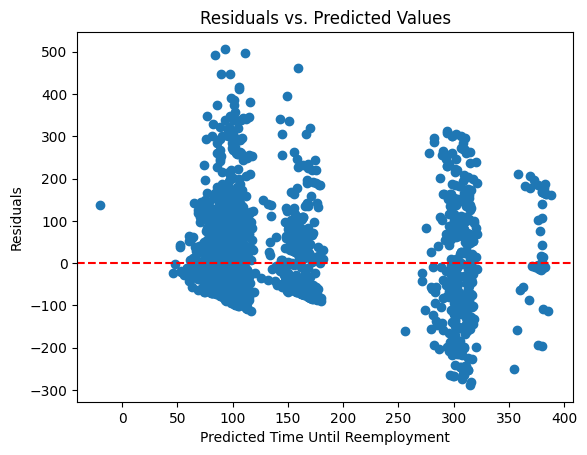

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import rlm
import numpy as np

# Rename columns with spaces to underscore
data = data.rename(columns={'Daily wage (euro)': 'Daily_wage_euro',
                            'time until reemployment' : 'time_until_reemployment',
                            'total duration of UI benefits': 'total_duration_UI_benefits'})

# Log transformation for 'Daily wage (euro)'
data['log_Daily_wage_euro'] = np.log1p(data['Daily_wage_euro'])

# Create the `reemployed_near_end_of_UI` variable:
data['reemployed_near_end_of_UI'] = (
    (data['time_until_reemployment'] >= 0) &
    (data['total_duration_UI_benefits'] >= 0) &
    (data['time_until_reemployment'] >= data['total_duration_UI_benefits'] - 10) &
    (data['time_until_reemployment'] <= data['total_duration_UI_benefits'])
).astype(int)


# Define your formula (same as for OLS, but using RLM function)
formula = 'time_until_reemployment ~ Age + Q("older than 50") + training + Q("low skill") + log_Daily_wage_euro + Age_quantile_normal + reemployed_near_end_of_UI'

# Fit the robust linear model (RLM)
model_robust = rlm(formula, data=data, M=sm.robust.norms.HuberT()).fit()

# Print summary
print(model_robust.summary())

# 3. Explained Variance
y_true = data['time_until_reemployment']
y_pred = model_robust.predict()
total_var = np.var(y_true)
resid_var = np.var(y_true - y_pred)
explained_var = 1 - (resid_var / total_var)
print(f'Explained Variance: {explained_var:.3f}')

# 4. Mean Squared Error (MSE)
mse = sm.tools.eval_measures.mse(y_true, y_pred)
print(f'Mean Squared Error (MSE): {mse:.3f}')

# 5. Prediction Accuracy (Example with Mean Absolute Error - MAE)
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
X_train, X_test, y_train, y_test = train_test_split(
    # Removing the Q() wrapper around column names
    data[['Age', 'older than 50', 'training', 'low skill',
        'log_Daily_wage_euro', 'Age_quantile_normal', 'reemployed_near_end_of_UI']],
    data['time_until_reemployment'], test_size=0.2, random_state=42
)
rlm_train_model = sm.RLM(y_train, X_train, M=sm.robust.norms.HuberT())
rlm_train_results = rlm_train_model.fit()
y_test_pred = rlm_train_results.predict(X_test)
mae = mean_absolute_error(y_test, y_test_pred)
print(f'Mean Absolute Error (MAE) on test set: {mae:.3f}')

residuals = y_true - y_pred
import matplotlib.pyplot as plt

plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='dashed')
plt.xlabel('Predicted Time Until Reemployment')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Values')
plt.show()

Lambda for Box-Cox Transformation: -0.2287934593683001
                      Generalized Linear Model Regression Results                      
Dep. Variable:     log_time_until_reemployment   No. Observations:                 2173
Model:                                     GLM   Df Residuals:                     2162
Model Family:                            Gamma   Df Model:                           10
Link Function:                             Log   Scale:                        0.041486
Method:                                   IRLS   Log-Likelihood:                -2963.8
Date:                         Sun, 12 May 2024   Deviance:                       94.534
Time:                                 04:29:35   Pearson chi2:                     89.7
No. Iterations:                             10   Pseudo R-squ. (CS):            0.03760
Covariance Type:                     nonrobust                                         
                                coef    std err          z      P

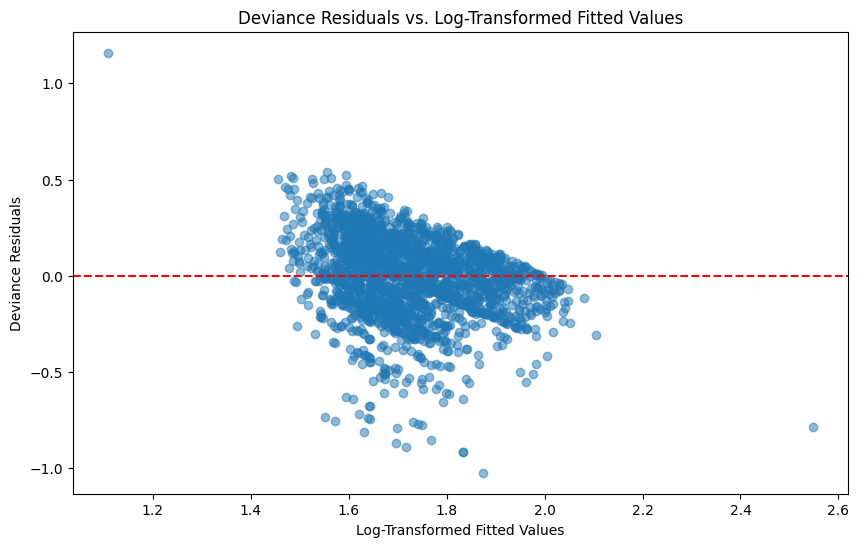

                      Generalized Linear Model Regression Results                      
Dep. Variable:     log_time_until_reemployment   No. Observations:                 2173
Model:                                     GLM   Df Residuals:                     2163
Model Family:                            Gamma   Df Model:                            9
Link Function:                             Log   Scale:                        0.030600
Method:                                   IRLS   Log-Likelihood:                -2695.6
Date:                         Sun, 12 May 2024   Deviance:                       73.669
Time:                                 04:29:36   Pearson chi2:                     66.2
No. Iterations:                              9   Pseudo R-squ. (CS):             0.3063
Covariance Type:                     nonrobust                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
--------------------------

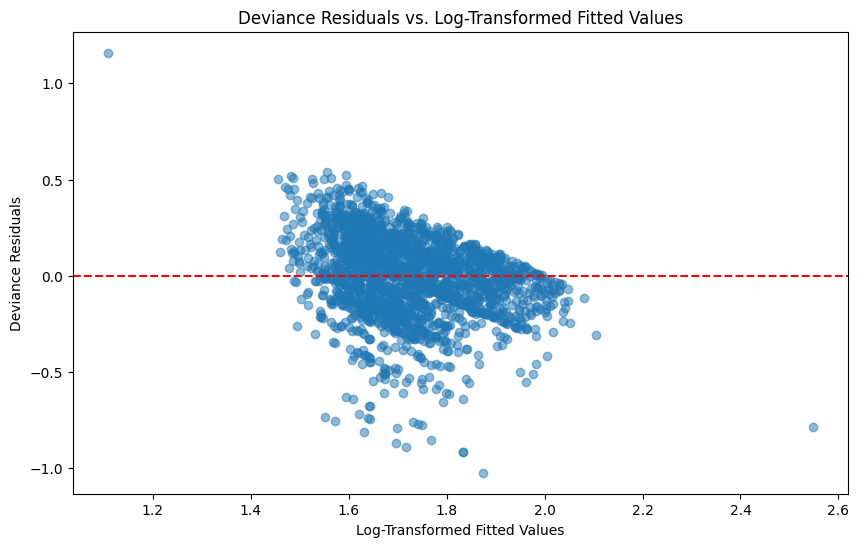

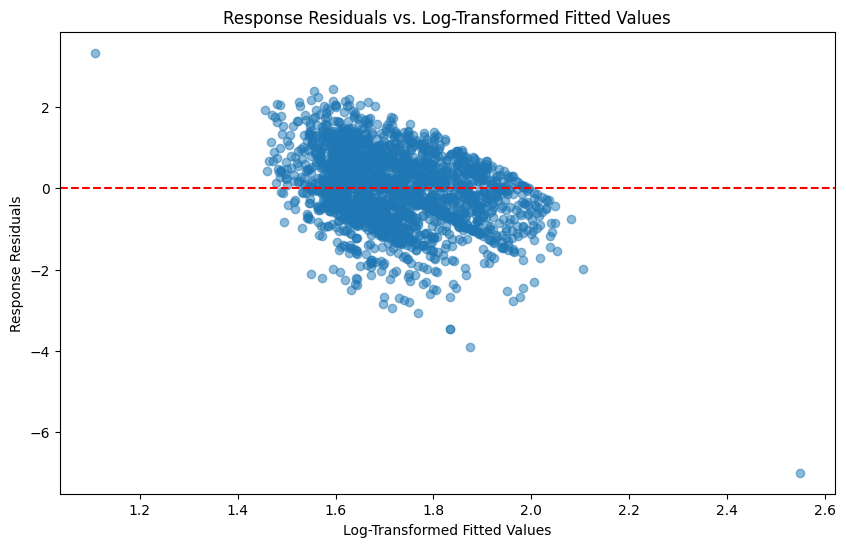

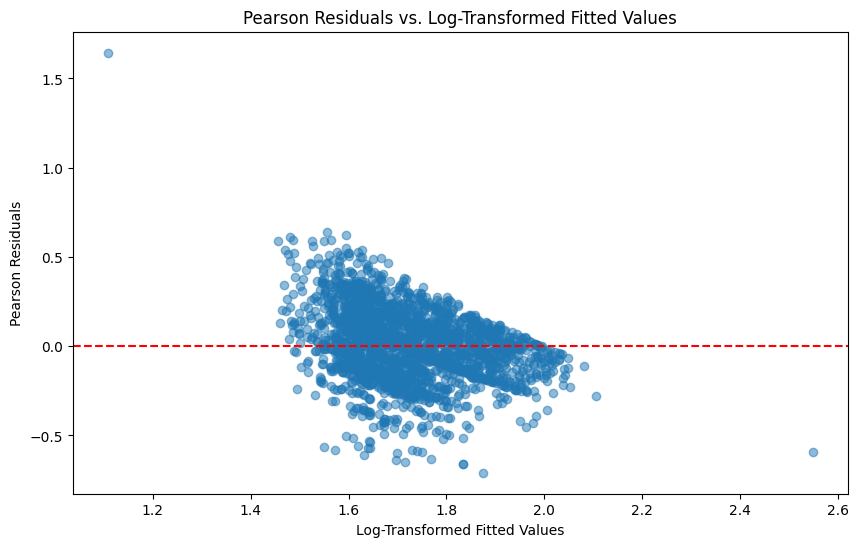

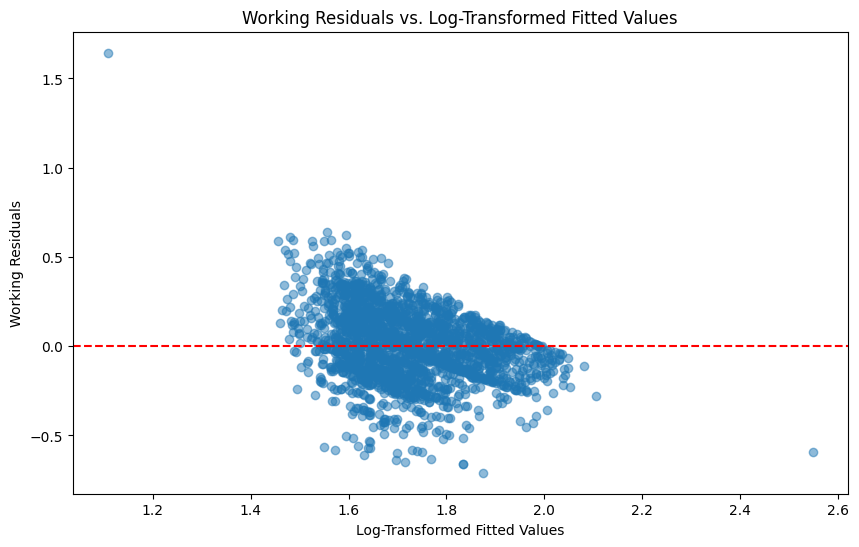

                      Generalized Linear Model Regression Results                      
Dep. Variable:     log_time_until_reemployment   No. Observations:                 2173
Model:                                     GLM   Df Residuals:                     2163
Model Family:                            Gamma   Df Model:                            9
Link Function:                             Log   Scale:                        0.030600
Method:                                   IRLS   Log-Likelihood:                -2695.6
Date:                         Sun, 12 May 2024   Deviance:                       73.669
Time:                                 04:29:38   Pearson chi2:                     66.2
No. Iterations:                              9   Pseudo R-squ. (CS):             0.3063
Covariance Type:                     nonrobust                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
--------------------------

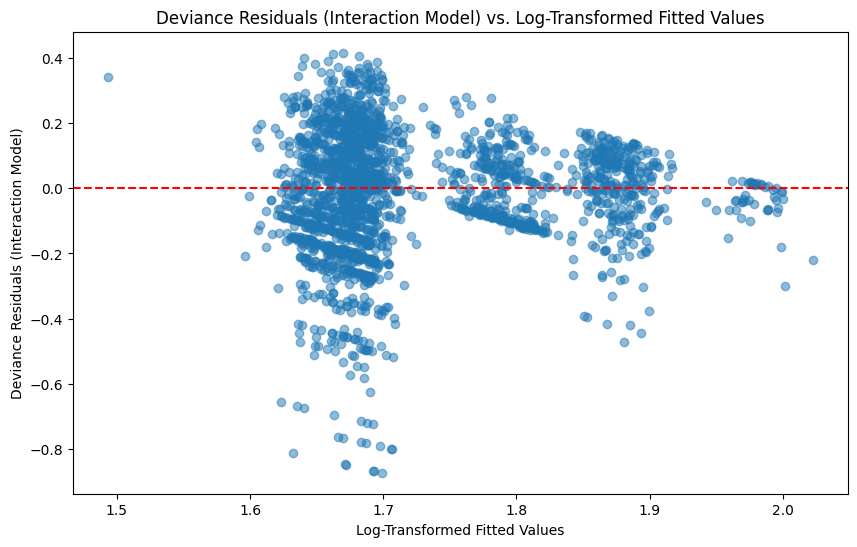

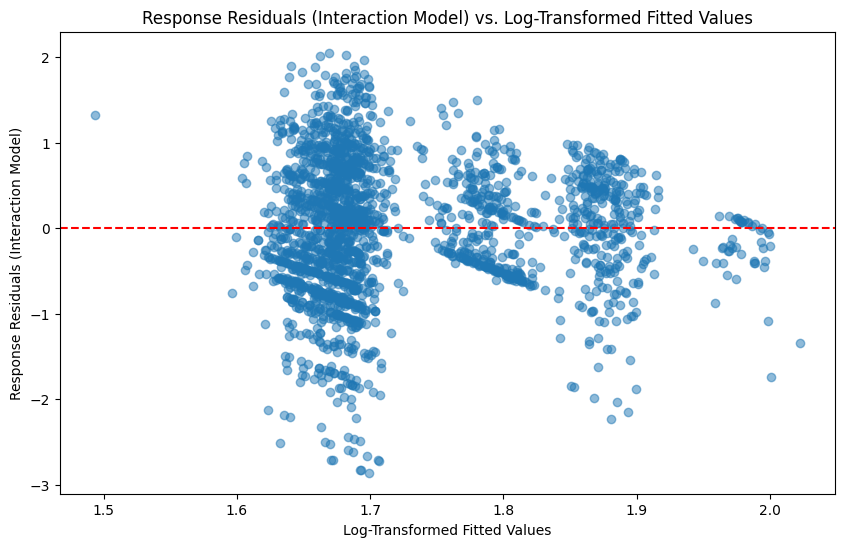

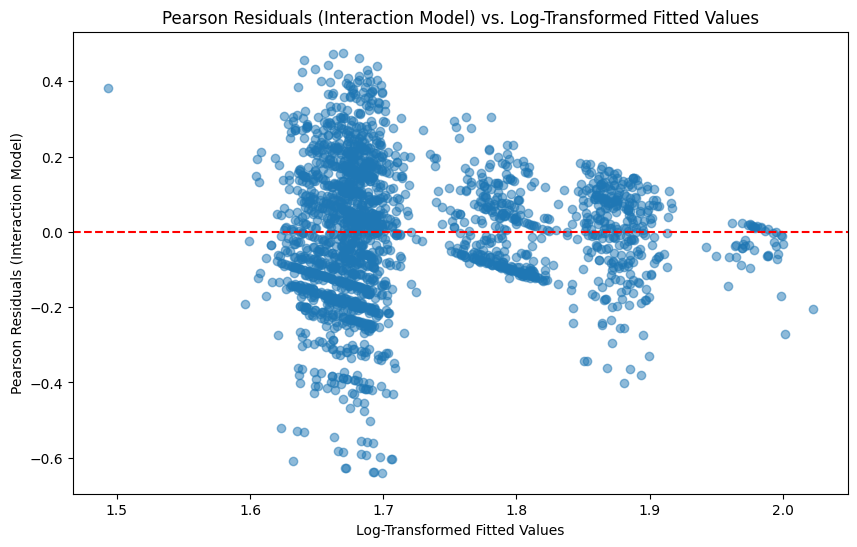

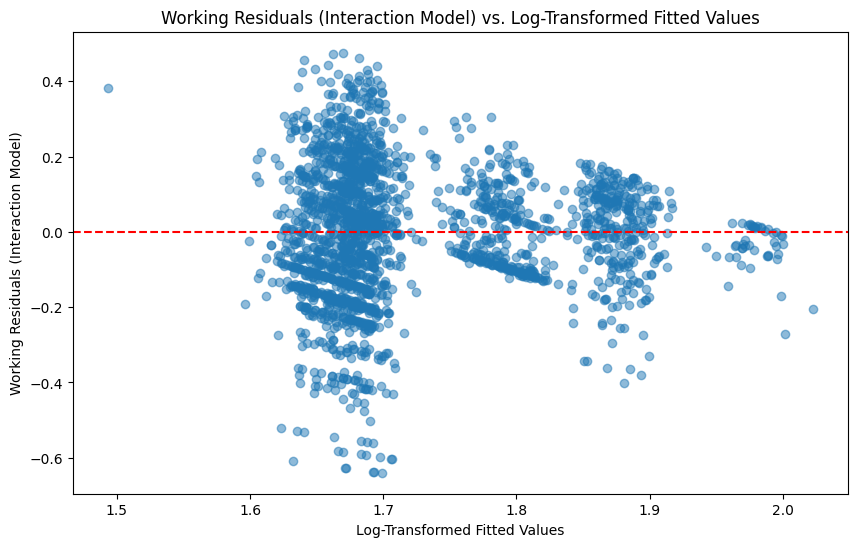

In [ ]:
import statsmodels.api as sm
from statsmodels.genmod.families import Gamma
from statsmodels.genmod.families.links import Log
import numpy as np
from scipy.stats import boxcox
from scipy.stats.mstats import winsorize  # Import winsorize from the correct location
import matplotlib.pyplot as plt


data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)


# Attempt a Box-Cox transformation on 'total duration of UI benefits'
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)

# Apply QuantileTransformer to 'total duration of UI benefits'
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])


# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily wage (euro)'] = np.log1p(data['Daily wage (euro)']) # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time until reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2

# Square root transformation for 'Age'
data['sqrt_age'] = np.sqrt(data['Age'])

# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

# Apply QuantileTransformer to 'Age'
qt_age = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt_age.fit_transform(data[['Age']])

# Winsorize 'Daily wage (euro)'
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

# Create interaction terms
data['training_x_low_skill'] = data['training'] * data['low skill']
data['Male_x_low_skill'] = data['Male'] * data['low skill']
data['Male_x_training'] = data['Male'] * data['training']



# Create a boolean variable for re-employment within 10 days of UI benefits
reemployed_near_end = (
    (data['time until reemployment'] >= 0) &
    (data['total duration of UI benefits'] >= 0) &
    (data['time until reemployment'] >= data['total duration of UI benefits'] - 10) &
    (data['time until reemployment'] <= data['total duration of UI benefits'])
).astype(int)
data['reemployed_near_end_of_UI'] = reemployed_near_end

# Transform the actual time to reemployment values using log (add 1 to avoid log(0))
log_y_true = np.log1p(y_true)

data = data.rename(columns={'log_Daily wage (euro)': 'log_daily_wage_euro'})

# Define a function to plot residuals
def plot_residuals(residuals, title, log_y_true):
    plt.figure(figsize=(10, 6))
    plt.scatter(log_fitted_values, residuals, alpha=0.5)
    plt.title(f"{title} vs. Log-Transformed Fitted Values")
    plt.xlabel("Log-Transformed Fitted Values")
    plt.ylabel(title)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.show()


# Fit the Gamma GLM (initial model)
gamma_model = sm.GLM(
    data['log_time_until_reemployment'],
    data[['Age', 'older than 50', 'training', 'low skill', 'Male', 'log_daily_wage_euro',
          'Age_quantile_normal', 'reemployed_near_end_of_UI', 'Male_x_training',
          'Male_x_low_skill', 'training_x_low_skill']],
    family=Gamma(link=Log())
).fit()
print(gamma_model.summary())

# Calculate and plot residuals for the initial model
fitted_values = gamma_model.fittedvalues  # Get fitted values here
log_fitted_values = np.log1p(fitted_values)
log_y_true = data['log_time_until_reemployment']

plot_residuals(gamma_model.resid_deviance, "Deviance Residuals", log_y_true)
# ... (plot other types of residuals similarly) ...

# Fit the Gamma GLM with an interaction term
formula_with_interaction = 'log_time_until_reemployment ~ Age + Q("older than 50") + training + Q("low skill") + Male + log_daily_wage_euro + Age_quantile_normal + reemployed_near_end_of_UI + Age:training'
gamma_model_interaction = sm.GLM.from_formula(
    formula_with_interaction,
    data=data,
    family=Gamma(link=Log())
).fit()
print(gamma_model_interaction.summary())

# Calculate and plot residuals for the initial model (same as before)
fitted_values = gamma_model.fittedvalues
log_fitted_values = np.log1p(fitted_values)
log_y_true = data['log_time_until_reemployment']

plot_residuals(gamma_model.resid_deviance, "Deviance Residuals", log_y_true)
plot_residuals(gamma_model.resid_response, "Response Residuals", log_y_true)
plot_residuals(gamma_model.resid_pearson, "Pearson Residuals", log_y_true)
plot_residuals(gamma_model.resid_working, "Working Residuals", log_y_true)

# Fit the Gamma GLM with an interaction term (same as before)
formula_with_interaction = 'log_time_until_reemployment ~ Age + Q("older than 50") + training + Q("low skill") + Male + log_daily_wage_euro + Age_quantile_normal + reemployed_near_end_of_UI + Age:training'
gamma_model_interaction = sm.GLM.from_formula(
    formula_with_interaction,
    data=data,
    family=Gamma(link=Log())
).fit()
print(gamma_model_interaction.summary())

# Calculate and plot residuals for the interaction model
fitted_values = gamma_model_interaction.fittedvalues
log_fitted_values = np.log1p(fitted_values)

# Residual plots for the interaction model
plot_residuals(gamma_model_interaction.resid_deviance, "Deviance Residuals (Interaction Model)", log_y_true)
plot_residuals(gamma_model_interaction.resid_response, "Response Residuals (Interaction Model)", log_y_true)
plot_residuals(gamma_model_interaction.resid_pearson, "Pearson Residuals (Interaction Model)", log_y_true)
plot_residuals(gamma_model_interaction.resid_working, "Working Residuals (Interaction Model)", log_y_true)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate various types of residuals
residuals_deviance = gamma_results.resid_deviance
residuals_response = gamma_results.resid_response
residuals_pearson = gamma_results.resid_pearson
residuals_working = gamma_results.resid_working

# Modify the plotting function to use the log-transformed true values (y_true)
def plot_residuals(residuals, title, x_values = log_y_true):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=x_values, y=residuals)
    plt.axhline(y=0, color='r', linestyle='dashed')
    plt.xlabel("Log-Transformed Time Until Reemployment (Actual)")  # Updated x-label
    plt.ylabel(title)
    plt.title(f"{title} vs. Log-Transformed Actual Values")  # Updated title
    plt.show()

# Plotting different types of residuals against log-transformed actual values
plot_residuals(residuals_deviance, "Deviance Residuals")
plot_residuals(residuals_response, "Response Residuals")
plot_residuals(residuals_pearson, "Pearson Residuals")
plot_residuals(residuals_working, "Working Residuals")

NameError: name 'gamma_results' is not defined

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.regression.linear_model import WLS
from statsmodels.regression.linear_model import GLS
from statsmodels.formula.api import ols as OLS
from sklearn.preprocessing import QuantileTransformer
from scipy.stats import boxcox
from scipy.special import boxcox1p
from scipy.stats.mstats import winsorize
import pandas as pd
from scipy import stats
import numpy as np
import math

data_path = '/content/Job Search data.csv'
data = pd.read_csv(data_path)

data = data.rename(columns={"time until reemployment": "time_until_reemployment"})
data = data.rename(columns={"low skill": "low_skill"})

# Attempt a Box-Cox transformation on 'total duration of UI benefits'
positive_shift = data['total duration of UI benefits'].min() + 1
data['total_duration_UI_shifted'] = data['total duration of UI benefits'] + positive_shift
fitted_data, fitted_lambda = boxcox(data['total_duration_UI_shifted'])
data['boxcox_total_duration_UI'] = fitted_data
# Print the lambda used for transformation
print('Lambda for Box-Cox Transformation:', fitted_lambda)

# Apply QuantileTransformer to 'total duration of UI benefits'
qt = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['UI_quantile_normal'] = qt.fit_transform(data[['total duration of UI benefits']])


# Log transformation for 'Daily wage (euro)' and 'Total Duration of UI Benefits'
data['log_Daily wage (euro)'] = np.log1p(data['Daily wage (euro)']) # log1p is used to handle zero wages smoothly
data['log_total duration of UI benefits'] = np.log1p(data['total duration of UI benefits'])

# Log transformation for 'Time Until Reemployment'
data['log_time_until_reemployment'] = np.log1p(data['time_until_reemployment'])

# Polynomial features for 'Age'
data['age_squared'] = data['Age'] ** 2

# Square root transformation for 'Age'
data['sqrt_age'] = np.sqrt(data['Age'])

# Log transformation for 'Age'
data['log_age'] = np.log1p(data['Age'])

# Apply QuantileTransformer to 'Age'
qt_age = QuantileTransformer(n_quantiles=10, output_distribution='normal', random_state=0)
data['Age_quantile_normal'] = qt_age.fit_transform(data[['Age']])

# Winsorize 'Daily wage (euro)'
data['transformed_wage'] = winsorize(data['Daily wage (euro)'], limits=[0.05, 0.05])

# Create interaction terms
data['training_x_low_skill'] = data['training'] * data['low_skill']
data['Male_x_low_skill'] = data['Male'] * data['low_skill']
data['Male_x_training'] = data['Male'] * data['training']

data['log_daily_wage_euro_x_low_skill'] = data['log_Daily wage (euro)'] * data['low_skill']

# Interactions with Age:
data['Age_x_training'] = data['Age'] * data['training']
data['Age_x_older_than_50'] = data['Age'] * data['older than 50']
data['Age_x_log_daily_wage_euro'] = data['Age'] * data['log_Daily wage (euro)']

# Create a boolean variable for re-employment within 10 days of UI benefits
reemployed_near_end = (
    (data['time_until_reemployment'] >= 0) &
    (data['total duration of UI benefits'] >= 0) &
    (data['time_until_reemployment'] >= data['total duration of UI benefits'] - 10) &
    (data['time_until_reemployment'] <= data['total duration of UI benefits'])
).astype(int)
data['reemployed_near_end_of_UI'] = reemployed_near_end
data['training_x_reemployed_near_end_of_UI'] = data['training'] * data['reemployed_near_end_of_UI']
data['log_daily_wage_euro_x_reemployed_near_end_of_UI'] = data['log_Daily wage (euro)'] * data['reemployed_near_end_of_UI']

# 1. Initial Models (OLS, WLS, GLS)
#X = data[['Age', 'older than 50', 'training', 'low skill',
 #        'log_Daily wage (euro)', 'Age_quantile_normal', 'boxcox_total_duration_UI','Male_x_training','Age', 'older than 50','training_x_reemployed_near_end_of_UI','log_Daily wage (euro)', # Using log-transformed daily wage ,'Age_x_log_daily_wage_euro','training_x_low_skill',
  #       'reemployed_near_end_of_UI', 'Age_quantile_normal', 'Male',  'log_daily_wage_euro_x_reemployed_near_end_of_UI', 'Age_x_older_than_50', ]]
X = data[[ 'training', 'low_skill',
          'reemployed_near_end_of_UI',
          'Male_x_low_skill',
          'log_daily_wage_euro_x_low_skill',
          'Age_x_training',
          'UI_quantile_normal']]
X = sm.add_constant(X)
y = data['time_until_reemployment']
weights = 1 / data['total duration of UI benefits']**2

model_wls = WLS(y, X, weights=weights).fit()

# Using formula api OLS for weighted OLS:
model_ols = OLS("time_until_reemployment ~ training + low_skill + reemployed_near_end_of_UI + Male_x_low_skill + log_daily_wage_euro_x_low_skill + Age_x_training + UI_quantile_normal", data=data).fit()
model_gls = GLS(y, X, weights=weights).fit()

# Print summaries for initial models

print("\nWLS Model Summary:")
print(model_wls.summary())

print("\nOLS Model Summary:")
print(model_ols.summary())

print("\nGLS Model Summary:")
print(model_gls.summary())


# 2. Add Squared Terms
#for predictor in [ 'log_Daily wage (euro)', 'Age_quantile_normal']:
 #   X[predictor + "_squared"] = X[predictor]**2
  #  data[predictor + "_squared"] = data[predictor]**2

# 3. Polynomial Models (OLS_Poly, WLS_Poly, GLS_Poly)

model_poly_wls = WLS(y, X, weights=weights).fit()
model_poly_ols = OLS("time_until_reemployment ~ training + low_skill + reemployed_near_end_of_UI + Male_x_low_skill + log_daily_wage_euro_x_low_skill + Age_x_training + UI_quantile_normal", data=data).fit()
model_poly_gls = GLS(y, X, weights=weights).fit()

# Print summaries for polynomial models

print("\nPoly WLS Model Summary:")
print(model_poly_wls.summary())

print("\nPoly OLS Model Summary:")
print(model_poly_ols.summary())

print("\nPoly GLS Model Summary:")
print(model_poly_gls.summary())


# 4. Residuals vs. Fitted Plots (All Models)
models = {
   'WLS': model_wls,
    'Poly WLS': model_poly_wls,
   'OLS': model_ols,
    'Poly OLS': model_poly_ols,
   'GLS': model_gls,
    'Poly GLS': model_poly_gls,
}

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle('Residuals vs. Fitted Values for All Models', fontsize=16)

for i, (model_name, model) in enumerate(models.items()):
    # Calculate standardized residuals (handling all models)
    resid = model.resid
    scale = np.sqrt(model.scale) if not isinstance(model, sm.OLS) else model.mse_resid  # Adjust for OLS
    leverage = np.diag(np.dot(np.dot(X, np.linalg.pinv(np.dot(X.T, X))), X.T))
    norm_resid = resid / scale / np.sqrt(1 - leverage)

    sns.scatterplot(x=model.fittedvalues, y=norm_resid, ax=axes[i // 3, i % 3])
    axes[i // 3, i % 3].axhline(0, color='red', linestyle='dashed')
    axes[i // 3, i % 3].set_title(model_name)
    axes[i // 3, i % 3].set_xlabel('Fitted Values')
    axes[i // 3, i % 3].set_ylabel('Standardized Residuals')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



# 5. Residuals vs. Predictors (Poly OLS Only)
# Function to plot residuals against a given predictor
def plot_residuals_vs_predictor(data, model, predictor, ax):
    norm_resid = model.get_influence().resid_studentized_internal
    sns.scatterplot(x=data[predictor], y=norm_resid, ax=ax)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Standardized Residuals')
import math

num_predictors = len(X.columns) - 1  # Exclude the constant term
num_rows = math.ceil(num_predictors / 5)  # Round up to the nearest integer

fig, axes = plt.subplots(nrows=num_rows, ncols=5, figsize=(15, 3 * num_rows))
fig.suptitle('Residual Plots vs. Predictors (Poly OLS)', fontsize=16)

for i, predictor in enumerate(X.columns[1:]):  # Skip the constant term
    plot_residuals_vs_predictor(data, model_poly_ols, predictor, axes[i // 5, i % 5])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Correlation Matrix (Heatmap) - separate and larger
correlation_matrix = X.corr()  # Calculate the correlation matrix

plt.figure(figsize=(12, 8))  # Create a new figure for the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Predictor Variables', fontsize=14)  # Adjust fontsize for clarity
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
plt.yticks(rotation=0)   # Optionally rotate y-axis labels if needed
plt.show()

plt.tight_layout()
plt.show()

from statsmodels.graphics.regressionplots import plot_partregress_grid

fig = plt.figure(figsize=(12, 8))
plot_partregress_grid(model_poly_ols, fig=fig)
plt.show()

In [ ]:
import numpy as np
import statsmodels.api as sm

# Assuming 'df' is your DataFrame and 'time_until_reemployment' is your target variable
data['log_time_until_reemployment'] = np.log(data['time until reemployment'] + 1)  # Adding 1 to avoid log(0)

# Example of creating an OLS model with log-transformed dependent variable
X = data[['UI_quantile_normal', 'training', 'low skill',
              'reemployed_near_end_of_UI',
               'Male_x_low_skill',
              'log_daily_wage_euro_x_low_skill',
              'Age_x_training',
               'UI_quantile_normal']]  # replace 'other_predictors' with your actual predictors
X = sm.add_constant(X)  # adding a constant
model = sm.OLS(data['log_time_until_reemployment'], X).fit()

print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:     log_time_until_reemployment   R-squared:                       0.288
Model:                                     OLS   Adj. R-squared:                  0.285
Method:                          Least Squares   F-statistic:                     124.9
Date:                         Sat, 11 May 2024   Prob (F-statistic):          1.56e-154
Time:                                 17:36:16   Log-Likelihood:                -590.79
No. Observations:                         2173   AIC:                             1198.
Df Residuals:                             2165   BIC:                             1243.
Df Model:                                    7                                         
Covariance Type:                     nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------

                               OLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.305
Model:                                 OLS   Adj. R-squared:                  0.303
Method:                      Least Squares   F-statistic:                     158.6
Date:                     Sun, 12 May 2024   Prob (F-statistic):          3.02e-167
Time:                             04:38:32   Log-Likelihood:                -3981.2
No. Observations:                     2173   AIC:                             7976.
Df Residuals:                         2166   BIC:                             8016.
Df Model:                                6                                         
Covariance Type:                 nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

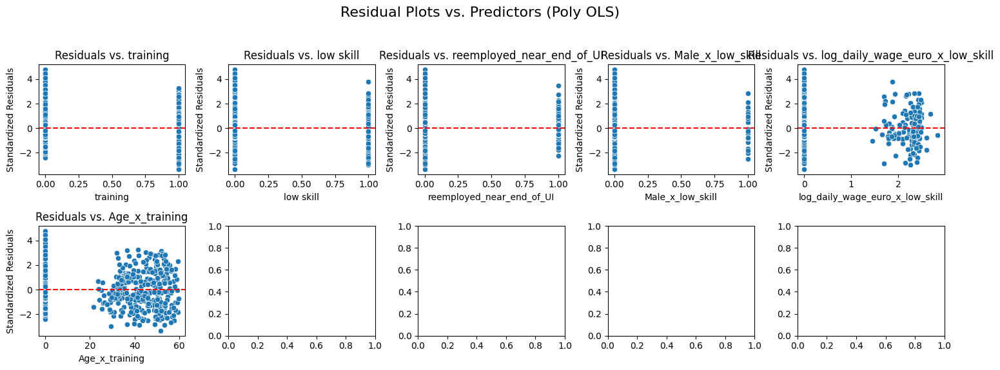

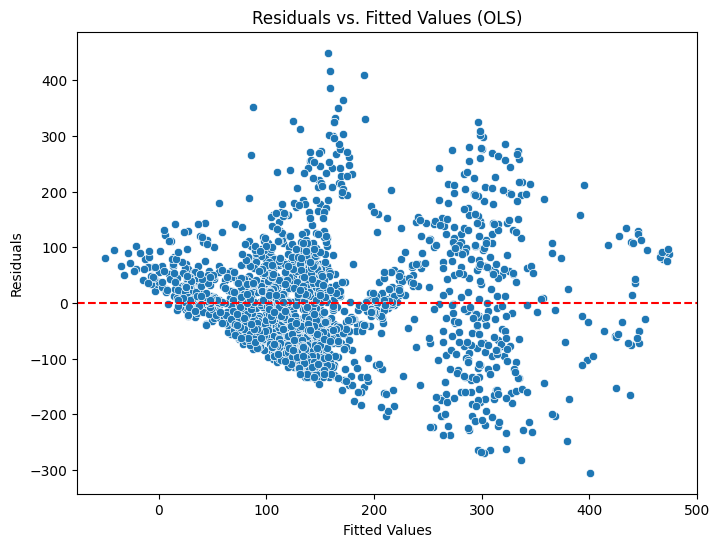

In [ ]:
import numpy as np
from scipy import stats

# Check the minimum value in the column
min_value = data['time until reemployment'].min()

# If the minimum value is less than or equal to 0, shift all data to be positive
if min_value <= 0:
    # Add a constant to shift all values. The constant is 1 minus the minimum value (if negative or zero)
    shift = 1 - min_value
    data['time until reemployment'] += shift

# Applying Box-Cox Transformation
data['time until reemployment'], fitted_lambda = stats.boxcox(data['time until reemployment'])

# Re-running the regression with the transformed variable
X = data[['training', 'low skill',
              'reemployed_near_end_of_UI',
               'Male_x_low_skill',
              'log_daily_wage_euro_x_low_skill',
              'Age_x_training'
               ]]
X = sm.add_constant(X)
model = sm.OLS(data['time until reemployment'], X).fit()

print(model.summary())

def plot_residuals_vs_predictor(data, model, predictor, ax):
    norm_resid = model.get_influence().resid_studentized_internal
    sns.scatterplot(x=data[predictor], y=norm_resid, ax=ax)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Standardized Residuals')
import math

num_predictors = len(X.columns) - 1  # Exclude the constant term
num_rows = math.ceil(num_predictors / 5)  # Round up to the nearest integer

fig, axes = plt.subplots(nrows=num_rows, ncols=5, figsize=(15, 3 * num_rows))
fig.suptitle('Residual Plots vs. Predictors (Poly OLS)', fontsize=16)

for i, predictor in enumerate(X.columns[1:]):  # Skip the constant term
    plot_residuals_vs_predictor(data, model_poly_ols, predictor, axes[i // 5, i % 5])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# 1. Residuals vs. Fitted Plot (OLS)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=model_ols.fittedvalues, y=model_ols.resid)
plt.axhline(y=0, color='r', linestyle='dashed')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values (OLS)")
plt.show()

In [ ]:
import statsmodels.api as sm

# Suppose you already have a model, we first predict residuals
ols_res = sm.OLS(data['time until reemployment'], sm.add_constant(data['UI_quantile_normal'])).fit()
data['residuals'] = ols_res.resid

# Model the variance of residuals using `UI_quantile_normal`
# Here, using a simple model as an example, you might need a more complex one
var_model = sm.OLS(data['residuals']**2, sm.add_constant(data['UI_quantile_normal'])).fit()

# Predicted variances
predicted_var = var_model.predict(sm.add_constant(data['UI_quantile_normal']))

# Weights are inverse of predicted variances
weights = 1 / predicted_var

# Fit WLS using these weights
wls_model = sm.WLS(data['time until reemployment'], sm.add_constant(data['UI_quantile_normal']), weights=weights).fit()
print(wls_model.summary())


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:775: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(self.weights)[:, None] * x
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:773: RuntimeWarning: invalid value encountered in sqrt
  return x * np.sqrt(self.weights)


LinAlgError: SVD did not converge

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Suppose you already have a model, we first predict residuals
ols_res = sm.OLS(data['time until reemployment'], sm.add_constant(data['UI_quantile_normal'])).fit()
data['residuals'] = ols_res.resid

# Model the variance of residuals using `UI_quantile_normal`
var_model = sm.OLS(data['residuals']**2, sm.add_constant(data['UI_quantile_normal'])).fit()

# Predicted variances
predicted_var = var_model.predict(sm.add_constant(data['UI_quantile_normal']))

# Check and adjust non-positive predicted variances
if np.any(predicted_var <= 0):
    predicted_var[predicted_var <= 0] = np.nan  # Set non-positive values to NaN

# Replace NaNs in predicted_var with the mean of the remaining positive predicted_var values
mean_var = np.nanmean(predicted_var)
predicted_var = np.where(np.isnan(predicted_var), mean_var, predicted_var)

# Weights are inverse of adjusted predicted variances
weights = 1 / predicted_var

# Recalculate weights to avoid extreme values or zero weights
weights[~np.isfinite(weights)] = np.nanmedian(weights)  # Replace infinities and NaNs with the median of weights

# Add constant to the predictor for the WLS model
X = sm.add_constant(data['UI_quantile_normal'])

# Check for multicollinearity
vif_data = pd.DataFrame({
    'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])],
    'Variable': X.columns
})
print(vif_data)

# Fit WLS using these weights
wls_model = sm.WLS(data['time until reemployment'], X, weights=weights).fit()
print(wls_model.summary())


        VIF            Variable
0  1.004346               const
1  1.000000  UI_quantile_normal
                               WLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.152
Model:                                 WLS   Adj. R-squared:                  0.152
Method:                      Least Squares   F-statistic:                     390.5
Date:                     Sat, 11 May 2024   Prob (F-statistic):           4.59e-80
Time:                             17:42:26   Log-Likelihood:                -4034.8
No. Observations:                     2173   AIC:                             8074.
Df Residuals:                         2171   BIC:                             8085.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                         coef    std err          t      P>|t|  


WLS Model Summary:
                               WLS Regression Results                              
Dep. Variable:     time until reemployment   R-squared:                       0.512
Model:                                 WLS   Adj. R-squared:                  0.511
Method:                      Least Squares   F-statistic:                     324.9
Date:                     Sun, 12 May 2024   Prob (F-statistic):               0.00
Time:                             04:36:55   Log-Likelihood:                -12693.
No. Observations:                     2173   AIC:                         2.540e+04
Df Residuals:                         2165   BIC:                         2.545e+04
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

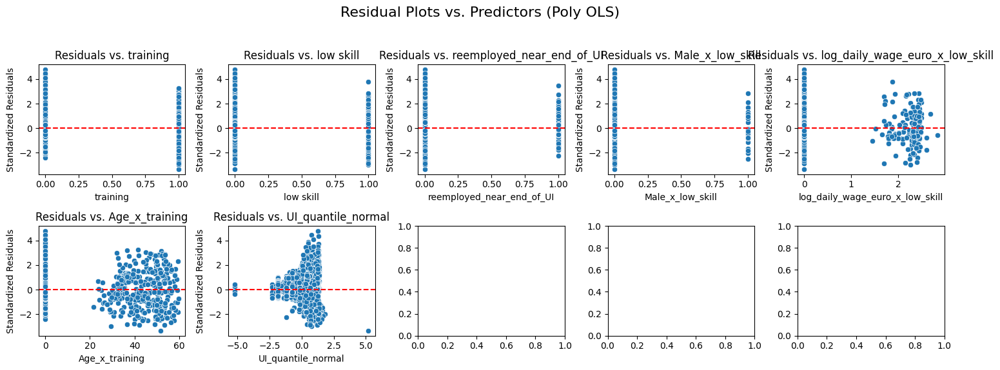

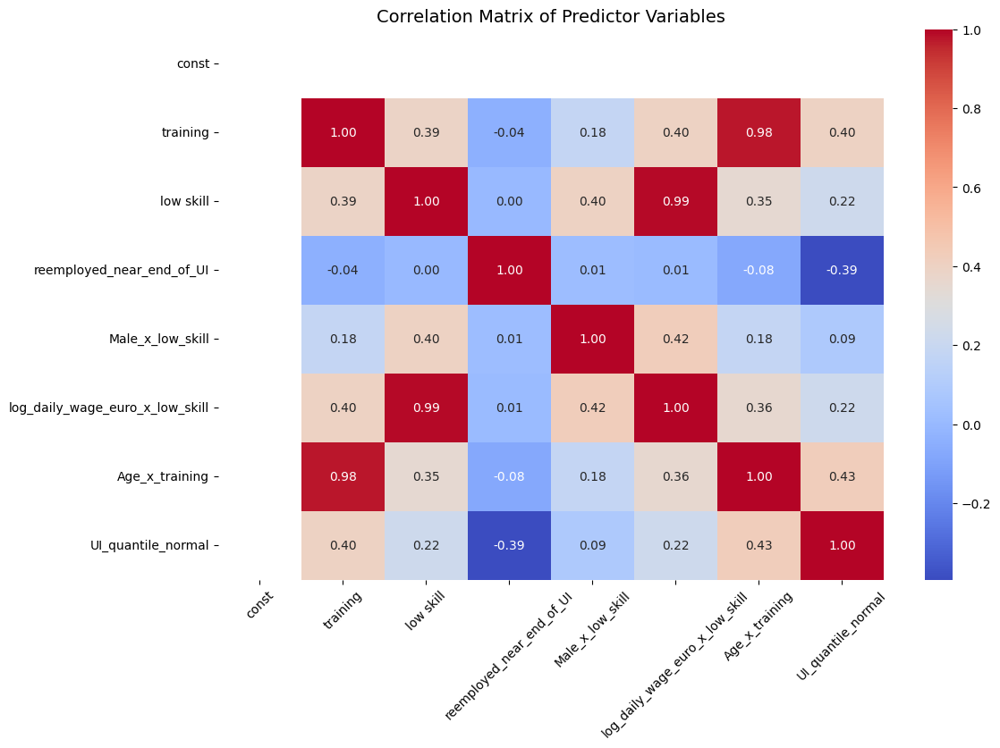

<Figure size 640x480 with 0 Axes>

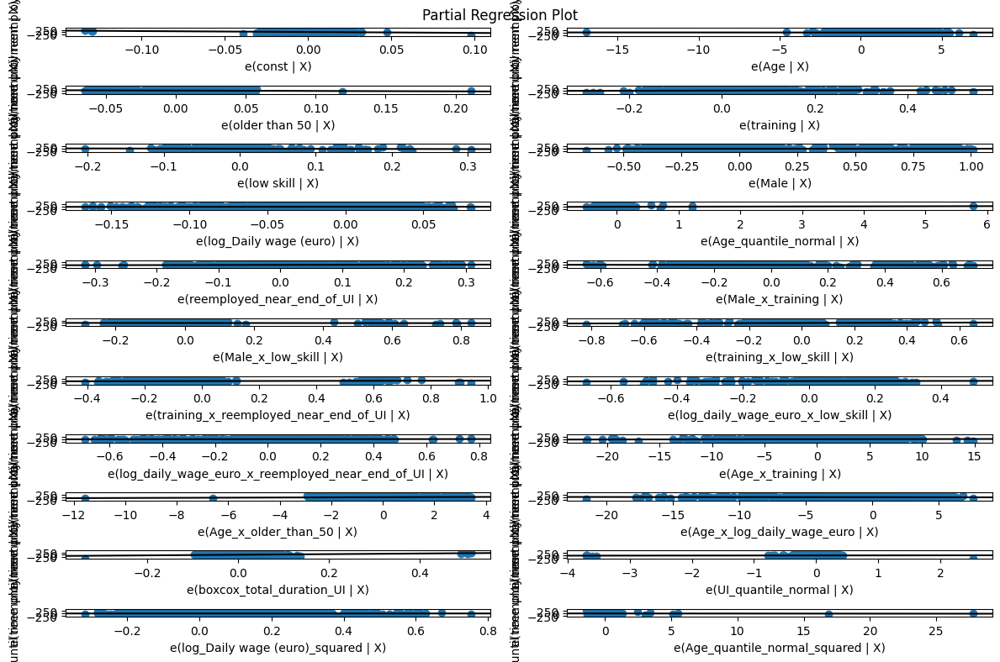

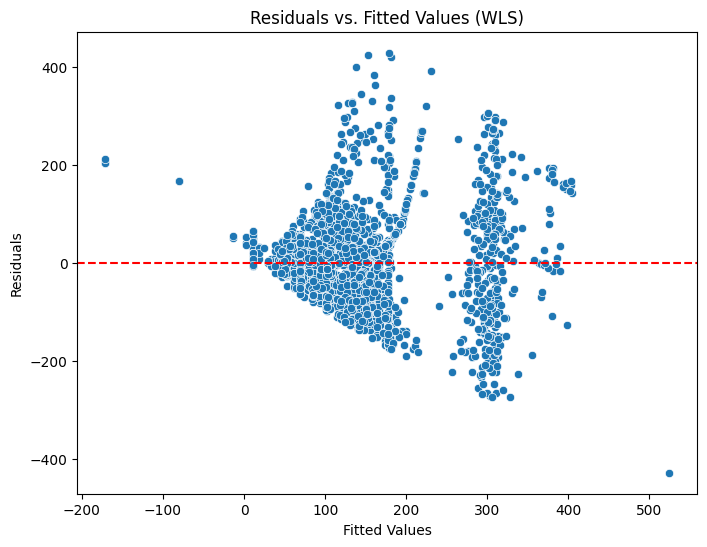

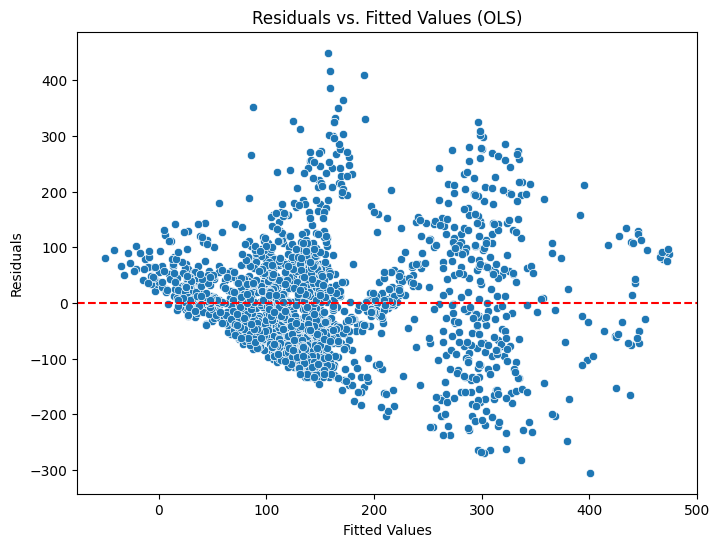

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming the initial OLS to get residuals
initial_ols = sm.OLS(data['time until reemployment'], sm.add_constant(data['UI_quantile_normal'])).fit()
data['residuals'] = initial_ols.resid

# Modeling the variance of residuals as a function of 'UI_quantile_normal'
variance_model = sm.OLS(data['residuals']**2, sm.add_constant(data['UI_quantile_normal'])).fit()

# Predicting the variances from the model
predicted_variances = variance_model.predict(sm.add_constant(data['UI_quantile_normal']))

# Handling zero or negative variances by setting them to the mean of the positive predicted variances
positive_var_mean = np.mean(predicted_variances[predicted_variances > 0])
weights = 1 / np.where(predicted_variances <= 0, positive_var_mean, predicted_variances)

# Define the model variables
X = data[['training', 'low skill', 'reemployed_near_end_of_UI', 'Male_x_low_skill',
          'log_daily_wage_euro_x_low_skill', 'Age_x_training', 'UI_quantile_normal']]
X = sm.add_constant(X)  # adding a constant
y = data['time until reemployment']

# Fit the WLS model using the new weights
model_wls = sm.WLS(y, X, weights=weights).fit()

# Print the summary of the WLS model
print("\nWLS Model Summary:")
print(model_wls.summary())



# 5. Residuals vs. Predictors (Poly OLS Only)
# Function to plot residuals against a given predictor
def plot_residuals_vs_predictor(data, model, predictor, ax):
    norm_resid = model.get_influence().resid_studentized_internal
    sns.scatterplot(x=data[predictor], y=norm_resid, ax=ax)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(f'Residuals vs. {predictor}')
    ax.set_xlabel(predictor)
    ax.set_ylabel('Standardized Residuals')
import math

num_predictors = len(X.columns) - 1  # Exclude the constant term
num_rows = math.ceil(num_predictors / 5)  # Round up to the nearest integer

fig, axes = plt.subplots(nrows=num_rows, ncols=5, figsize=(15, 3 * num_rows))
fig.suptitle('Residual Plots vs. Predictors (Poly OLS)', fontsize=16)

for i, predictor in enumerate(X.columns[1:]):  # Skip the constant term
    plot_residuals_vs_predictor(data, model_poly_ols, predictor, axes[i // 5, i % 5])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Correlation Matrix (Heatmap) - separate and larger
correlation_matrix = X.corr()  # Calculate the correlation matrix

plt.figure(figsize=(12, 8))  # Create a new figure for the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Predictor Variables', fontsize=14)  # Adjust fontsize for clarity
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
plt.yticks(rotation=0)   # Optionally rotate y-axis labels if needed
plt.show()

plt.tight_layout()
plt.show()

from statsmodels.graphics.regressionplots import plot_partregress_grid

fig = plt.figure(figsize=(12, 8))
plot_partregress_grid(model_poly_ols, fig=fig)
plt.show()

# 1. Residuals vs. Fitted Plot (WLS)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=model_wls.fittedvalues, y=model_wls.resid)
plt.axhline(y=0, color='r', linestyle='dashed')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values (WLS)")
plt.show()

# 1. Residuals vs. Fitted Plot (OLS)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=model_ols.fittedvalues, y=model_ols.resid)
plt.axhline(y=0, color='r', linestyle='dashed')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted Values (OLS)")
plt.show()

In [ ]:
X = data[['Age', 'Male', 'older than 50', 'Daily wage (euro)', 'training', 'low skill', 'total duration of UI benefits']]  # Assume 'Male' and 'training' are binary categorical variables